Note: The obtained analyzes are at the bottom of the page

In [178]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import warnings
warnings.filterwarnings('ignore')
sns.set()

In [2]:
df = pd.read_csv('shopping_trends_updated.csv')
df.head()

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually


In [3]:
df.shape

(3900, 18)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Customer ID             3900 non-null   int64  
 1   Age                     3900 non-null   int64  
 2   Gender                  3900 non-null   object 
 3   Item Purchased          3900 non-null   object 
 4   Category                3900 non-null   object 
 5   Purchase Amount (USD)   3900 non-null   int64  
 6   Location                3900 non-null   object 
 7   Size                    3900 non-null   object 
 8   Color                   3900 non-null   object 
 9   Season                  3900 non-null   object 
 10  Review Rating           3900 non-null   float64
 11  Subscription Status     3900 non-null   object 
 12  Shipping Type           3900 non-null   object 
 13  Discount Applied        3900 non-null   object 
 14  Promo Code Used         3900 non-null   

In [5]:
df.isnull().sum()

Customer ID               0
Age                       0
Gender                    0
Item Purchased            0
Category                  0
Purchase Amount (USD)     0
Location                  0
Size                      0
Color                     0
Season                    0
Review Rating             0
Subscription Status       0
Shipping Type             0
Discount Applied          0
Promo Code Used           0
Previous Purchases        0
Payment Method            0
Frequency of Purchases    0
dtype: int64

In [6]:
df.drop(columns = ['Customer ID'], axis = 1, inplace = True)

In [7]:
df.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually


In [8]:
df.columns

Index(['Age', 'Gender', 'Item Purchased', 'Category', 'Purchase Amount (USD)',
       'Location', 'Size', 'Color', 'Season', 'Review Rating',
       'Subscription Status', 'Shipping Type', 'Discount Applied',
       'Promo Code Used', 'Previous Purchases', 'Payment Method',
       'Frequency of Purchases'],
      dtype='object')

In [9]:
df.describe()

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
count,3900.000000,3900.000000,3900.000000,3900.000000
mean,44.068462,59.764359,3.749949,25.351538
std,15.207589,23.685392,0.716223,14.447125
min,18.000000,20.000000,2.500000,1.000000
25%,31.000000,39.000000,3.100000,13.000000
50%,44.000000,60.000000,3.700000,25.000000
75%,57.000000,81.000000,4.400000,38.000000
max,70.000000,100.000000,5.000000,50.000000


In [10]:
df.groupby('Gender').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Gender,,,,
Female,44.007212,60.249199,3.741426,24.596154
Male,44.097285,59.536199,3.753959,25.707014


In [11]:
df.groupby('Item Purchased').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Item Purchased,,,,
Backpack,42.895105,60.391608,3.752448,23.566434
Belt,42.440994,59.844720,3.761491,24.080745
Blouse,44.286550,60.877193,3.683626,26.684211
Boots,44.847222,62.625000,3.812500,26.361111
Coat,43.217391,57.608696,3.730435,26.813665
Dress,44.602410,62.168675,3.754819,26.548193
Gloves,43.071429,60.550000,3.864286,26.442857
Handbag,46.052288,57.888889,3.775163,24.712418
Hat,43.551948,60.876623,3.806494,25.331169


In [12]:
df.groupby('Category').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Category,,,,
Accessories,44.224194,59.838710,3.768629,25.725806
Clothing,43.782959,60.025331,3.723143,25.199194
Footwear,44.442404,60.255426,3.790651,25.232053
Outerwear,44.311728,57.172840,3.746914,24.956790


In [13]:
df.groupby('Location').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Location,,,,
Alabama,44.314607,59.112360,3.782022,27.449438
Alaska,43.000000,67.597222,3.802778,28.097222
Arizona,45.276923,66.553846,3.693846,28.369231
Arkansas,44.101266,61.113924,3.724051,27.063291
California,42.663158,59.000000,3.834737,24.494737
Colorado,44.146667,56.293333,3.726667,23.973333
Connecticut,47.320513,54.179487,3.694872,24.000000
Delaware,43.069767,55.325581,3.795349,24.627907
Florida,42.323529,55.852941,3.679412,26.132353


In [14]:
df.groupby('Size').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Size,,,,
L,44.571700,58.563153,3.752707,25.708452
M,44.025641,59.924217,3.718860,25.304843
S,43.865762,61.037707,3.793213,24.779789
XL,43.321678,60.090909,3.803497,25.550117


In [15]:
df.groupby('Color').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Color,,,,
Beige,45.734694,60.414966,3.609524,24.897959
Black,44.880240,58.401198,3.840120,25.820359
Blue,44.973684,56.953947,3.667763,23.697368
Brown,43.113475,59.063830,3.748936,26.382979
Charcoal,44.869281,60.633987,3.783007,24.359477
Cyan,43.114458,61.891566,3.626506,27.222892
Gold,43.398551,61.007246,3.670290,24.260870
Gray,44.993711,62.490566,3.880503,28.295597
Green,42.556213,65.704142,3.684615,24.621302


In [16]:
df.groupby('Season').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Season,,,,
Fall,44.391795,61.556923,3.729949,24.970256
Spring,44.582583,58.737738,3.790591,25.116116
Summer,43.973822,58.405236,3.725654,25.408377
Winter,43.307930,60.357364,3.752111,25.920700


In [17]:
df.groupby('Subscription Status').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Subscription Status,,,,
No,44.008430,59.865121,3.752722,25.080436
Yes,44.230769,59.491928,3.742450,26.084520


In [18]:
df.groupby('Shipping Type').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Shipping Type,,,,
2-Day Shipping,43.834131,60.733652,3.761085,26.105263
Express,44.958204,60.475232,3.776935,25.496904
Free Shipping,43.992593,60.410370,3.717926,24.743704
Next Day Air,43.462963,58.631173,3.720833,24.771605
Standard,44.764526,58.460245,3.817737,26.232416
Store Pickup,43.392308,59.893846,3.706462,24.803077


In [19]:
df.groupby('Discount Applied').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Discount Applied,,,,
No,44.010796,60.130454,3.757715,25.056230
Yes,44.144902,59.279070,3.739654,25.742993


In [20]:
df.groupby('Promo Code Used').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Promo Code Used,,,,
No,44.010796,60.130454,3.757715,25.056230
Yes,44.144902,59.279070,3.739654,25.742993


In [21]:
df.groupby('Payment Method').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Payment Method,,,,
Bank Transfer,43.864379,59.712418,3.701634,24.501634
Cash,44.080597,59.704478,3.750448,25.253731
Credit Card,44.633383,60.074516,3.782861,25.588674
Debit Card,44.072327,60.915094,3.759748,25.561321
PayPal,44.028065,59.245199,3.749631,25.509601
Venmo,43.694006,58.949527,3.751735,25.645110


In [22]:
df.groupby('Frequency of Purchases').mean(numeric_only = True)

,Age,Purchase Amount (USD),Review Rating,Previous Purchases
Frequency of Purchases,,,,
Annually,44.666084,60.173077,3.755944,24.561189
Bi-Weekly,43.201097,60.694698,3.706947,24.787934
Every 3 Months,43.407534,60.082192,3.767295,24.960616
Fortnightly,43.586716,59.053506,3.755166,25.271218
Monthly,44.283906,59.330922,3.776311,25.278481
Quarterly,44.685613,59.984014,3.727531,26.854352
Weekly,44.649351,58.972171,3.759555,25.771800


In [23]:
df_c = df[['Gender', 'Item Purchased', 'Age']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Gender', values = 'Age', aggfunc = 'mean')
b

Gender,Female,Male
Item Purchased,,
Backpack,40.675676,43.669811
Belt,44.400000,41.424528
Blouse,44.227273,44.323810
Boots,40.400000,47.212766
Coat,41.617021,43.877193
Dress,43.846154,44.947368
Gloves,46.189189,41.951456
Handbag,44.793103,46.821053
Hat,44.596154,43.019608


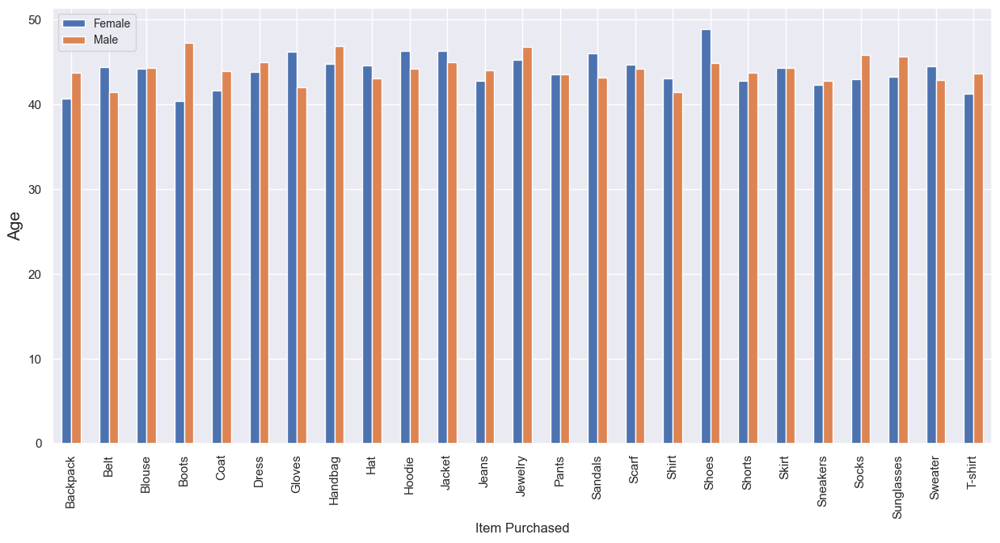

In [24]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Age', fontsize = 15)
plt.show()

In [25]:
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Gender', values = 'Age', aggfunc = 'min')

In [26]:
pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Gender', values = 'Age', aggfunc = 'max')

Gender,Female,Male
Item Purchased,,
Backpack,68,69
Belt,70,70
Blouse,70,70
Boots,68,70
Coat,68,70
Dress,68,70
Gloves,70,70
Handbag,69,70
Hat,70,70


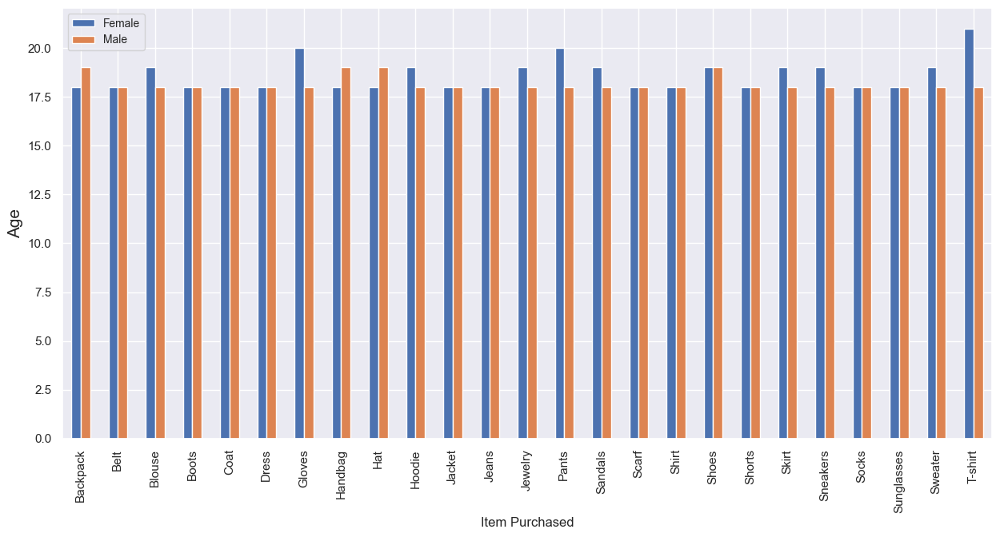

In [27]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Age', fontsize = 15)
plt.show()

In [28]:
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Gender', aggfunc = 'count')
b

Age     
Gender         Female Male
Item Purchased            
Backpack           37  106
Belt               55  106
Blouse             66  105
Boots              50   94
Coat               47  114
Dress              52  114
Gloves             37  103
Handbag            58   95
Hat                52  102
Hoodie             51  100
Jacket             54  109
Jeans              29   95
Jewelry            52  119
Pants              48  123
Sandals            59  101
Scarf              45  112
Shirt              59  110
Shoes              48  102
Shorts             48  109
Skirt              49  109
Sneakers           42  103
Socks              58  101
Sunglasses         56  105
Sweater            50  114
T-shirt            46  101

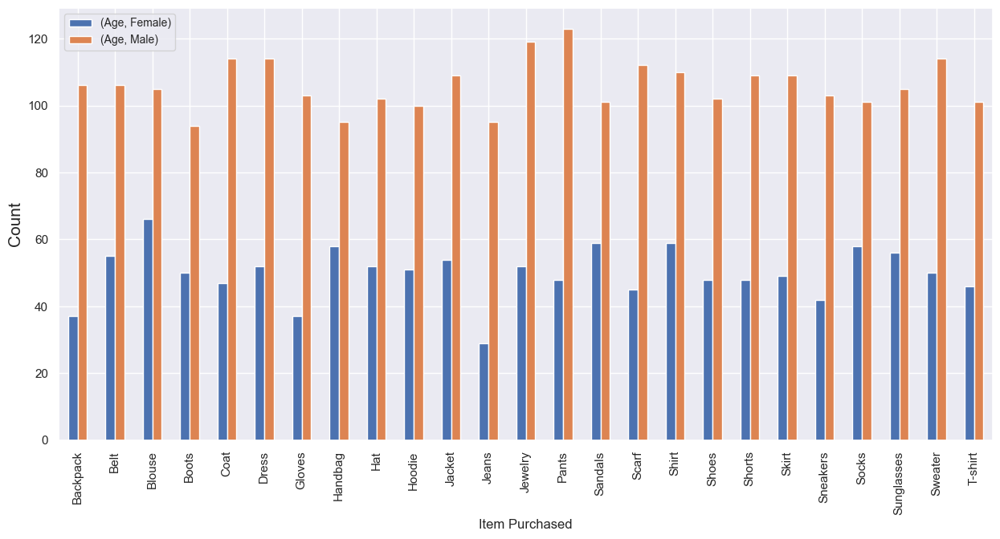

In [29]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [30]:
df_c = df[['Gender', 'Item Purchased', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Item Purchased,,
Backpack,65.216216,58.707547
Belt,58.345455,60.622642
Blouse,60.848485,60.895238
Boots,64.520000,61.617021
Coat,60.574468,56.385965
Dress,67.153846,59.894737
Gloves,65.297297,58.844660
Handbag,57.620690,58.052632
Hat,59.961538,61.343137


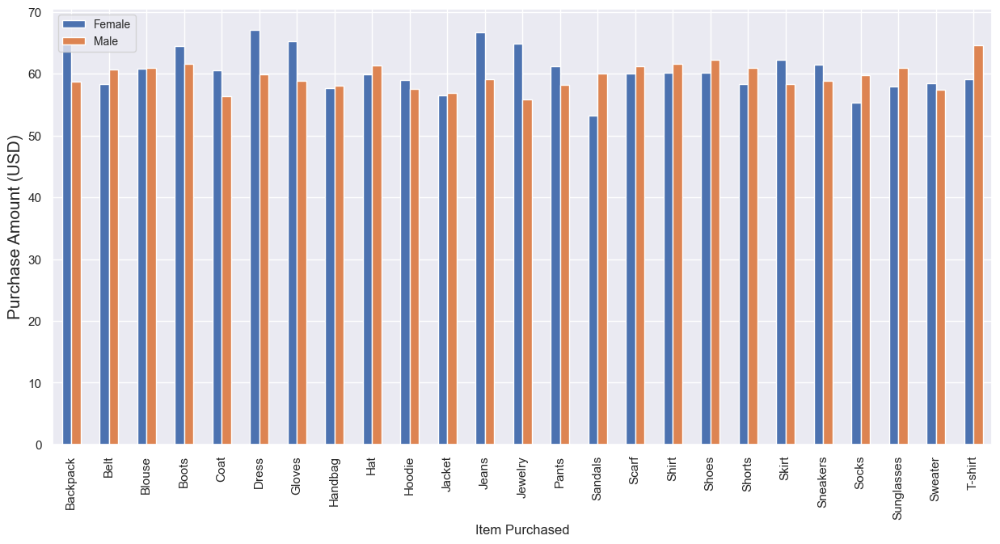

In [31]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [32]:
df_c = df[['Gender', 'Item Purchased', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Item Purchased,,
Backpack,3.645946,3.789623
Belt,3.601818,3.844340
Blouse,3.660606,3.698095
Boots,3.784000,3.827660
Coat,3.710638,3.738596
Dress,3.751923,3.756140
Gloves,3.786486,3.892233
Handbag,4.006897,3.633684
Hat,3.746154,3.837255


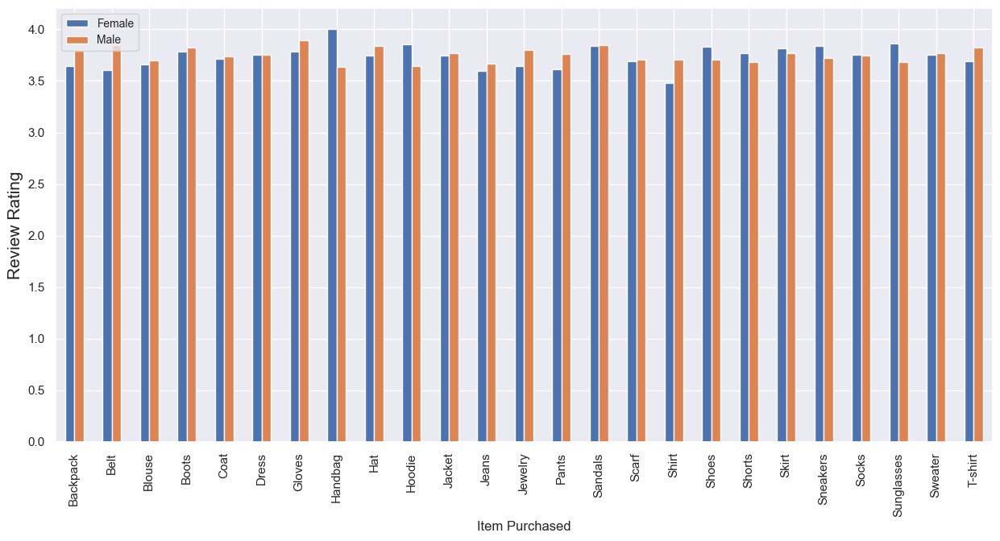

In [33]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [34]:
df_c = df[['Gender', 'Category', 'Age']]
b = pd.pivot_table(df_c, index = 'Category', columns = 'Gender', values = 'Age', aggfunc = 'mean')
b

Gender,Female,Male
Category,,
Accessories,44.283163,44.196934
Clothing,43.620504,43.859441
Footwear,44.482412,44.422500
Outerwear,44.128713,44.394619


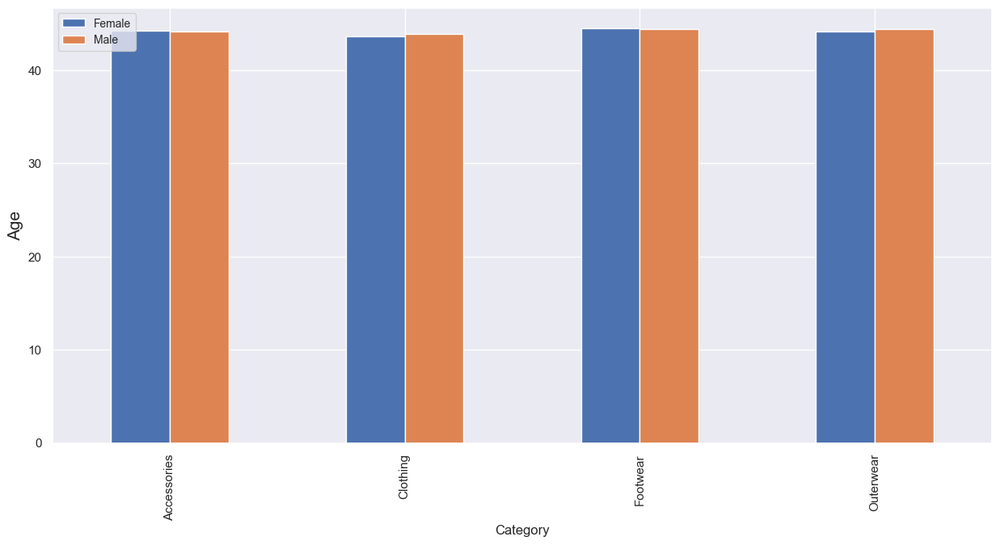

In [35]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Age', fontsize = 15)
plt.show()

In [36]:
b = pd.pivot_table(df_c, index = 'Category', columns = 'Gender', aggfunc = 'count')
b

Age      
Gender      Female  Male
Category                
Accessories    392   848
Clothing       556  1181
Footwear       199   400
Outerwear      101   223

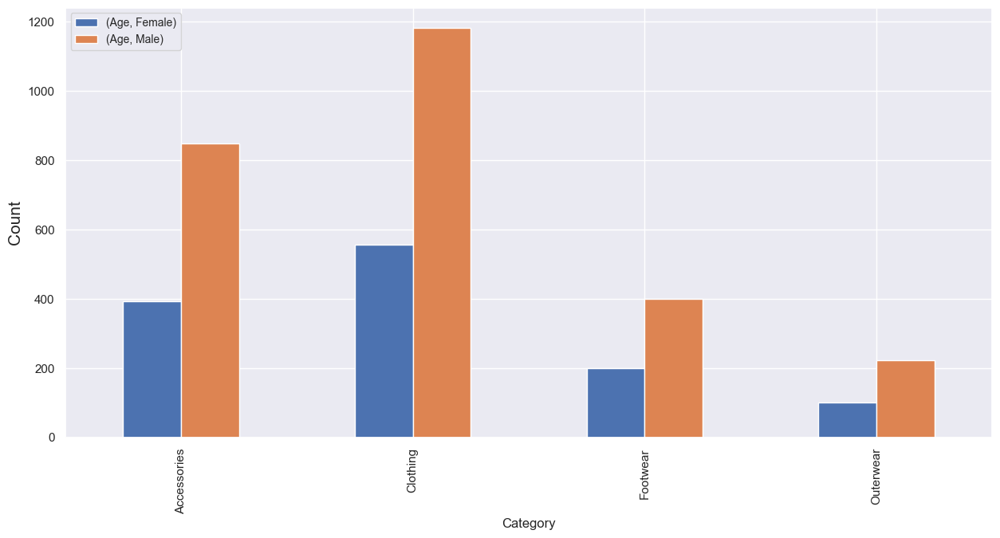

In [37]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [38]:
df_c = df[['Gender', 'Category', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Category', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Category,,
Accessories,60.762755,59.411557
Clothing,60.496403,59.803556
Footwear,59.472362,60.645000
Outerwear,58.425743,56.605381


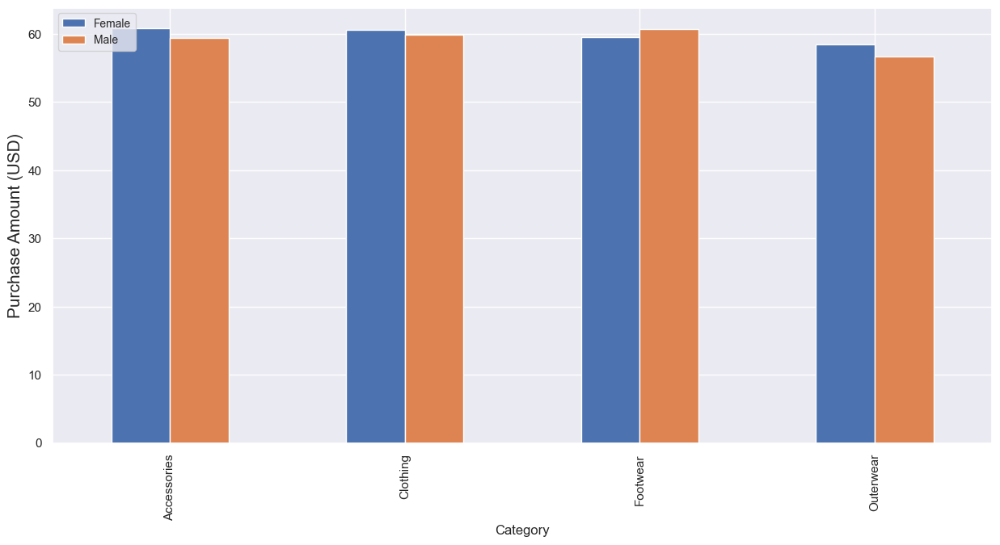

In [39]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [40]:
df_c = df[['Gender', 'Category', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Category', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Category,,
Accessories,3.755612,3.774646
Clothing,3.704496,3.731922
Footwear,3.822111,3.775000
Outerwear,3.730693,3.754260


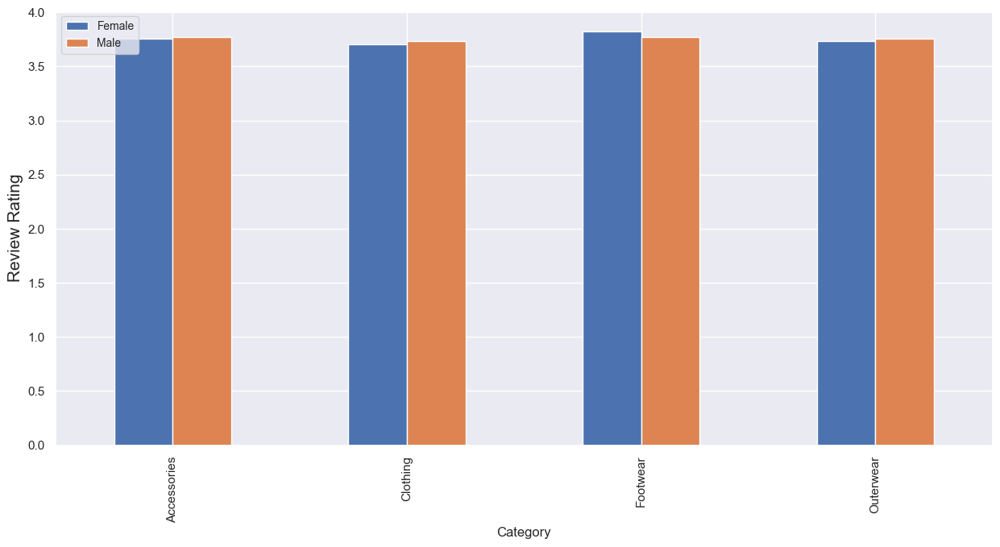

In [41]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [42]:
df_c = df[['Gender', 'Location', 'Age']]
b = pd.pivot_table(df_c, index = 'Location', columns = 'Gender', values = 'Age', aggfunc = 'mean')
b

Gender,Female,Male
Location,,
Alabama,45.111111,43.967742
Alaska,39.000000,45.000000
Arizona,45.920000,44.875000
Arkansas,43.320000,44.462963
California,46.103448,41.151515
Colorado,45.692308,43.326531
Connecticut,47.518519,47.215686
Delaware,41.720000,43.622951
Florida,38.600000,43.875000


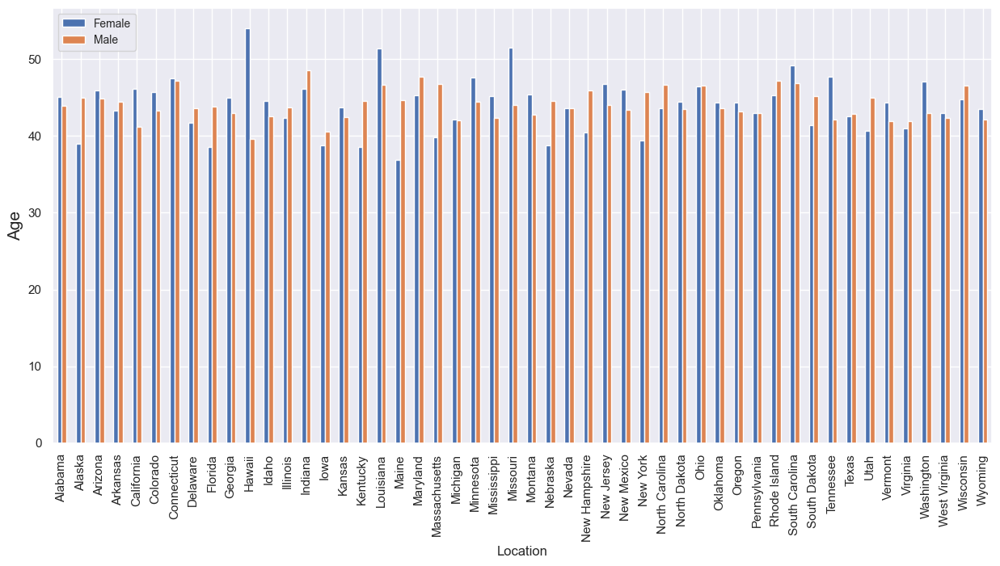

In [43]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Age', fontsize = 15)
plt.show()

In [44]:
df_c = df[['Gender', 'Location', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Location', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Location,,
Alabama,62.148148,57.790323
Alaska,72.083333,65.354167
Arizona,66.320000,66.700000
Arkansas,69.640000,57.166667
California,59.862069,58.621212
Colorado,58.730769,55.000000
Connecticut,59.814815,51.196078
Delaware,50.840000,57.163934
Florida,51.800000,57.541667


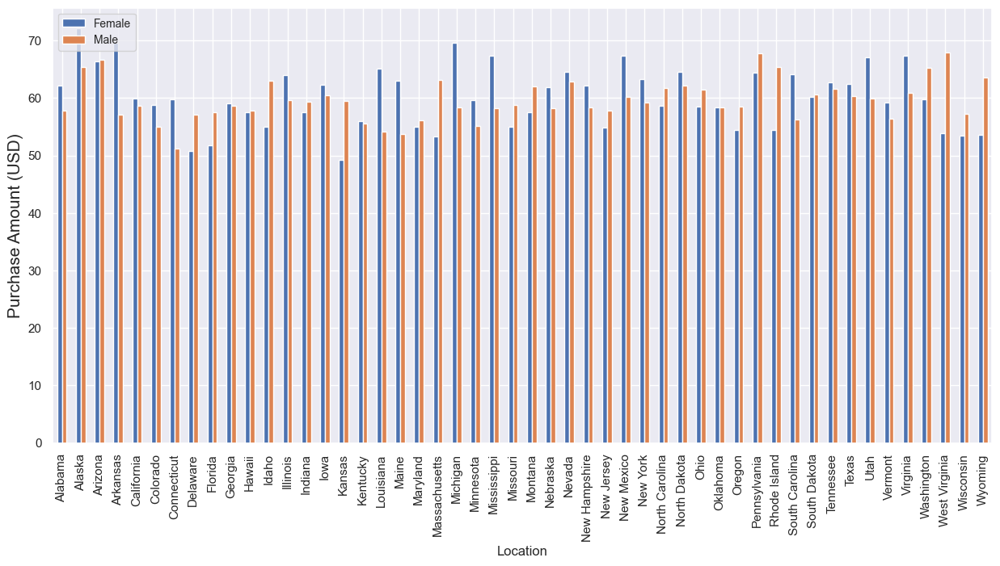

In [45]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [46]:
df_c = df[['Gender', 'Location', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Location', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Location,,
Alabama,3.600000,3.861290
Alaska,3.712500,3.847917
Arizona,3.648000,3.722500
Arkansas,3.588000,3.787037
California,3.706897,3.890909
Colorado,3.711538,3.734694
Connecticut,3.951852,3.558824
Delaware,3.684000,3.840984
Florida,3.885000,3.593750


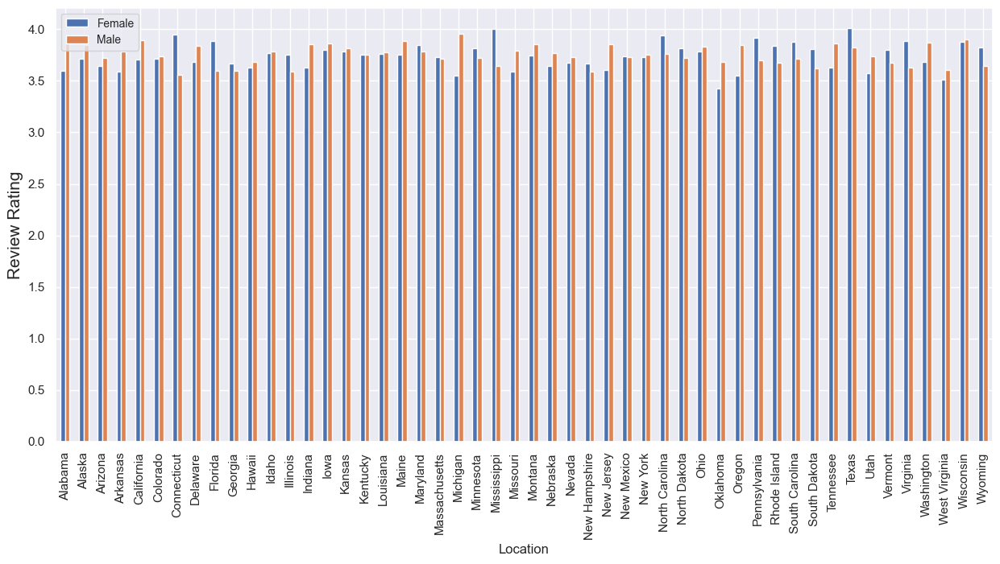

In [47]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [48]:
b = pd.pivot_table(df_c, index = 'Location', columns = 'Gender', aggfunc = 'count')
b

Review Rating     
Gender                Female Male
Location                         
Alabama                   27   62
Alaska                    24   48
Arizona                   25   40
Arkansas                  25   54
California                29   66
Colorado                  26   49
Connecticut               27   51
Delaware                  25   61
Florida                   20   48
Georgia                   30   49
Hawaii                    14   51
Idaho                     34   59
Illinois                  30   62
Indiana                   17   62
Iowa                      17   52
Kansas                    30   33
Kentucky                  30   49
Louisiana                 27   57
Maine                     27   50
Maryland                  28   58
Massachusetts             16   56
Michigan                  24   49
Minnesota                 28   60
Mississippi               25   55
Missouri                  18   63
Montana                   38   58
Nebraska                  29   58
Nevada                    29   58
New Hampshire             21   50
New Jersey                24   43
New Mexico                20   61
New York                  25   62
North Carolina            23   55
North Dakota              24   59
Ohio                      28   49
Oklahoma                  23   52
Oregon                    21   53
Pennsylvania              27   47
Rhode Island              23   40
South Carolina            21   55
South Dakota              22   48
Tennessee                 27   50
Texas                     33   44
Utah                      27   44
Vermont                   23   62
Virginia                  24   53
Washington                25   48
West Virginia             23   58
Wisconsin                 25   50
Wyoming                   20   51

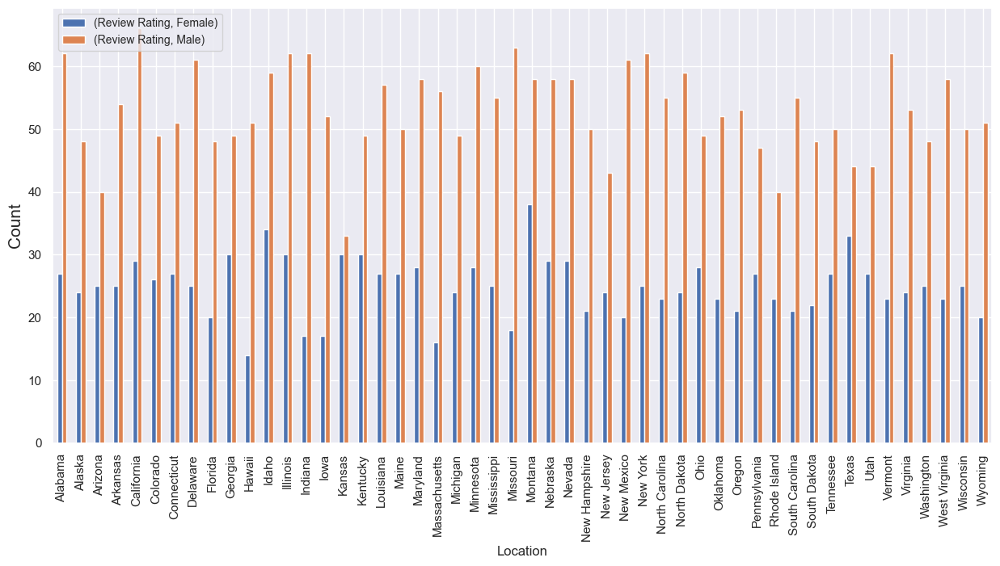

In [49]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [50]:
df_c = df[['Gender', 'Color', 'Age']]
b = pd.pivot_table(df_c, index = 'Color', columns = 'Gender', aggfunc = 'count')
b

Age     
Gender    Female Male
Color                
Beige         40  107
Black         54  113
Blue          52  100
Brown         46   95
Charcoal      50  103
Cyan          47  119
Gold          41   97
Gray          53  106
Green         56  113
Indigo        45  102
Lavender      48   99
Magenta       57   95
Maroon        54  104
Olive         59  118
Orange        51  103
Peach         48  101
Pink          58   95
Purple        42  109
Red           44  104
Silver        52  121
Teal          53  119
Turquoise     40  105
Violet        53  113
White         45   97
Yellow        60  114

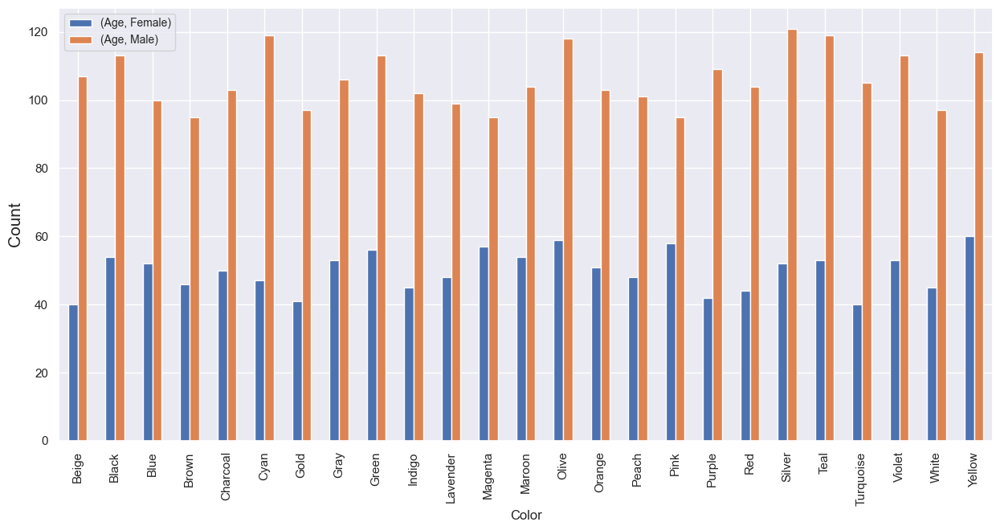

In [51]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [52]:
b = pd.pivot_table(df_c, index = 'Color', columns = 'Gender', values = 'Age', aggfunc = 'mean')
b

Gender,Female,Male
Color,,
Beige,46.500000,45.448598
Black,47.074074,43.831858
Blue,45.057692,44.930000
Brown,43.630435,42.863158
Charcoal,43.520000,45.524272
Cyan,42.085106,43.521008
Gold,42.975610,43.577320
Gray,45.018868,44.981132
Green,41.714286,42.973451


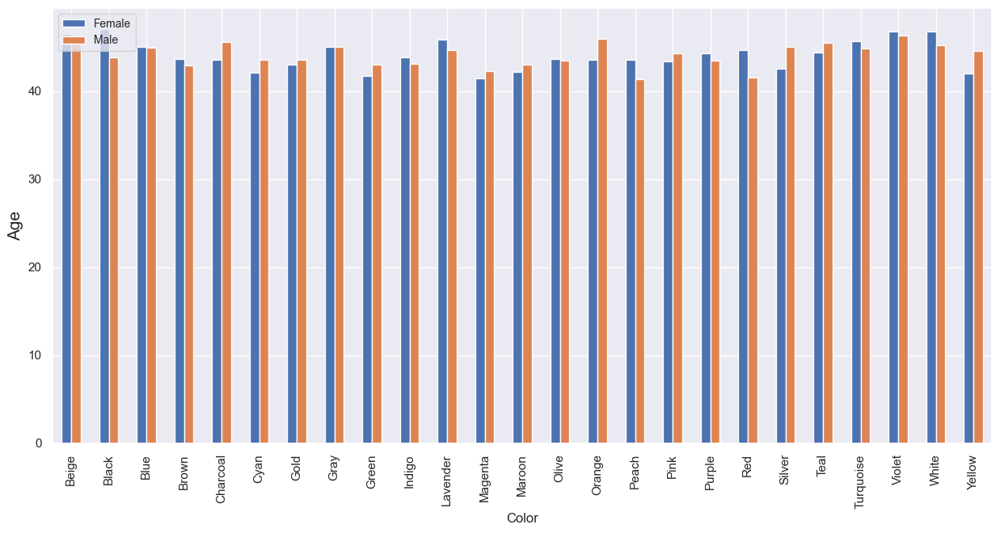

In [53]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Age', fontsize = 15)
plt.show()

In [54]:
df_c = df[['Color', 'Gender', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Color', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Color,,
Beige,58.425000,61.158879
Black,60.648148,57.327434
Blue,57.250000,56.800000
Brown,61.804348,57.736842
Charcoal,66.920000,57.582524
Cyan,61.893617,61.890756
Gold,59.975610,61.443299
Gray,58.716981,64.377358
Green,65.785714,65.663717


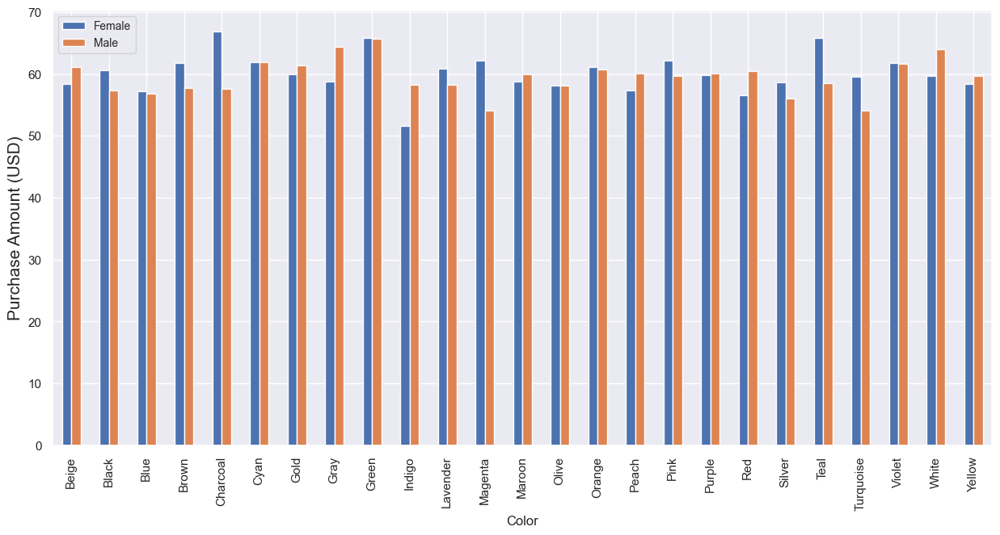

In [55]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [56]:
df_c = df[['Color', 'Gender', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Color', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Color,,
Beige,3.467500,3.662617
Black,3.768519,3.874336
Blue,3.696154,3.653000
Brown,3.613043,3.814737
Charcoal,3.848000,3.751456
Cyan,3.593617,3.639496
Gold,3.624390,3.689691
Gray,3.903774,3.868868
Green,3.735714,3.659292


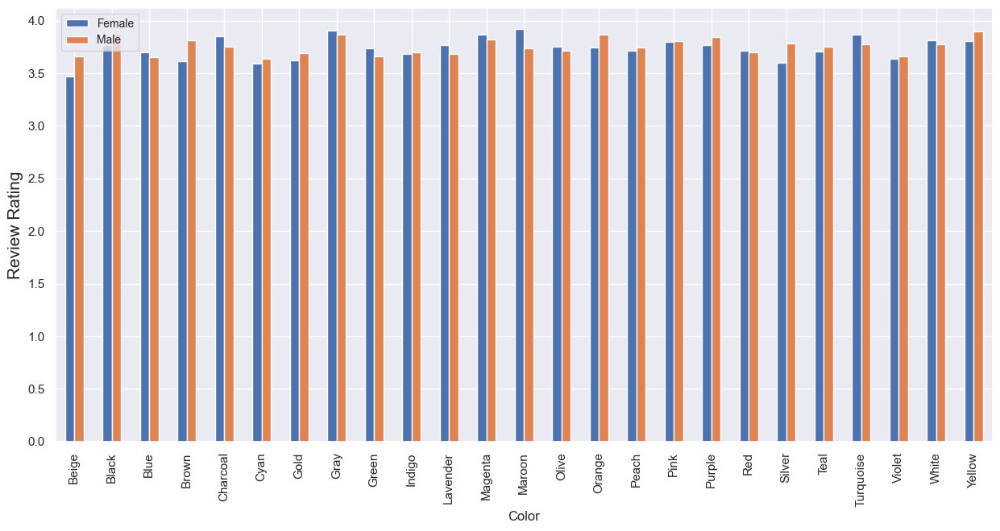

In [57]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [58]:
df_c = df[['Gender', 'Season', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Season', columns = 'Gender', aggfunc = 'count')
b

Purchase Amount (USD)     
Gender                Female Male
Season                           
Fall                     328  647
Spring                   316  683
Summer                   298  657
Winter                   306  665

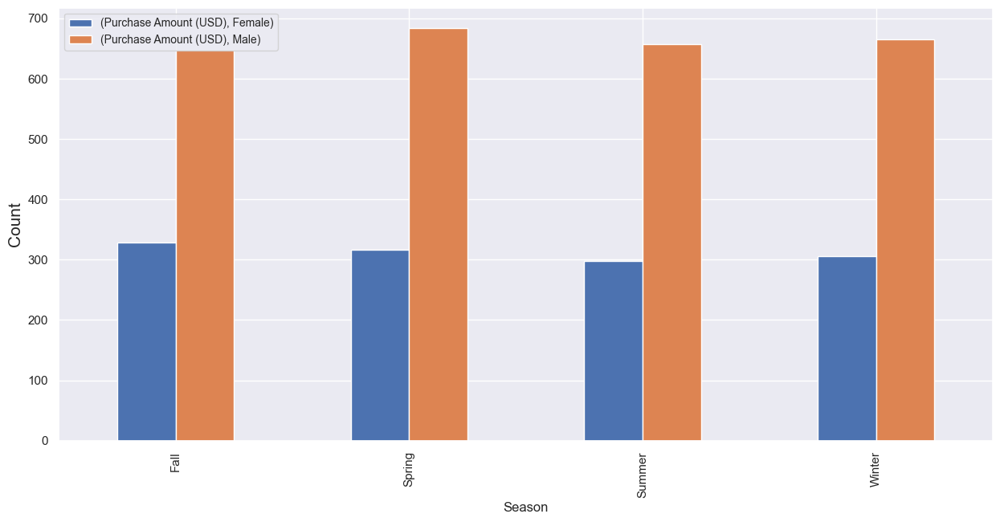

In [59]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [60]:
b = pd.pivot_table(df_c, index = 'Season', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Season,,
Fall,61.564024,61.553323
Spring,58.791139,58.713031
Summer,60.604027,57.407915
Winter,60.000000,60.521805


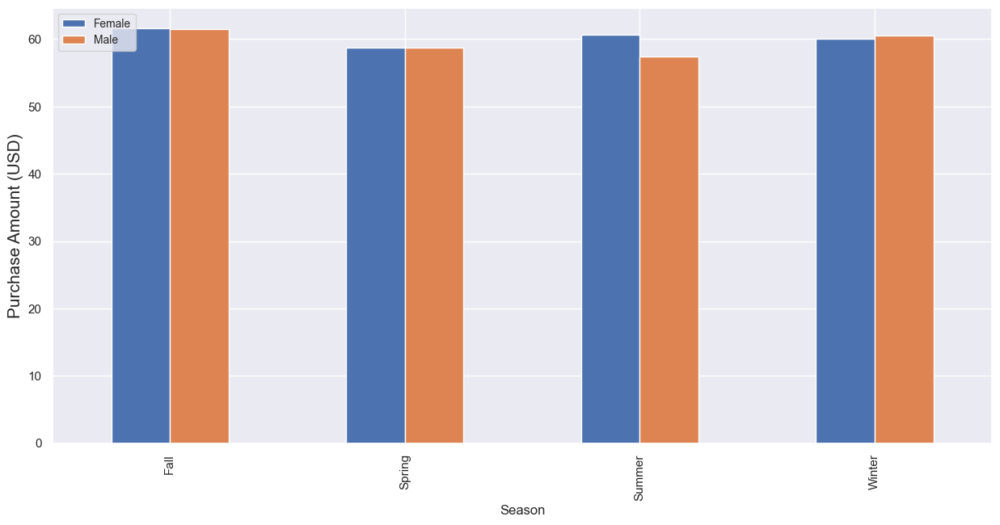

In [61]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [62]:
df_c = df[['Gender', 'Season', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Season', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Season,,
Fall,3.753963,3.717774
Spring,3.754430,3.807321
Summer,3.728188,3.724505
Winter,3.727451,3.763459


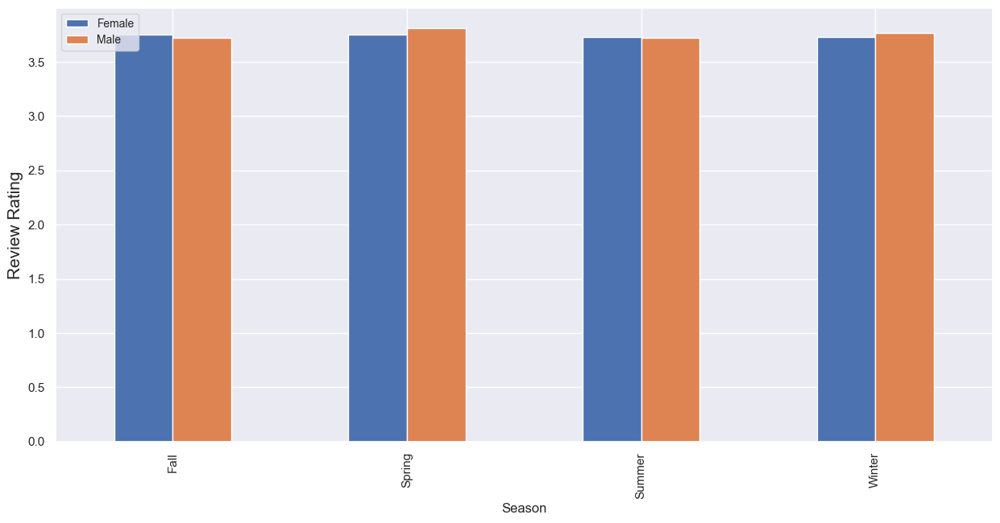

In [63]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [64]:
df_c = df[['Season', 'Gender', 'Age']]
b = pd.pivot_table(df_c, index = 'Season', columns = 'Gender', values = 'Age', aggfunc = 'mean')
b

Gender,Female,Male
Season,,
Fall,43.838415,44.672334
Spring,44.851266,44.458272
Summer,44.798658,43.599696
Winter,42.545752,43.658647


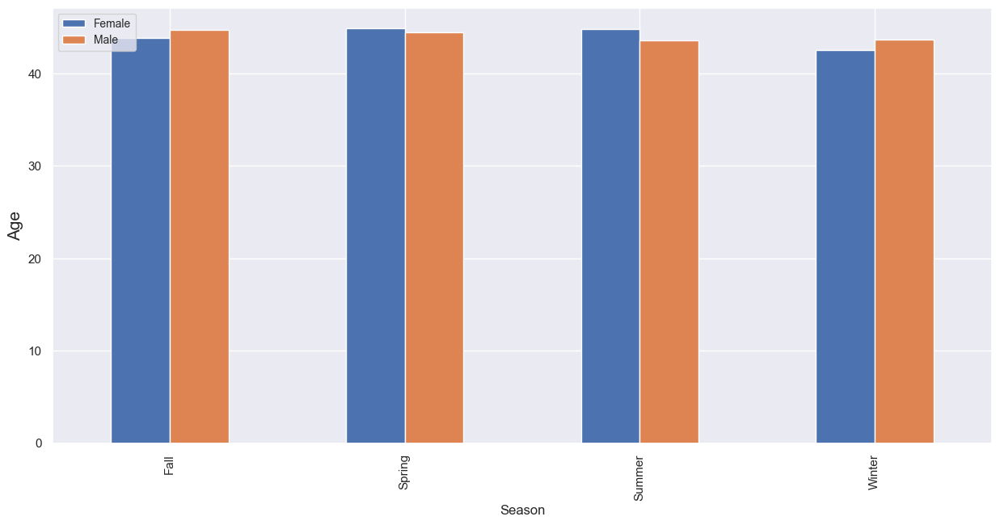

In [65]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Age', fontsize = 15)
plt.show()

In [66]:
df_c = df[['Subscription Status', 'Gender', 'Age']]
b = pd.pivot_table(df_c, index = 'Subscription Status', columns = 'Gender', aggfunc = 'count')
b

Age        
Gender               Female    Male
Subscription Status                
No                   1248.0  1599.0
Yes                     NaN  1053.0

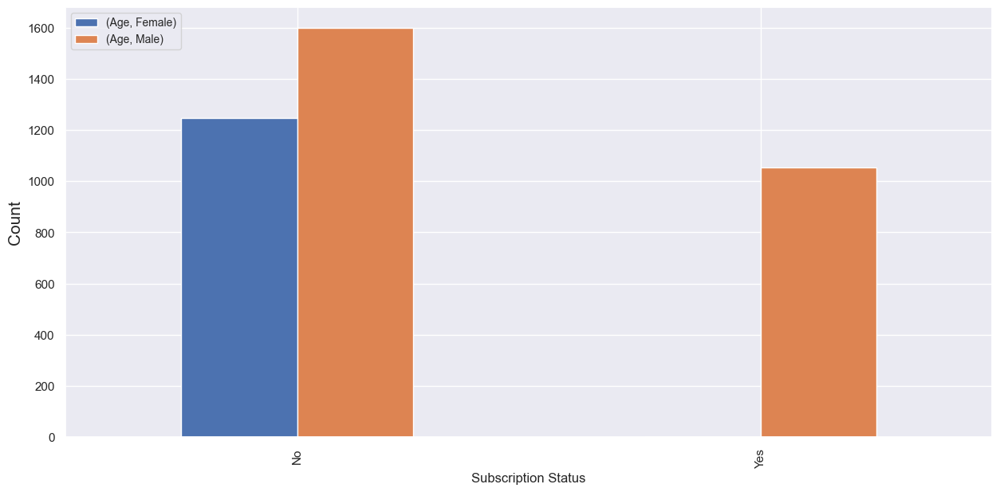

In [67]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [68]:
df_c = df[['Subscription Status', 'Gender', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Subscription Status', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Subscription Status,,
No,60.249199,59.565353
Yes,NaN,59.491928


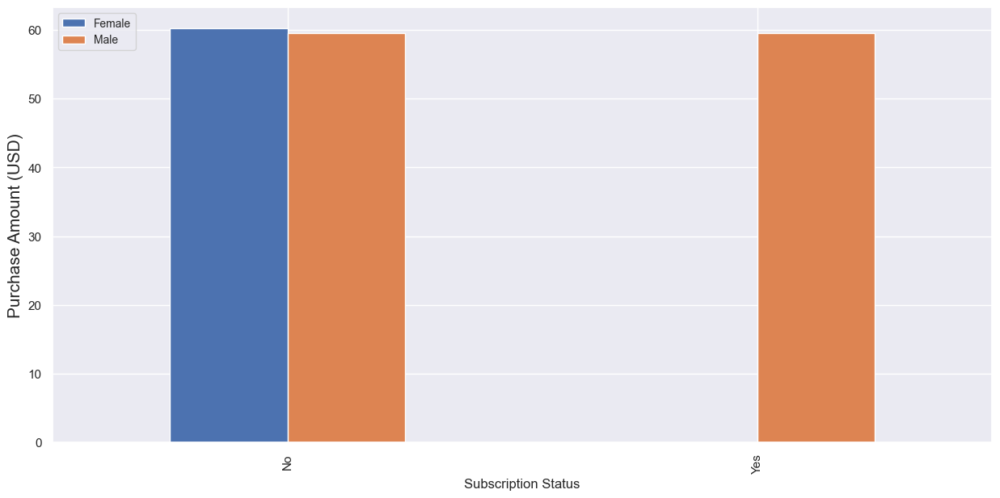

In [69]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [70]:
df_c = df[['Subscription Status', 'Gender', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Subscription Status', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Subscription Status,,
No,3.741426,3.761538
Yes,NaN,3.742450


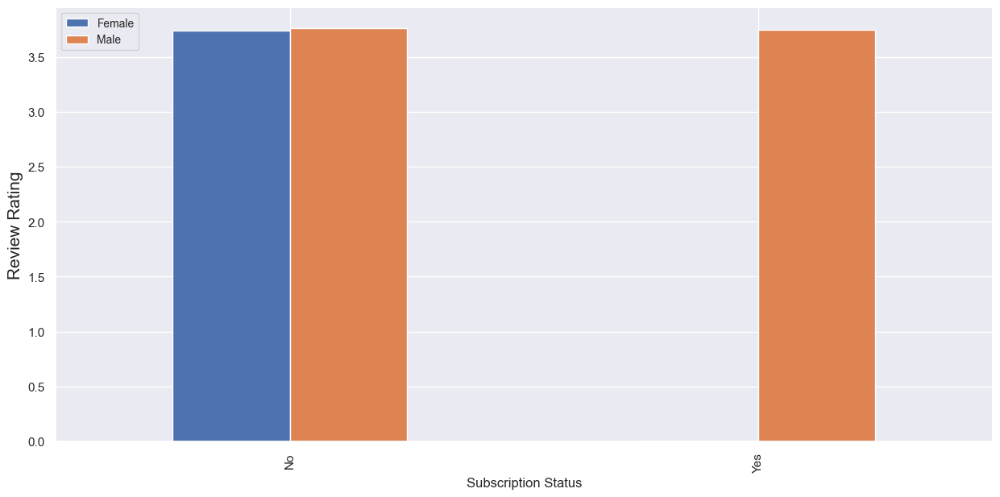

In [71]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [72]:
df_c = df[['Shipping Type', 'Gender', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Shipping Type', columns = 'Gender', aggfunc = 'count')
b

Purchase Amount (USD)     
Gender                        Female Male
Shipping Type                            
2-Day Shipping                   207  420
Express                          194  452
Free Shipping                    249  426
Next Day Air                     191  457
Standard                         213  441
Store Pickup                     194  456

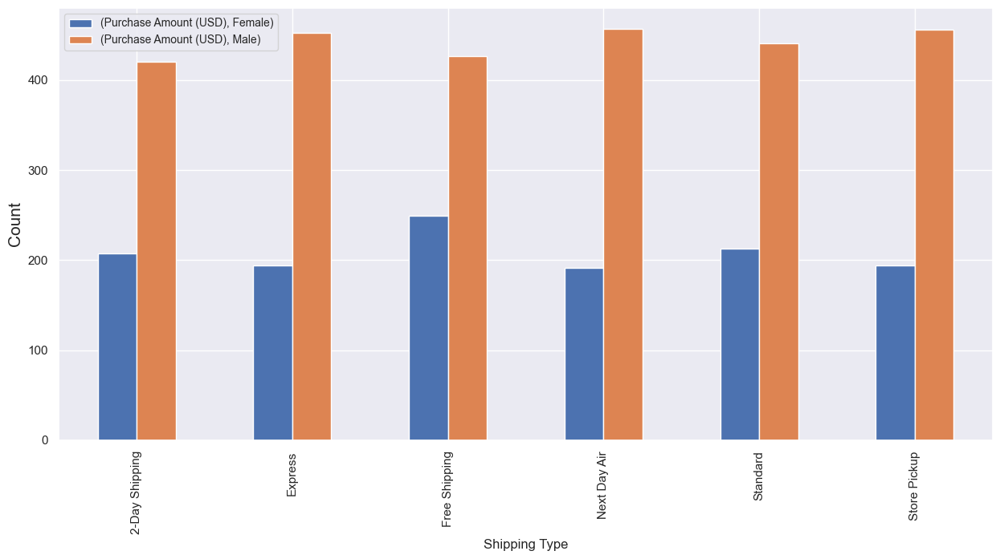

In [73]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [74]:
b = pd.pivot_table(df_c, index = 'Shipping Type', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Shipping Type,,
2-Day Shipping,59.362319,61.409524
Express,60.510309,60.460177
Free Shipping,61.132530,59.988263
Next Day Air,60.874346,57.693654
Standard,58.352113,58.512472
Store Pickup,61.268041,59.309211


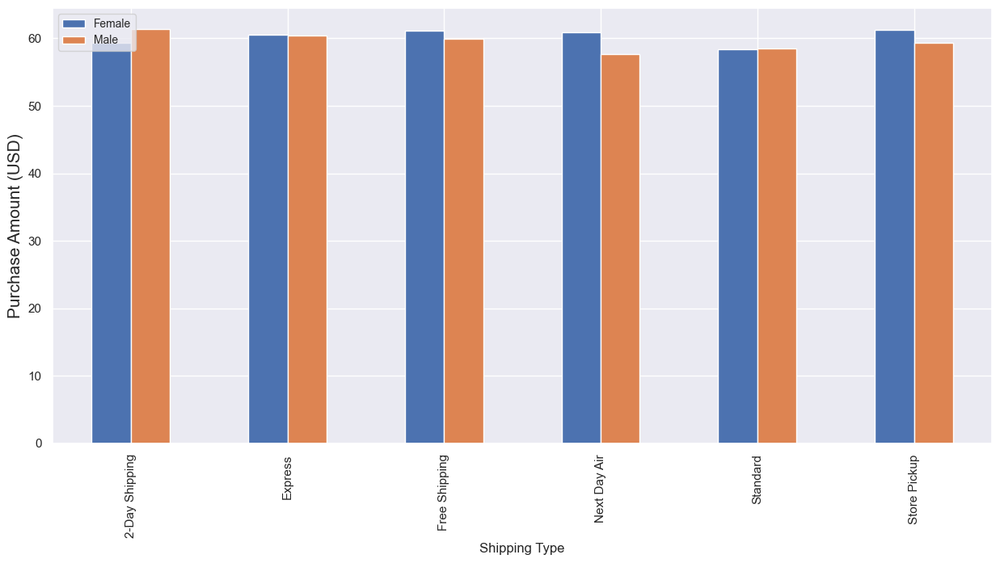

In [75]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [76]:
df_c = df[['Shipping Type', 'Gender', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Shipping Type', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Shipping Type,,
2-Day Shipping,3.700000,3.791190
Express,3.785567,3.773230
Free Shipping,3.739759,3.705164
Next Day Air,3.736126,3.714442
Standard,3.833333,3.810204
Store Pickup,3.647938,3.731360


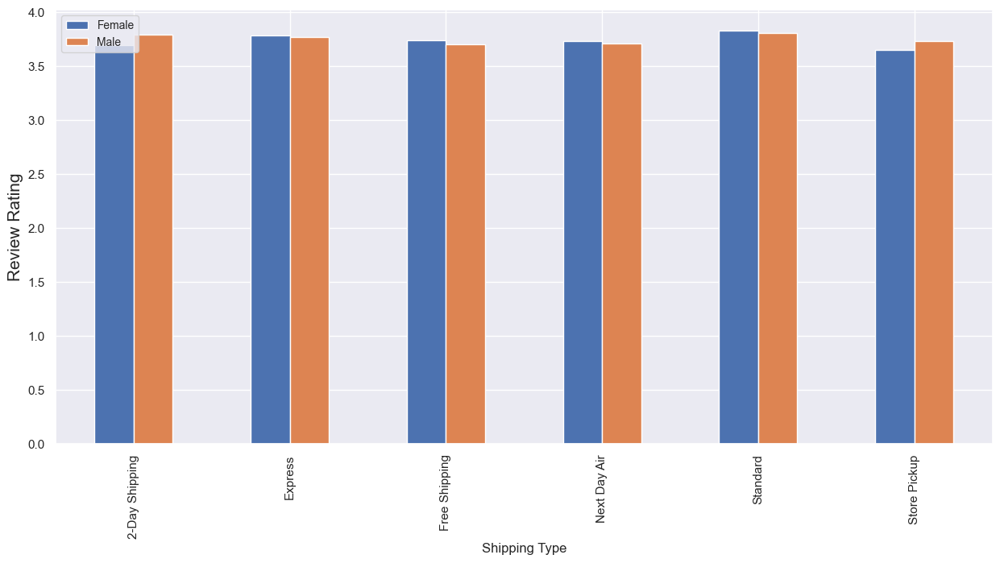

In [77]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [78]:
df_c = df[['Discount Applied', 'Gender', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Discount Applied', columns = 'Gender', aggfunc = 'count')
b

Purchase Amount (USD)        
Gender                          Female    Male
Discount Applied                              
No                              1248.0   975.0
Yes                                NaN  1677.0

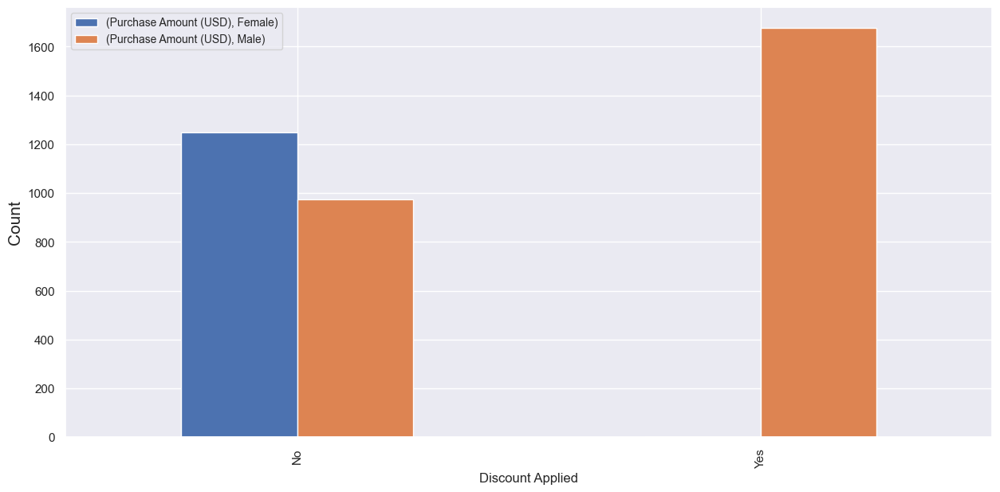

In [79]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [80]:
b = pd.pivot_table(df_c, index = 'Discount Applied', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Discount Applied,,
No,60.249199,59.978462
Yes,NaN,59.279070


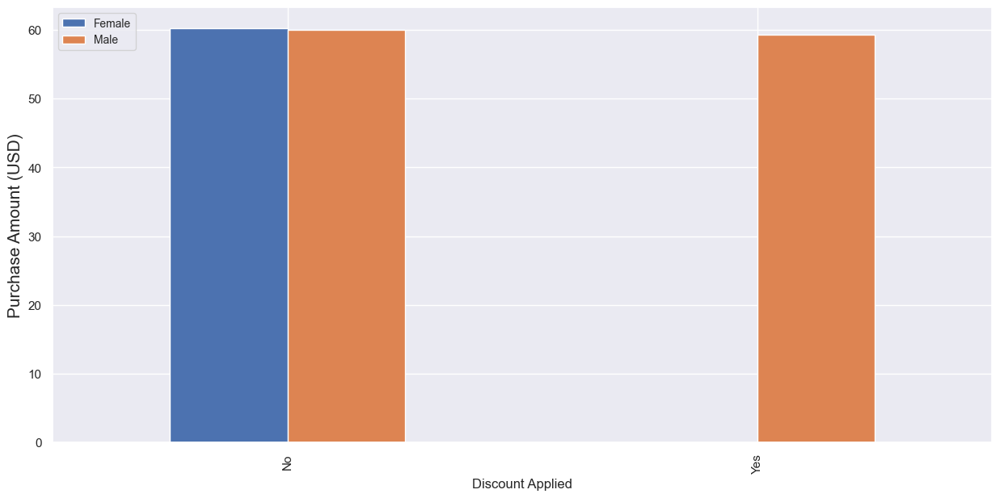

In [81]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [82]:
df_c = df[['Discount Applied', 'Gender', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Discount Applied', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Discount Applied,,
No,3.741426,3.778564
Yes,NaN,3.739654


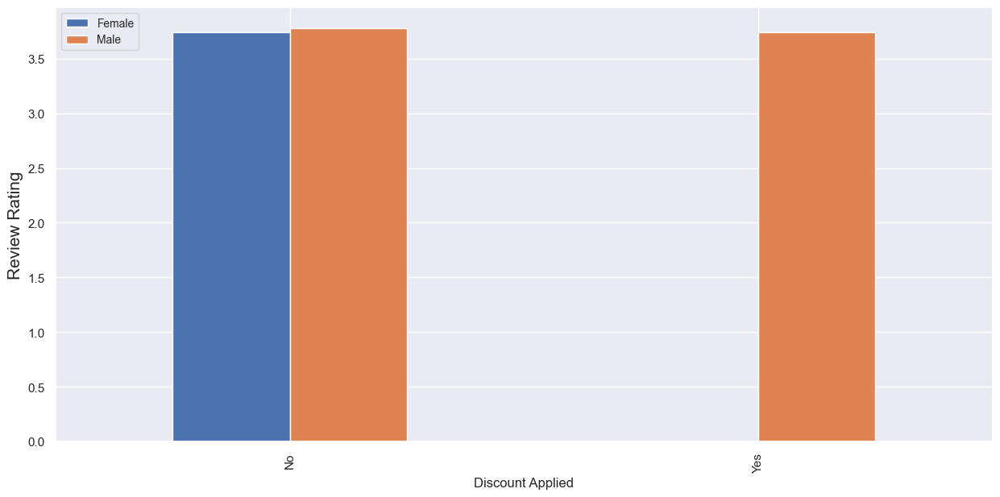

In [83]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [84]:
df_c = df[['Frequency of Purchases', 'Gender', 'Age']]
b = pd.pivot_table(df_c, index = 'Frequency of Purchases', columns = 'Gender', aggfunc = 'count')
b

Age     
Gender                 Female Male
Frequency of Purchases            
Annually                  185  387
Bi-Weekly                 188  359
Every 3 Months            186  398
Fortnightly               163  379
Monthly                   185  368
Quarterly                 169  394
Weekly                    172  367

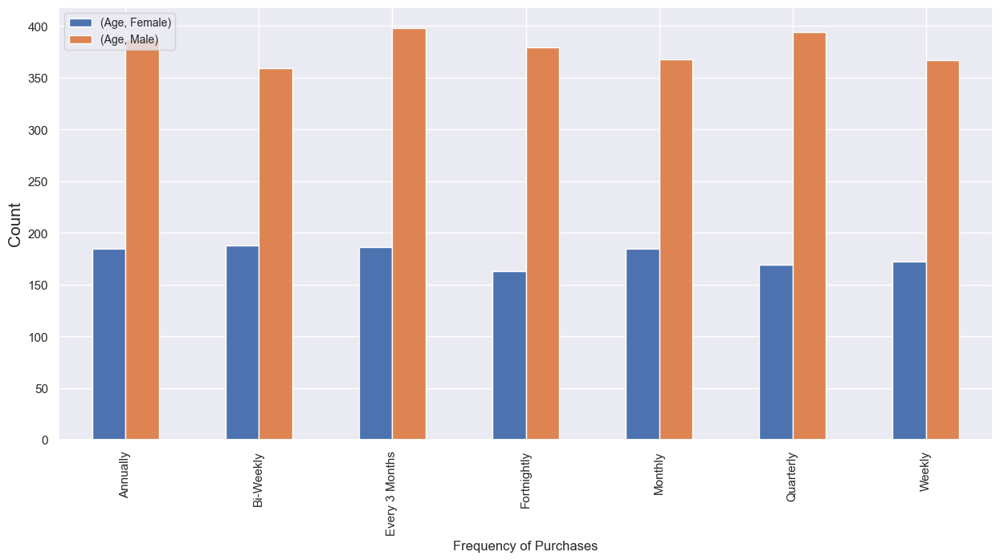

In [85]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [86]:
df_c = df[['Frequency of Purchases', 'Gender', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Frequency of Purchases', columns = 'Gender', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Gender,Female,Male
Frequency of Purchases,,
Annually,60.194595,60.162791
Bi-Weekly,59.914894,61.103064
Every 3 Months,62.161290,59.110553
Fortnightly,59.122699,59.023747
Monthly,59.935135,59.027174
Quarterly,61.940828,59.144670
Weekly,58.348837,59.264305


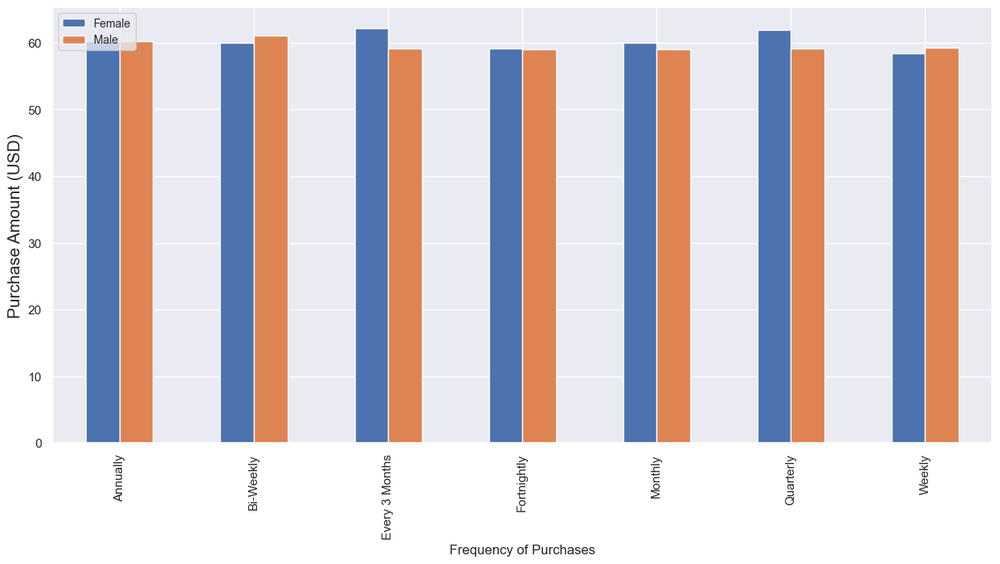

In [87]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [88]:
df_c = df[['Frequency of Purchases', 'Gender', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Frequency of Purchases', columns = 'Gender', values = 'Review Rating', aggfunc = 'mean')
b

Gender,Female,Male
Frequency of Purchases,,
Annually,3.780000,3.744444
Bi-Weekly,3.735638,3.691922
Every 3 Months,3.741935,3.779146
Fortnightly,3.730675,3.765699
Monthly,3.723784,3.802717
Quarterly,3.746154,3.719543
Weekly,3.730233,3.773297


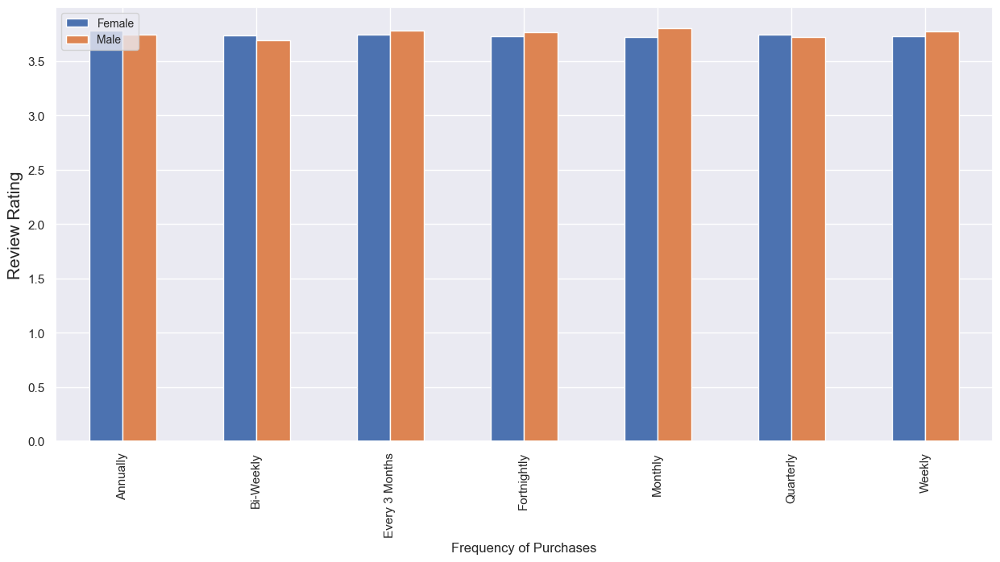

In [89]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [90]:
df_c = df[['Item Purchased', 'Category', 'Age']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Category', aggfunc = 'count')
b

Age                            
Category       Accessories Clothing Footwear Outerwear
Item Purchased                                        
Backpack             143.0      NaN      NaN       NaN
Belt                 161.0      NaN      NaN       NaN
Blouse                 NaN    171.0      NaN       NaN
Boots                  NaN      NaN    144.0       NaN
Coat                   NaN      NaN      NaN     161.0
Dress                  NaN    166.0      NaN       NaN
Gloves               140.0      NaN      NaN       NaN
Handbag              153.0      NaN      NaN       NaN
Hat                  154.0      NaN      NaN       NaN
Hoodie                 NaN    151.0      NaN       NaN
Jacket                 NaN      NaN      NaN     163.0
Jeans                  NaN    124.0      NaN       NaN
Jewelry              171.0      NaN      NaN       NaN
Pants                  NaN    171.0      NaN       NaN
Sandals                NaN      NaN    160.0       NaN
Scarf                157.0      NaN      NaN       NaN
Shirt                  NaN    169.0      NaN       NaN
Shoes                  NaN      NaN    150.0       NaN
Shorts                 NaN    157.0      NaN       NaN
Skirt                  NaN    158.0      NaN       NaN
Sneakers               NaN      NaN    145.0       NaN
Socks                  NaN    159.0      NaN       NaN
Sunglasses           161.0      NaN      NaN       NaN
Sweater                NaN    164.0      NaN       NaN
T-shirt                NaN    147.0      NaN       NaN

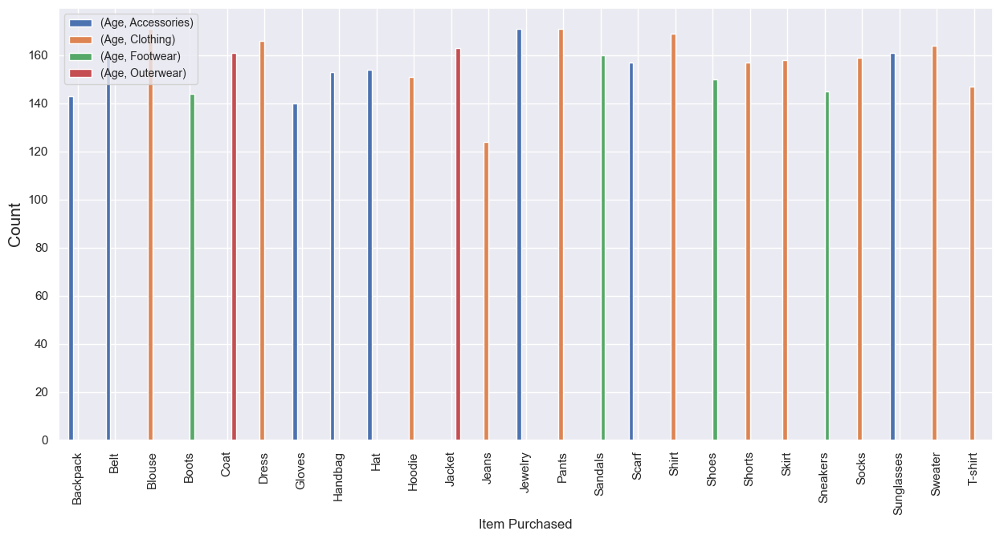

In [91]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [92]:
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Category', values = 'Age', aggfunc = 'mean')
b

Category,Accessories,Clothing,Footwear,Outerwear
Item Purchased,,,,
Backpack,42.895105,NaN,NaN,NaN
Belt,42.440994,NaN,NaN,NaN
Blouse,NaN,44.286550,NaN,NaN
Boots,NaN,NaN,44.847222,NaN
Coat,NaN,NaN,NaN,43.217391
Dress,NaN,44.602410,NaN,NaN
Gloves,43.071429,NaN,NaN,NaN
Handbag,46.052288,NaN,NaN,NaN
Hat,43.551948,NaN,NaN,NaN


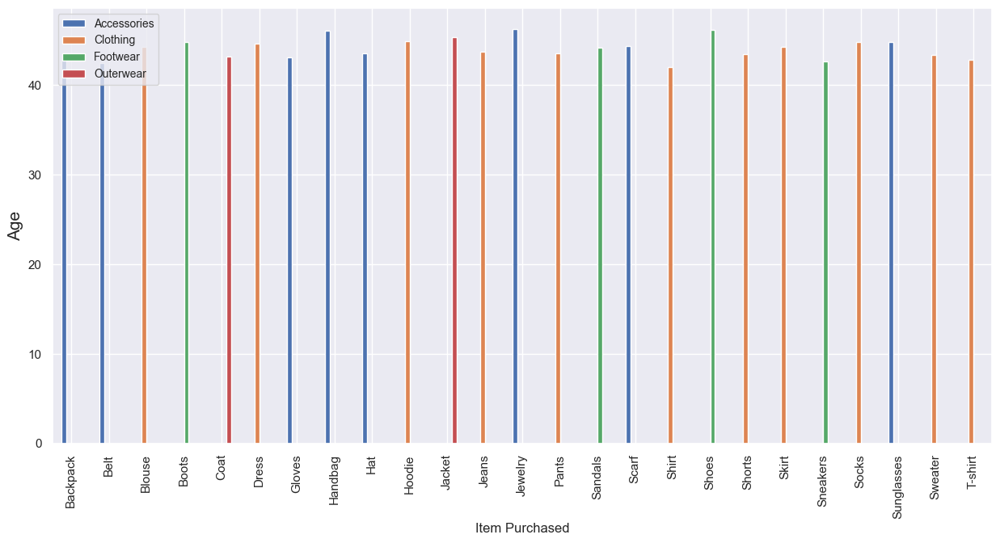

In [93]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Age', fontsize = 15)
plt.show()

In [94]:
df_c = df[['Item Purchased', 'Category', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Category', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Category,Accessories,Clothing,Footwear,Outerwear
Item Purchased,,,,
Backpack,60.391608,NaN,NaN,NaN
Belt,59.844720,NaN,NaN,NaN
Blouse,NaN,60.877193,NaN,NaN
Boots,NaN,NaN,62.625000,NaN
Coat,NaN,NaN,NaN,57.608696
Dress,NaN,62.168675,NaN,NaN
Gloves,60.550000,NaN,NaN,NaN
Handbag,57.888889,NaN,NaN,NaN
Hat,60.876623,NaN,NaN,NaN


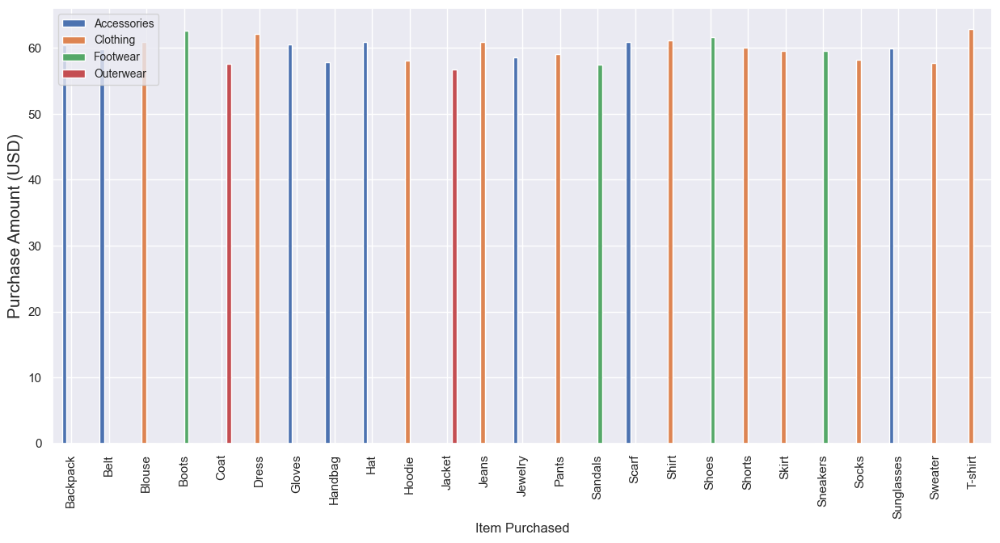

In [95]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [96]:
df_c = df[['Item Purchased', 'Category', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Category', values = 'Review Rating', aggfunc = 'mean')
b

Category,Accessories,Clothing,Footwear,Outerwear
Item Purchased,,,,
Backpack,3.752448,NaN,NaN,NaN
Belt,3.761491,NaN,NaN,NaN
Blouse,NaN,3.683626,NaN,NaN
Boots,NaN,NaN,3.812500,NaN
Coat,NaN,NaN,NaN,3.730435
Dress,NaN,3.754819,NaN,NaN
Gloves,3.864286,NaN,NaN,NaN
Handbag,3.775163,NaN,NaN,NaN
Hat,3.806494,NaN,NaN,NaN


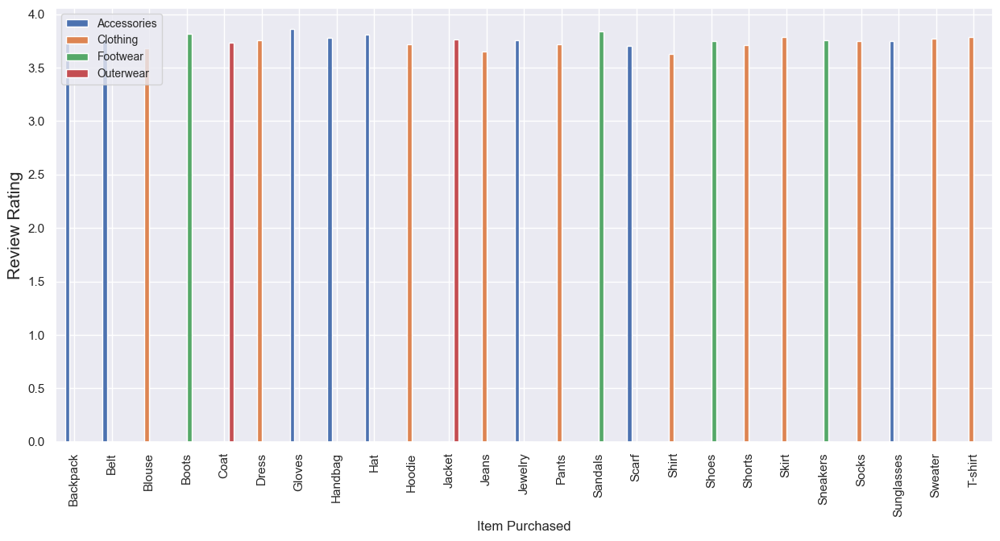

In [97]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [98]:
pd.set_option('display.max_columns', None)

In [99]:
df_c = df[['Item Purchased', 'Location', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Location', aggfunc = 'count')
b

Purchase Amount (USD)                                     \
Location                     Alabama Alaska Arizona Arkansas California   
Item Purchased                                                            
Backpack                         1.0    5.0     5.0      3.0        5.0   
Belt                             2.0    4.0     2.0      4.0        3.0   
Blouse                           4.0    4.0     3.0      3.0        2.0   
Boots                            3.0    1.0     NaN      1.0        4.0   
Coat                             6.0    2.0     3.0      4.0        3.0   
Dress                            5.0    4.0     4.0      5.0        7.0   
Gloves                           2.0    3.0     1.0      6.0        2.0   
Handbag                          3.0    2.0     3.0      2.0        4.0   
Hat                              3.0    3.0     1.0      2.0        3.0   
Hoodie                           3.0    2.0     3.0      4.0        3.0   
Jacket                           2.0    2.0     4.0      2.0        3.0   
Jeans                            4.0    2.0     2.0      3.0        7.0   
Jewelry                          8.0    3.0     3.0      5.0        5.0   
Pants                            5.0    NaN     2.0      4.0        5.0   
Sandals                          4.0    3.0     3.0      4.0        5.0   
Scarf                            3.0    3.0     2.0      2.0        4.0   
Shirt                            5.0    4.0     2.0      5.0        5.0   
Shoes                            6.0    2.0     1.0      4.0        NaN   
Shorts                           3.0    3.0     2.0      3.0        6.0   
Skirt                            6.0    3.0     4.0      2.0        4.0   
Sneakers                         2.0    3.0     2.0      1.0        2.0   
Socks                            2.0    4.0     3.0      2.0        1.0   
Sunglasses                       3.0    3.0     3.0      2.0        5.0   
Sweater                          2.0    3.0     5.0      4.0        4.0   
T-shirt                          2.0    4.0     2.0      2.0        3.0   

                                                                           \
Location       Colorado Connecticut Delaware Florida Georgia Hawaii Idaho   
Item Purchased                                                              
Backpack            5.0         2.0      3.0     1.0     4.0    1.0   4.0   
Belt                2.0         3.0      4.0     1.0     1.0    3.0   8.0   
Blouse              2.0         5.0      5.0     1.0     7.0    5.0   5.0   
Boots               NaN         4.0      2.0     2.0     1.0    2.0   3.0   
Coat                1.0         6.0      2.0     6.0     1.0    3.0   8.0   
Dress               4.0         4.0      5.0     2.0     8.0    1.0   2.0   
Gloves              4.0         2.0      5.0     6.0     1.0    1.0   4.0   
Handbag             4.0         6.0      2.0     2.0     1.0    6.0   2.0   
Hat                 3.0         1.0      5.0     6.0     2.0    4.0   3.0   
Hoodie              6.0         2.0      3.0     4.0     2.0    4.0   5.0   
Jacket              6.0         4.0      1.0     3.0     NaN    5.0   2.0   
Jeans               NaN         1.0      3.0     2.0     1.0    2.0   2.0   
Jewelry             2.0         5.0      3.0     2.0     6.0    2.0   3.0   
Pants               5.0         4.0      7.0     2.0     5.0    3.0   4.0   
Sandals             2.0         4.0      5.0     1.0     3.0    1.0   2.0   
Scarf               2.0         4.0      4.0     2.0     5.0    NaN   2.0   
Shirt               4.0         3.0      3.0     3.0     3.0    3.0   4.0   
Shoes               4.0         4.0      5.0     1.0     5.0    3.0   3.0   
Shorts              1.0         4.0      2.0     2.0     2.0    2.0   5.0   
Skirt               5.0         4.0      2.0     6.0     2.0    3.0   4.0   
Sneakers            6.0         NaN      2.0     4.0     5.0    3.0   4.0   
Socks               NaN         2.0      5.0     2.0     7.0    1.

In [100]:
pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Location', values = 'Purchase Amount (USD)', aggfunc = 'mean')

Location,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,Missouri,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
Item Purchased,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Backpack,74.000000,74.600000,48.600000,90.000000,57.400000,57.000000,60.000000,33.000000,59.000000,44.750000,96.000000,53.250000,93.000000,44.500000,51.000000,20.000000,53.500000,54.000000,NaN,42.000000,57.500000,35.500000,45.000000,85.000000,94.000000,45.200000,59.000000,64.900000,68.250000,45.000000,62.666667,72.000000,52.500000,49.000000,40.000000,55.000000,73.000000,94.000000,80.500000,70.500000,59.600000,79.000000,73.000000,NaN,59.500000,71.400000,65.333333,59.500000,35.000000,76.250000
Belt,26.500000,76.750000,84.500000,55.000000,61.666667,68.500000,47.666667,41.500000,94.000000,62.000000,44.000000,61.000000,66.800000,63.400000,49.666667,74.500000,42.666667,52.000000,34.000000,66.000000,64.000000,64.750000,54.000000,52.250000,36.333333,80.250000,70.500000,73.428571,69.000000,64.142857,41.400000,75.666667,65.000000,66.200000,45.000000,50.000000,39.000000,78.500000,40.666667,75.333333,78.000000,77.666667,59.500000,42.000000,50.000000,82.000000,60.000000,82.000000,59.750000,46.500000
Blouse,52.000000,67.500000,61.000000,66.000000,39.500000,55.000000,67.400000,42.200000,31.000000,64.857143,50.600000,65.000000,55.000000,33.333333,59.500000,48.833333,77.333333,67.500000,73.250000,52.500000,52.000000,57.000000,55.500000,54.833333,22.000000,61.500000,45.000000,64.333333,64.142857,37.333333,74.000000,59.800000,82.000000,68.000000,56.333333,51.000000,58.800000,73.666667,79.000000,55.000000,60.333333,26.000000,85.333333,56.666667,76.500000,56.000000,75.333333,71.250000,79.285714,73.750000
Boots,73.666667,56.000000,NaN,50.000000,62.500000,NaN,64.250000,44.500000,51.500000,85.000000,74.000000,60.333333,60.250000,62.333333,49.333333,57.400000,69.000000,55.000000,55.600000,57.000000,48.000000,97.000000,38.000000,73.000000,72.666667,52.750000,62.200000,48.500000,62.000000,82.000000,48.000000,75.000000,48.000000,44.000000,80.400000,59.750000,69.333333,81.000000,66.000000,74.400000,54.666667,69.750000,31.000000,66.250000,67.000000,48.750000,82.000000,72.750000,86.000000,68.000000
Coat,54.500000,45.500000,65.333333,54.250000,55.000000,46.000000,44.500000,57.500000,51.166667,93.000000,69.666667,65.250000,44.000000,48.666667,40.666667,62.000000,58.833333,44.000000,59.000000,74.000000,55.000000,39.000000,55.000000,70.250000,40.000000,65.375000,68.000000,25.000000,52.200000,33.000000,64.500000,78.500000,90.000000,61.166667,27.500000,59.500000,40.666667,60.000000,90.000000,43.333333,26.250000,67.000000,72.333333,59.000000,60.000000,27.000000,73.000000,69.375000,NaN,62.200000
Dress,55.200000,74.500000,71.000000,62.800000,58.428571,39.750000,65.000000,46.000000,48.500000,69.750000,42.000000,47.500000,61.333333,NaN,92.500000,69.000000,58.000000,61.333333,81.000000,59.500000,66.833333,89.000000,51.000000,47.600000,44.000000,84.666667,50.333333,60.666667,49.666667,NaN,NaN,53.750000,67.500000,74.333333,66.000000,99.000000,81.666667,71.400000,41.500000,57.000000,81.000000,52.250000,45.400000,84.000000,67.500000,44.000000,65.000000,79.000000,43.000000,64.500000
Gloves,85.000000,66.333333,87.000000,64.333333,53.000000,64.500000,63.000000,72.200000,51.666667,62.000000,61.000000,51.750000,72.500000,62.333333,58.333333,50.000000,58.666667,94.000000,61.500000,53.500000,84.000000,NaN,53.000000,NaN,44.000000,61.500000,63.000000,57.500000,34.666667,83.666667,NaN,49.666667,58.666667,95.000000,46.000000,NaN,28.000000,76.000000,83.000000,41.000000,64.000000,70.600000,39.333333,41.000000,24.000000,63.250000,61.750000,66.250000,4

In [101]:
df_c = df[['Item Purchased', 'Color', 'Purchase Amount (USD)']]
pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Color', aggfunc = 'count')

Purchase Amount (USD)                                           \
Color                          Beige Black Blue Brown Charcoal Cyan Gold Gray   
Item Purchased                                                                  
Backpack                           4    11    7     4        3    7    7    9   
Belt                               5     3   12     4       10    7    6    7   
Blouse                             9     4    5     8        9    5    4    8   
Boots                              3     3    6     7        3    7    3    6   
Coat                               8     8    8     6        5    8    5    8   
Dress                              6     8    5     4       12   11    9    6   
Gloves                             5     4    6     2        7   10    6    5   
Handbag                            8     6    7     7       12    7    6   10   
Hat                                8     4    6    10        7    4    2    4   
Hoodie                             5     5    3     8        8    6    8    4   
Jacket                             6     2   11     6        5    8    6    7   
Jeans                              4     2    5     5        5    2    3    3   
Jewelry                            4     7    5     8        4    5    4   14   
Pants                              4     9    4     2       12   12    6    4   
Sandals                           11     7   11     6        4    7    3    7   
Scarf                              4     6   10     4        6    1    7    4   
Shirt                              6     9    5     6        4    6    7    6   
Shoes                              3     6    6     7        4    4   11    5   
Shorts                             6     9    5     8        4   10    7    7   
Skirt                              6    15    3     5        4    6    5    7   
Sneakers                           7     9    2     4        4    9    7    5   
Socks                              9    10    4     5        5    3    5    3   
Sunglasses                         6    10    6     5        6    6    3    6   
Sweater                            8     5    5     6        5   12    5    7   
T-shirt                            2     5    5     4        5    3    3    7   

                                                                             \
Color          Green Indigo Lavender Magenta Maroon Olive Orange Peach Pink   
Item Purchased                                                                
Backpack           8      5        5       5      4    11      6     6    4   
Belt               9      7        8       5     10    10      5     6    6   
Blouse             9      5        9       9      6     3      4     7    8   
Boots              6      7        6       7      6     8      5     3    7   
Coat               8      4        8       6      1    10      2     5    5   
Dress              9      5        6       3      6     8      8     6    3   
Gloves             7      6        1       9      3     2      5     8    4   
Handbag            6      3        6       6      3     5      6     4    4   
Hat                6      6        4       9      6     6      4    10    5   
Hoodie            11      5        2       6      5     7      6     4   13   
Jacket             6      7        8       7      7     9      6     3    8   
Jeans              5      5        5       7      5     4      6     3    6   
Jewelry            4     13        7       8      8     9      5    11    3   
Pants              6      9        5       4      6     2      9     6    6   
Sandals            5      3        9       2      4     5     10     4    5   
Scarf              9      6        6       9      2    11      8    10    7   
Shirt              7      5        6       6     10     5     10     7    5   
Shoes              8      3        6       4     12    10      3     5    7   
Shorts             7      3        4       5      7     7      5     6    6   
Skirt   

In [102]:
df_c = df[['Item Purchased', 'Season', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Season', aggfunc = 'count')
b

Purchase Amount (USD)                     
Season                          Fall Spring Summer Winter
Item Purchased                                           
Backpack                          34     39     45     25
Belt                              41     41     39     40
Blouse                            42     46     43     40
Boots                             35     40     38     31
Coat                              34     46     42     39
Dress                             36     43     47     40
Gloves                            37     42     29     32
Handbag                           48     36     35     34
Hat                               50     27     37     40
Hoodie                            36     36     31     48
Jacket                            54     35     33     41
Jeans                             32     32     31     29
Jewelry                           35     42     47     47
Pants                             38     32     50     51
Sandals                           44     44     40     32
Scarf                             40     41     43     33
Shirt                             39     42     38     50
Shoes                             26     40     46     38
Shorts                            35     47     40     35
Skirt                             46     46     28     38
Sneakers                          31     39     36     39
Socks                             42     40     42     35
Sunglasses                        39     33     37     52
Sweater                           42     52     28     42
T-shirt                           39     38     30     40

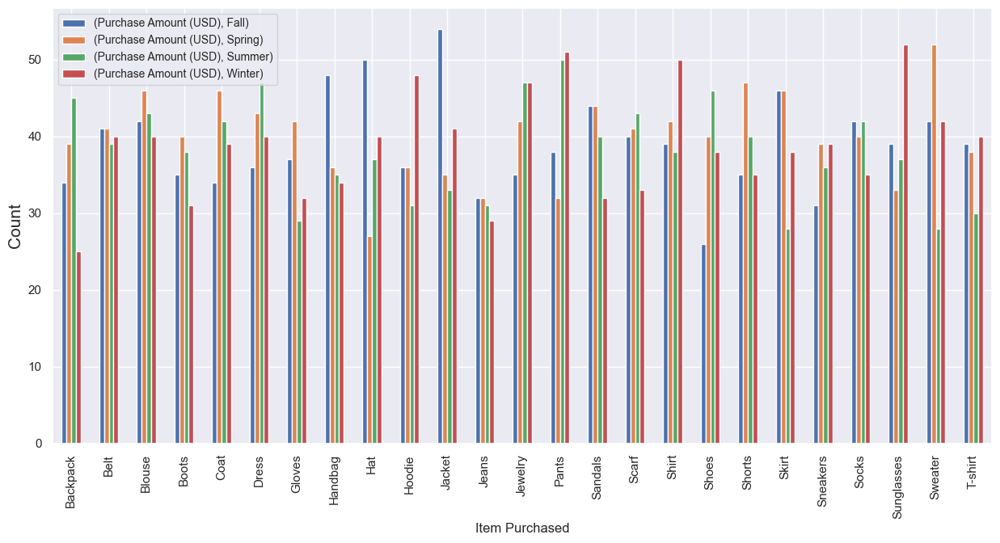

In [103]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [104]:
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Season', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Season,Fall,Spring,Summer,Winter
Item Purchased,,,,
Backpack,59.058824,56.564103,61.777778,65.680000
Belt,62.268293,57.512195,57.256410,62.275000
Blouse,64.047619,60.239130,60.837209,58.325000
Boots,61.685714,60.700000,62.500000,66.322581
Coat,63.323529,52.956522,60.023810,55.512821
Dress,67.944444,60.325581,58.404255,63.375000
Gloves,61.243243,58.880952,59.758621,62.656250
Handbag,57.958333,55.777778,56.857143,61.088235
Hat,64.480000,60.185185,60.351351,57.325000


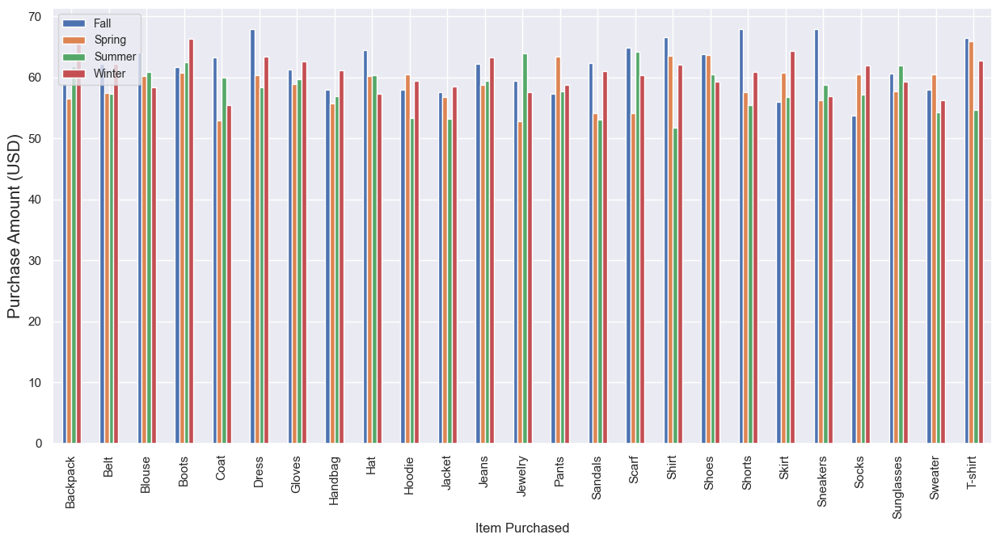

In [105]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchase Amount (USD)', fontsize = 15)
plt.show()

In [106]:
df_c = df[['Item Purchased', 'Discount Applied', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Item Purchased', columns = 'Discount Applied', aggfunc = 'count')
b

Purchase Amount (USD)    
Discount Applied                    No Yes
Item Purchased                            
Backpack                            79  64
Belt                                89  72
Blouse                             113  58
Boots                               77  67
Coat                                82  79
Dress                               91  75
Gloves                              80  60
Handbag                             92  61
Hat                                 77  77
Hoodie                              83  68
Jacket                              98  65
Jeans                               67  57
Jewelry                             95  76
Pants                               90  81
Sandals                            101  59
Scarf                               90  67
Shirt                               98  71
Shoes                               89  61
Shorts                              89  68
Skirt                               97  61
Sneakers                            73  72
Socks                              107  52
Sunglasses                          95  66
Sweater                             85  79
T-shirt                             86  61

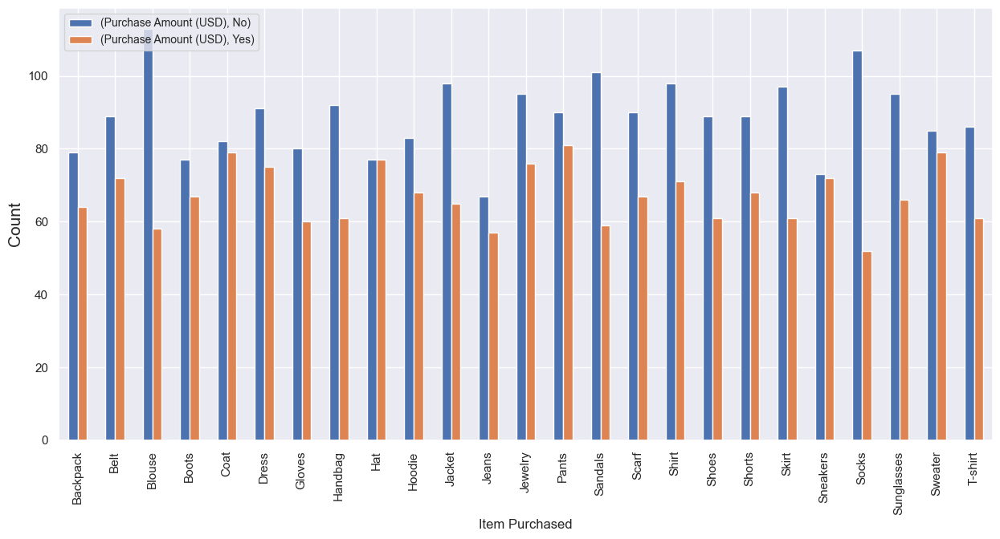

In [107]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [108]:
df_c = df[['Location', 'Category', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Location', columns = 'Category', aggfunc = 'count')
b

Purchase Amount (USD)                            
Category                 Accessories Clothing Footwear Outerwear
Location                                                        
Alabama                           25       41       15         8
Alaska                            26       33        9         4
Arizona                           20       32        6         7
Arkansas                          26       37       10         6
California                        31       47       11         6
Colorado                          24       32       12         7
Connecticut                       24       32       12        10
Delaware                          28       41       14         3
Florida                           21       30        8         9
Georgia                           23       41       14         1
Hawaii                            19       29        9         8
Idaho                             29       42       12        10
Illinois                          27       46       11         8
Indiana                           25       37       10         7
Iowa                              23       23       14         9
Kansas                            17       26       14         6
Kentucky                          34       30        5        10
Louisiana                         27       44       11         2
Maine                             19       34       17         7
Maryland                          27       34       17         8
Massachusetts                     18       34       14         6
Michigan                          19       31       15         8
Minnesota                         25       42       17         4
Mississippi                       32       33        9         6
Missouri                          27       37       12         5
Montana                           28       45       12        11
Nebraska                          37       30       16         4
Nevada                            32       38       12         5
New Hampshire                     29       28        7         7
New Jersey                        26       25       10         6
New Mexico                        29       29       14         9
New York                          29       36       13         9
North Carolina                    25       35       13         5
North Dakota                      24       34       11        14
Ohio                              22       34       18         3
Oklahoma                          18       38        9        10
Oregon                            18       37       13         6
Pennsylvania                      24       35       11         4
Rhode Island                      17       35        9         2
South Carolina                    22       36       12         6
South Dakota                      25       28        9         8
Tennessee                         27       34       11         5
Texas                             27       29       15         6
Utah                              21       33       12         5
Vermont                           20       43       15         7
Virginia                          24       35       14         4
Washington                        23       35       10         5
West Virginia                     31       29       12         9
Wisconsin                         23       37       12         3
Wyoming                           23       31       11         6

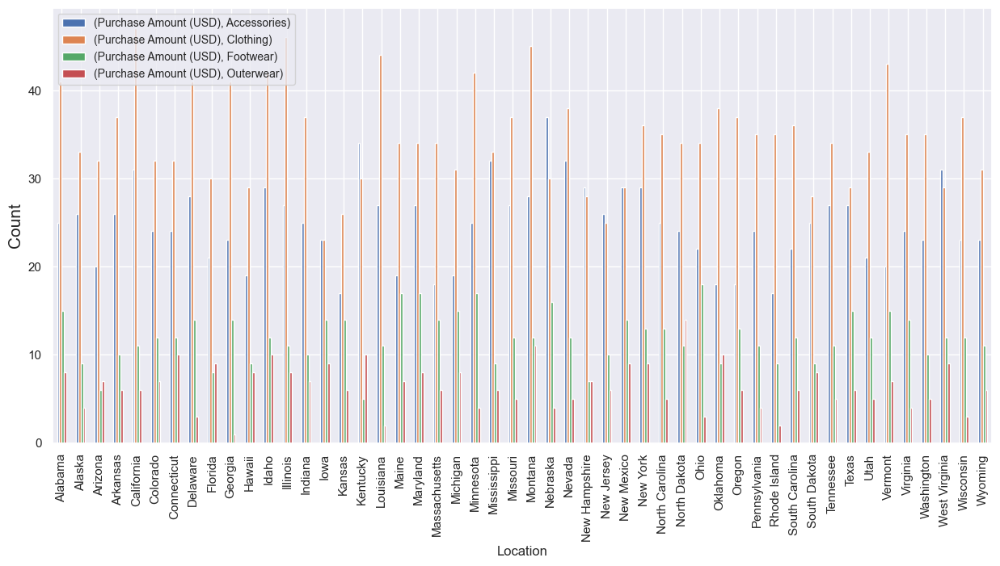

In [109]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [110]:
df_c = df[['Category', 'Color', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Color', columns = 'Category', aggfunc = 'count')
b

Purchase Amount (USD)                            
Category            Accessories Clothing Footwear Outerwear
Color                                                      
Beige                        44       65       24        14
Black                        51       81       25        10
Blue                         59       49       25        19
Brown                        44       61       24        12
Charcoal                     55       73       15        10
Cyan                         47       76       27        16
Gold                         41       62       24        11
Gray                         59       62       23        15
Green                        53       78       24        14
Indigo                       52       59       25        11
Lavender                     49       60       22        16
Magenta                      58       59       22        13
Maroon                       41       83       26         8
Olive                        66       61       31        19
Orange                       44       78       24         8
Peach                        58       65       18         8
Pink                         39       73       28        13
Purple                       40       72       27        12
Red                          54       68       16        10
Silver                       51       80       28        14
Teal                         47       84       27        14
Turquoise                    50       65       17        13
Violet                       41       79       30        16
White                        41       69       17        15
Yellow                       56       75       30        13

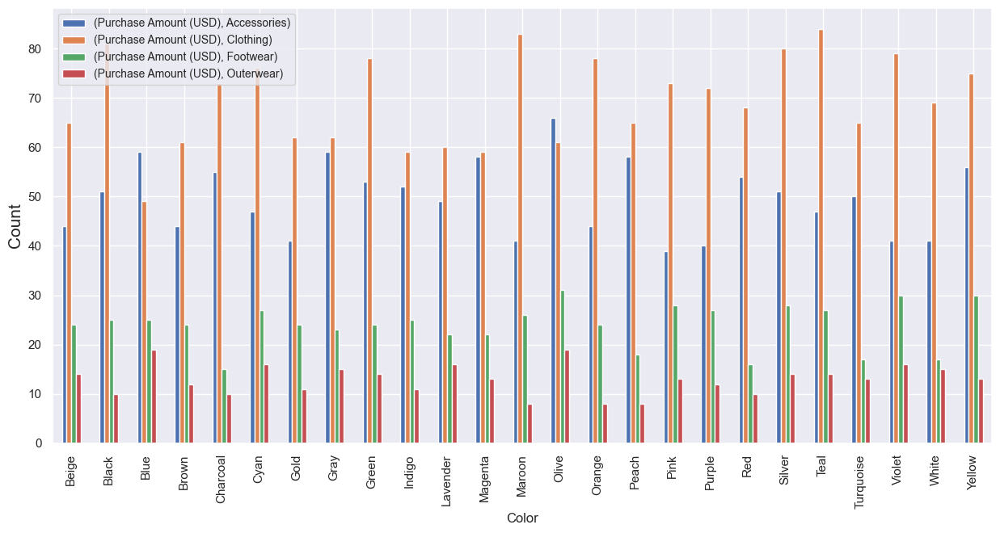

In [111]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [112]:
df_c = df[['Category', 'Color', 'Review Rating']]
b = pd.pivot_table(df_c, index = 'Color', columns = 'Category', values = 'Review Rating', aggfunc = 'mean')
b

Category,Accessories,Clothing,Footwear,Outerwear
Color,,,,
Beige,3.725000,3.595385,3.583333,3.357143
Black,3.927451,3.843210,3.640000,3.870000
Blue,3.879661,3.508163,3.552000,3.573684
Brown,3.865909,3.693443,3.633333,3.833333
Charcoal,3.745455,3.713699,3.973333,4.210000
Cyan,3.704255,3.578947,3.707407,3.487500
Gold,3.687805,3.637097,3.825000,3.454545
Gray,3.874576,3.733871,4.130435,4.126667
Green,3.607547,3.735897,3.641667,3.764286


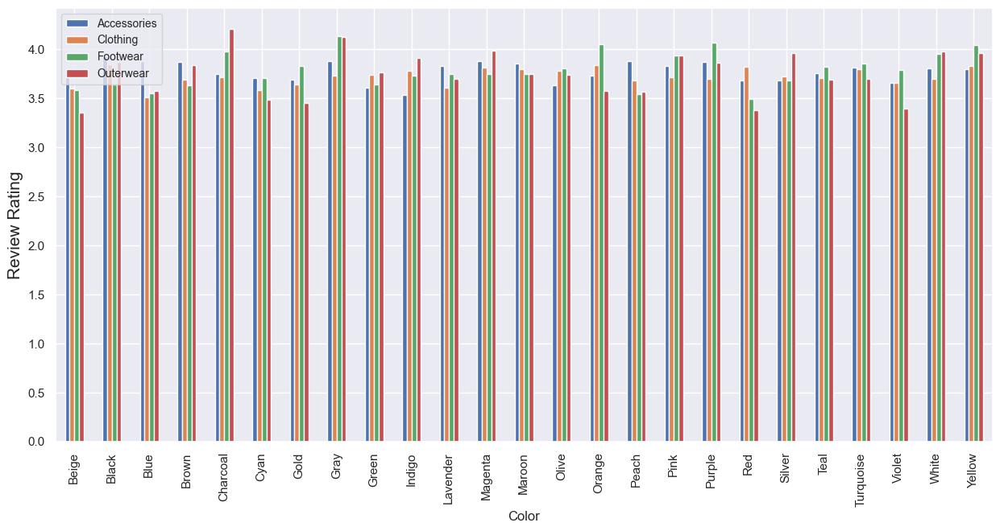

In [113]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Review Rating', fontsize = 15)
plt.show()

In [114]:
df_c = df[['Category', 'Frequency of Purchases', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Frequency of Purchases', columns = 'Category', aggfunc = 'count')
b

Purchase Amount (USD)                            
Category                         Accessories Clothing Footwear Outerwear
Frequency of Purchases                                                  
Annually                                 184      258       87        43
Bi-Weekly                                180      247       80        40
Every 3 Months                           180      265       92        47
Fortnightly                              170      223       96        53
Monthly                                  171      263       75        44
Quarterly                                189      239       83        52
Weekly                                   166      242       86        45

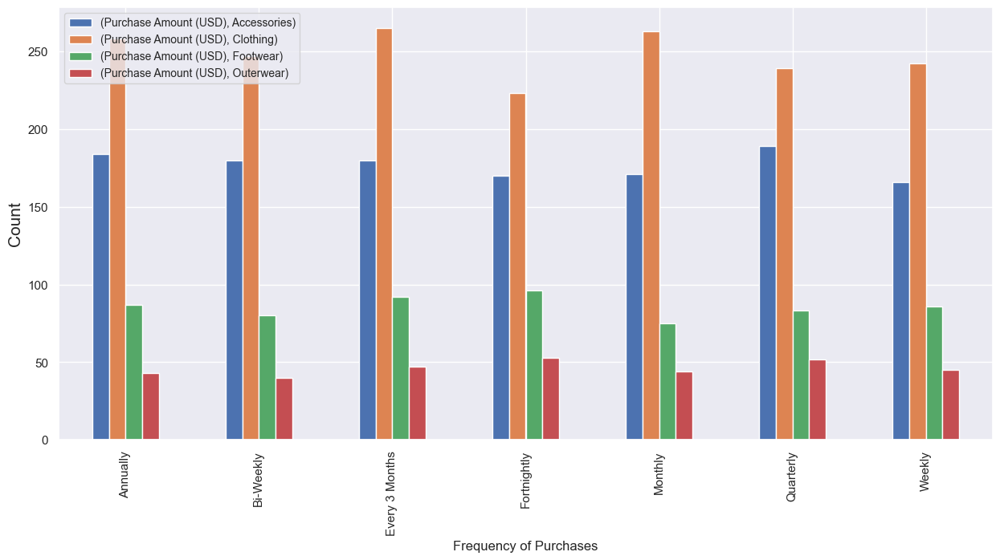

In [115]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [116]:
b = pd.pivot_table(df_c, index = 'Frequency of Purchases', columns = 'Category', values = 'Purchase Amount (USD)', aggfunc = 'mean')
b

Category,Accessories,Clothing,Footwear,Outerwear
Frequency of Purchases,,,,
Annually,61.032609,60.639535,59.632184,54.790698
Bi-Weekly,60.738889,59.870445,60.900000,65.175000
Every 3 Months,59.333333,60.822642,60.043478,58.851064
Fortnightly,58.100000,59.399103,59.718750,59.452830
Monthly,58.052632,60.916350,59.280000,54.909091
Quarterly,59.417989,60.983264,60.939759,55.923077
Weekly,62.186747,57.318182,61.302326,51.555556


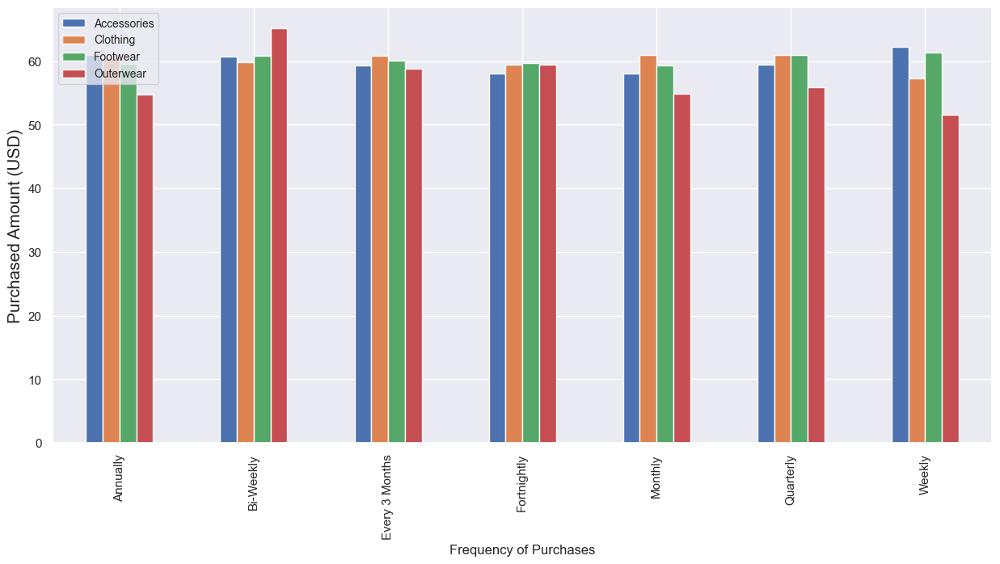

In [117]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Purchased Amount (USD)', fontsize = 15)
plt.show()

In [118]:
df_c = df[['Location', 'Color', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Location', columns = 'Color', aggfunc = 'count')
b

Purchase Amount (USD)                                       \
Color                          Beige Black Blue Brown Charcoal  Cyan Gold   
Location                                                                    
Alabama                          4.0   5.0  4.0   2.0      2.0   2.0  3.0   
Alaska                           3.0   4.0  3.0   3.0      2.0   3.0  4.0   
Arizona                          4.0   2.0  2.0   2.0      NaN   4.0  4.0   
Arkansas                         1.0   6.0  3.0   NaN      3.0   2.0  5.0   
California                       6.0   4.0  3.0   2.0      6.0   2.0  3.0   
Colorado                         4.0   5.0  3.0   1.0      6.0   2.0  1.0   
Connecticut                      4.0   3.0  1.0   2.0      2.0   4.0  4.0   
Delaware                         2.0   5.0  3.0   4.0      3.0   4.0  4.0   
Florida                          5.0   3.0  3.0   3.0      2.0   3.0  1.0   
Georgia                          NaN   2.0  1.0   3.0      6.0   4.0  3.0   
Hawaii                           1.0   5.0  2.0   2.0      2.0   3.0  3.0   
Idaho                            NaN  10.0  3.0   5.0      1.0   6.0  3.0   
Illinois                         2.0   5.0  3.0   6.0      3.0   4.0  3.0   
Indiana                          3.0   1.0  4.0   2.0      4.0   6.0  1.0   
Iowa                             3.0   5.0  2.0   2.0      2.0   5.0  1.0   
Kansas                           4.0   2.0  2.0   1.0      1.0   1.0  1.0   
Kentucky                         5.0   2.0  5.0   2.0      4.0   3.0  3.0   
Louisiana                        3.0   6.0  2.0   4.0      3.0   2.0  2.0   
Maine                            3.0   1.0  3.0   4.0      3.0   2.0  3.0   
Maryland                         4.0   3.0  1.0   2.0      5.0   3.0  4.0   
Massachusetts                    6.0   3.0  3.0   2.0      2.0   2.0  1.0   
Michigan                         NaN   4.0  2.0   2.0      3.0   2.0  2.0   
Minnesota                        5.0   3.0  5.0   4.0      3.0   NaN  3.0   
Mississippi                      3.0   2.0  5.0   1.0      3.0   3.0  NaN   
Missouri                         3.0   5.0  4.0   7.0      3.0   3.0  NaN   
Montana                          2.0   5.0  1.0   5.0      4.0   4.0  2.0   
Nebraska                         1.0   2.0  4.0   3.0      3.0   7.0  3.0   
Nevada                           2.0   4.0  2.0   4.0      2.0   4.0  5.0   
New Hampshire                    4.0   2.0  4.0   1.0      3.0   4.0  5.0   
New Jersey                       6.0   1.0  3.0   2.0      1.0   3.0  6.0   
New Mexico                       1.0   3.0  1.0   7.0      6.0   4.0  2.0   
New York                         2.0   5.0  1.0   2.0      6.0   3.0  4.0   
North Carolina                   3.0   3.0  6.0   1.0      6.0   2.0  1.0   
North Dakota                     5.0   1.0  5.0   4.0      4.0   3.0  3.0   
Ohio                             1.0   3.0  2.0   3.0      2.0   3.0  2.0   
Oklahoma                         1.0   3.0  1.0   4.0      6.0   4.0  2.0   
Oregon                           5.0   3.0  4.0   2.0      1.0   3.0  4.0   
Pennsylvania                     4.0   1.0  7.0   1.0      1.0   1.0  5.0   
Rhode Island                     2.0   2.0  3.0   4.0      3.0   2.0  2.0   
South Carolina                   3.0   4.0  NaN   4.0      2.0   5.0  3.0   
South Dakota                     3.0   NaN  2.0   1.0      4.0   4.0  3.0   
Tennessee                        3.0   4.0  5.0   3.0      3.0  10.0  2.0   
Texas                            4.0   4.0  2.0   5.0      3.0   5.0  NaN   
Utah                             6.0   2.0  5.0   5.0      2.0   2.0  2.0   
Vermont                          2.0   4.0  5.0   3.0      3.0   5.0  4.0   
Virginia                         NaN   NaN  4.0   4.0      4.0   4.0  4.0   
Washington                       4.0   5.0  3.0   2.0      1.0   2.0  4.0   
West Virginia                    3.0   5.0  2.0   1.0      5.0   3.0  2.0   
Wisconsin                        1.0   1.0  6.0   2.0      2.0   2.0  1.0   
Wyoming    

In [119]:
pd.pivot_table(df_c, index = 'Location', columns = 'Color', values = 'Purchase Amount (USD)', aggfunc = 'mean')

Color,Beige,Black,Blue,Brown,Charcoal,Cyan,Gold,Gray,Green,Indigo,Lavender,Magenta,Maroon,Olive,Orange,Peach,Pink,Purple,Red,Silver,Teal,Turquoise,Violet,White,Yellow
Location,,,,,,,,,,,,,,,,,,,,,,,,,
Alabama,67.250000,49.000000,43.250000,66.000000,56.000000,53.000000,60.000000,59.500000,69.250000,79.250000,74.000000,37.833333,54.666667,64.000000,64.333333,48.200000,46.333333,64.600000,65.666667,57.800000,47.666667,34.000000,72.000000,83.000000,70.600000
Alaska,57.666667,68.750000,91.333333,57.666667,78.500000,62.666667,51.500000,80.000000,60.666667,NaN,81.000000,88.333333,86.000000,54.833333,63.500000,55.000000,71.500000,93.000000,66.333333,55.000000,65.000000,39.000000,68.333333,64.500000,84.333333
Arizona,52.750000,61.000000,49.500000,82.500000,NaN,79.750000,80.250000,87.000000,74.000000,49.000000,79.000000,57.000000,77.000000,59.666667,63.000000,59.000000,59.333333,59.750000,NaN,59.250000,83.666667,60.000000,68.000000,60.500000,64.000000
Arkansas,91.000000,73.333333,66.666667,NaN,85.666667,96.500000,74.600000,97.000000,65.600000,65.333333,37.000000,NaN,56.200000,44.666667,65.666667,31.000000,60.000000,57.400000,54.250000,30.500000,81.200000,46.000000,65.666667,22.000000,52.666667
California,52.666667,36.750000,51.333333,53.000000,58.333333,87.000000,35.000000,55.000000,72.833333,65.000000,52.000000,61.000000,70.000000,83.500000,86.750000,48.750000,53.000000,87.000000,52.666667,62.000000,58.000000,53.000000,51.500000,43.000000,67.000000
Colorado,64.750000,48.600000,66.000000,28.000000,53.333333,41.500000,61.000000,46.000000,46.800000,50.666667,84.000000,54.000000,61.000000,71.000000,39.000000,58.000000,83.000000,67.500000,71.500000,64.166667,53.000000,52.142857,42.250000,63.333333,42.000000
Connecticut,41.750000,42.000000,61.000000,40.000000,33.500000,59.000000,63.000000,34.666667,NaN,43.666667,53.400000,66.333333,65.000000,47.000000,21.000000,62.400000,73.500000,53.500000,NaN,60.000000,57.000000,34.000000,58.000000,67.500000,54.285714
Delaware,28.000000,71.600000,38.666667,66.250000,41.666667,55.250000,55.750000,86.500000,63.000000,59.400000,78.333333,50.500000,51.500000,43.666667,64.857143,55.500000,33.000000,45.500000,55.250000,64.857143,45.500000,29.000000,30.666667,59.333333,75.000000
Florida,80.600000,30.000000,57.666667,49.333333,48.500000,57.000000,98.000000,56.333333,48.333333,43.666667,NaN,49.000000,72.000000,56.750000,56.500000,40.000000,55.750000,62.000000,51.000000,52.000000,49.750000,62.333333,45.000000,54.400000,68.000000


In [120]:
df_c = df[['Color', 'Season', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Color', columns = 'Season', aggfunc = 'count')
b

Purchase Amount (USD)                     
Season                     Fall Spring Summer Winter
Color                                               
Beige                        34     39     37     37
Black                        42     43     42     40
Blue                         32     39     46     35
Brown                        35     33     33     40
Charcoal                     32     42     36     43
Cyan                         43     42     42     39
Gold                         36     38     30     34
Gray                         44     48     40     27
Green                        37     38     44     50
Indigo                       37     37     32     41
Lavender                     38     32     39     38
Magenta                      50     37     35     30
Maroon                       40     39     35     44
Olive                        47     52     35     43
Orange                       45     39     37     33
Peach                        42     38     24     45
Pink                         35     44     29     45
Purple                       37     43     38     33
Red                          42     31     36     39
Silver                       39     37     59     38
Teal                         40     46     49     37
Turquoise                    27     41     36     41
Violet                       44     45     40     37
White                        27     36     43     36
Yellow                       50     40     38     46

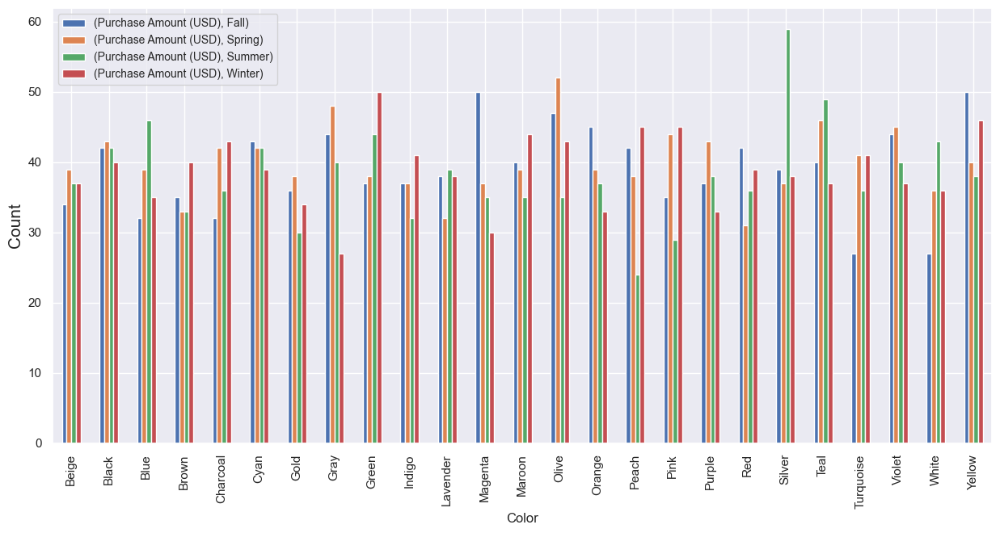

In [121]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [122]:
df_c = df[['Season', 'Frequency of Purchases', 'Purchase Amount (USD)']]
b = pd.pivot_table(df_c, index = 'Season', columns = 'Frequency of Purchases', aggfunc = 'count')
b

Purchase Amount (USD)                           \
Frequency of Purchases              Annually Bi-Weekly Every 3 Months   
Season                                                                  
Fall                                     157       120            147   
Spring                                   137       155            146   
Summer                                   143       132            152   
Winter                                   135       140            139   

                                                             
Frequency of Purchases Fortnightly Monthly Quarterly Weekly  
Season                                                       
Fall                           143     137       143    128  
Spring                         133     144       142    142  
Summer                         127     133       144    124  
Winter                         139     139       134    145

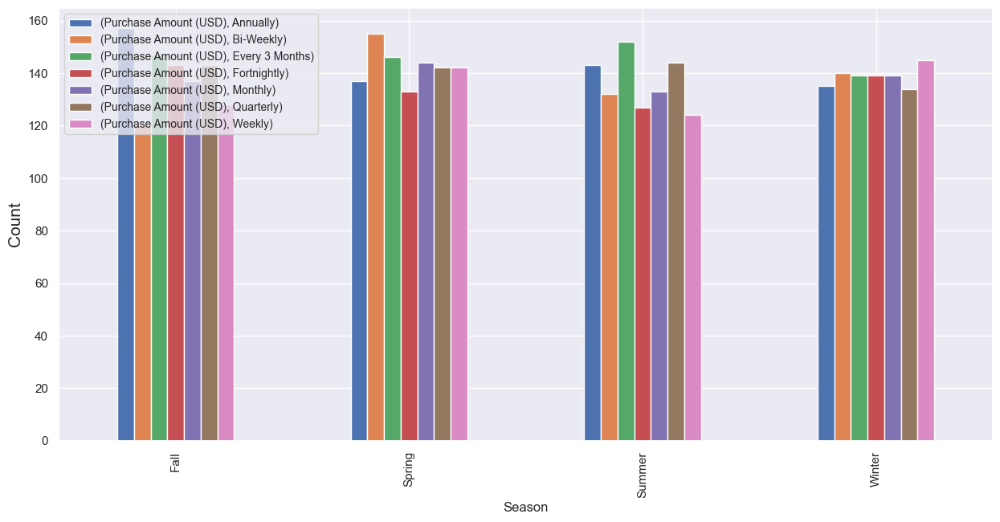

In [123]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [124]:
b = pd.pivot_table(df_c, index = 'Season', columns = 'Frequency of Purchases', aggfunc = 'count')
b

Purchase Amount (USD)                           \
Frequency of Purchases              Annually Bi-Weekly Every 3 Months   
Season                                                                  
Fall                                     157       120            147   
Spring                                   137       155            146   
Summer                                   143       132            152   
Winter                                   135       140            139   

                                                             
Frequency of Purchases Fortnightly Monthly Quarterly Weekly  
Season                                                       
Fall                           143     137       143    128  
Spring                         133     144       142    142  
Summer                         127     133       144    124  
Winter                         139     139       134    145

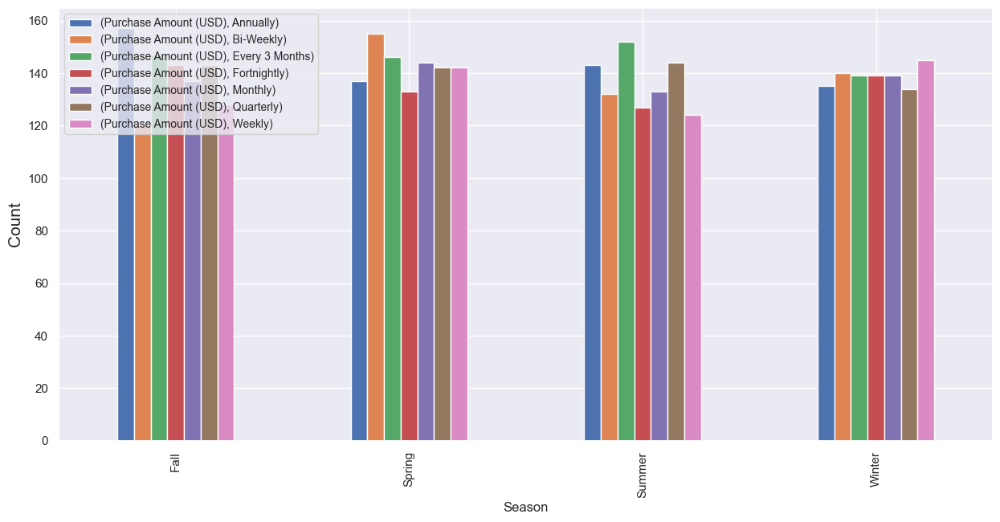

In [125]:
b.plot(kind = 'bar', figsize = (15, 7))
plt.legend(loc = 2, prop = {'size': 10})
plt.ylabel('Count', fontsize = 15)
plt.show()

In [126]:
df.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually


In [127]:
cat_columns, num_columns = [], []
for column in df.columns:
    if df[column].dtype == 'object':
        cat_columns.append(column)
    else:
        num_columns.append(column)

In [128]:
print('Categorical columns are:\n', cat_columns)

Categorical columns are:
 ['Gender', 'Item Purchased', 'Category', 'Location', 'Size', 'Color', 'Season', 'Subscription Status', 'Shipping Type', 'Discount Applied', 'Promo Code Used', 'Payment Method', 'Frequency of Purchases']


In [129]:
print('Numerical columns are:\n', num_columns)

Numerical columns are:
 ['Age', 'Purchase Amount (USD)', 'Review Rating', 'Previous Purchases']


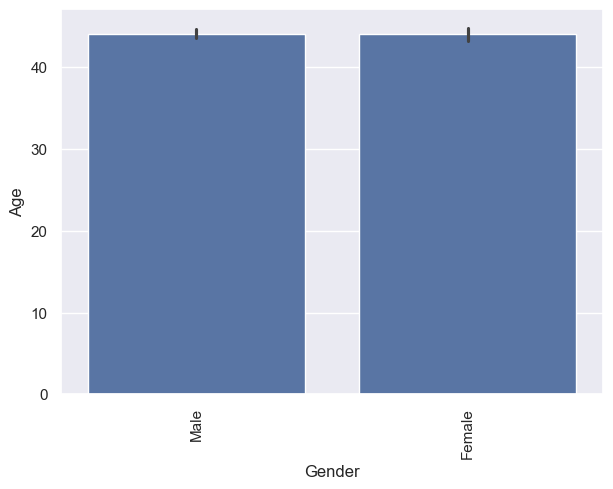

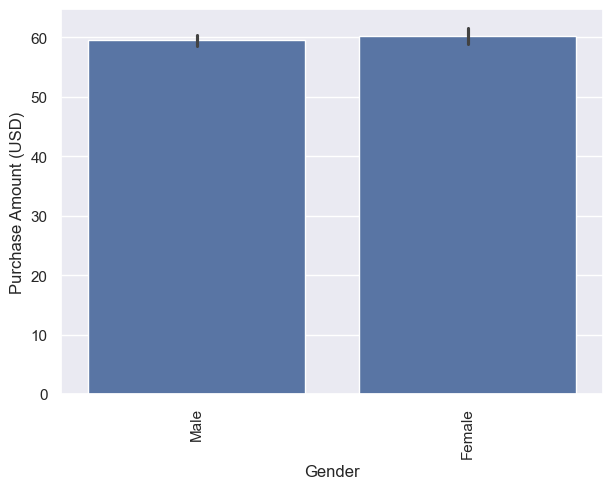

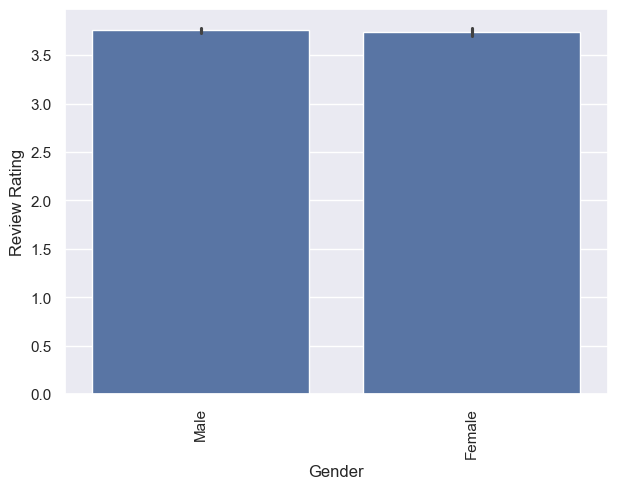

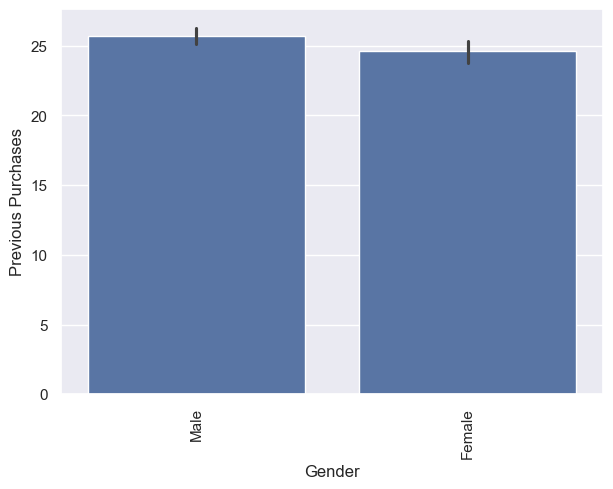

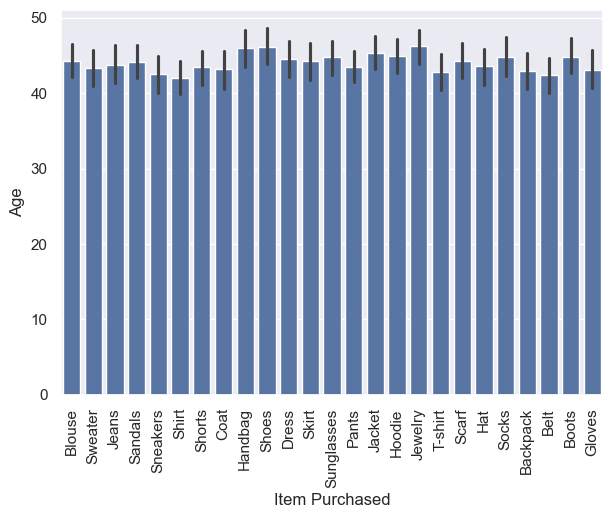

...

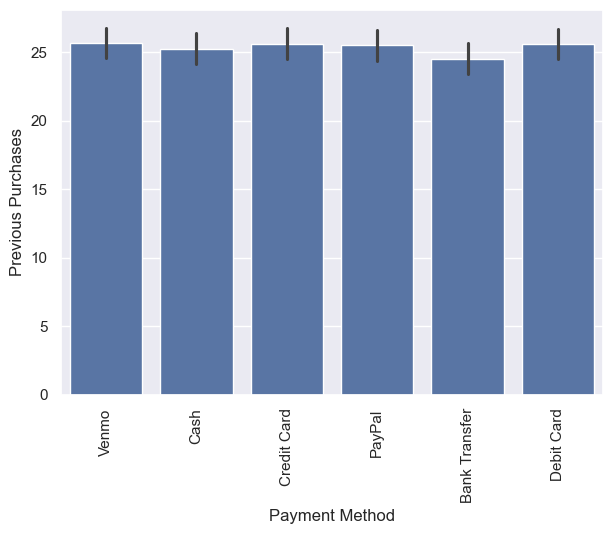

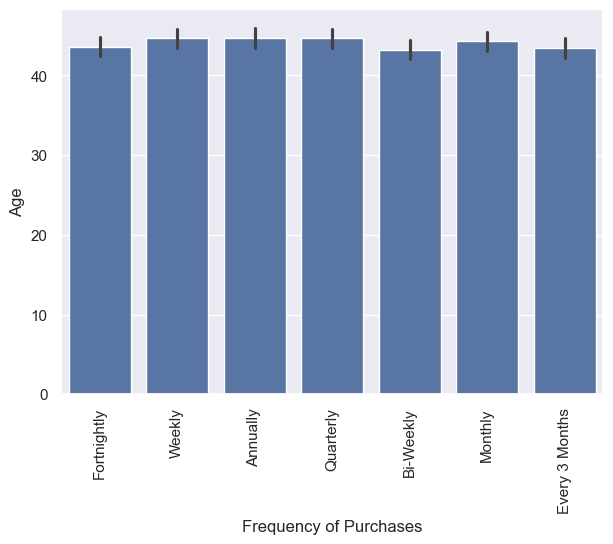

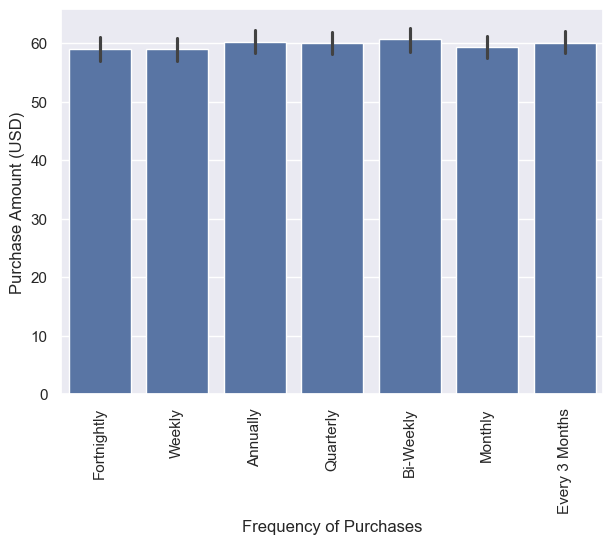

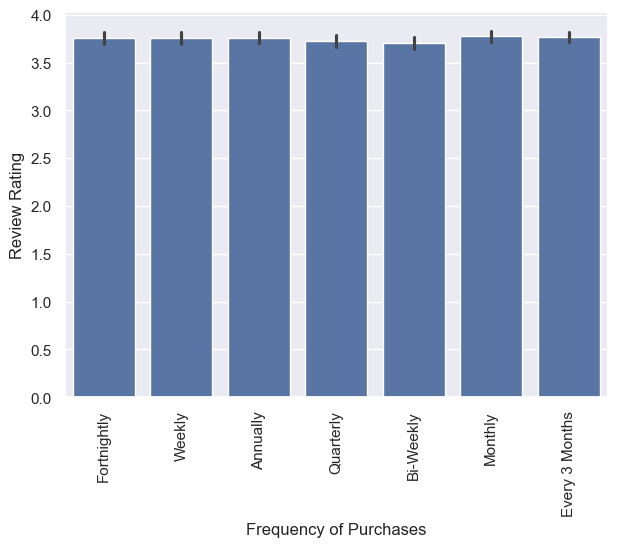

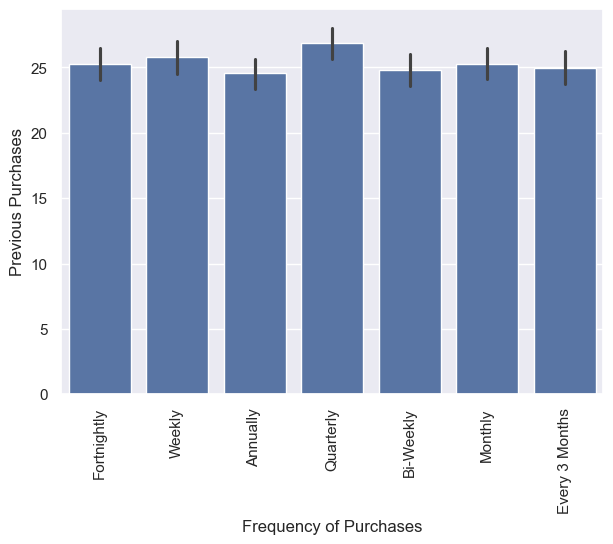

In [130]:
for i in cat_columns:
    for j in num_columns:
        plt.figure(figsize = (7, 5))
        sns.barplot(data = df, x = i, y = j)
        plt.xticks(rotation = 90)
        plt.show()

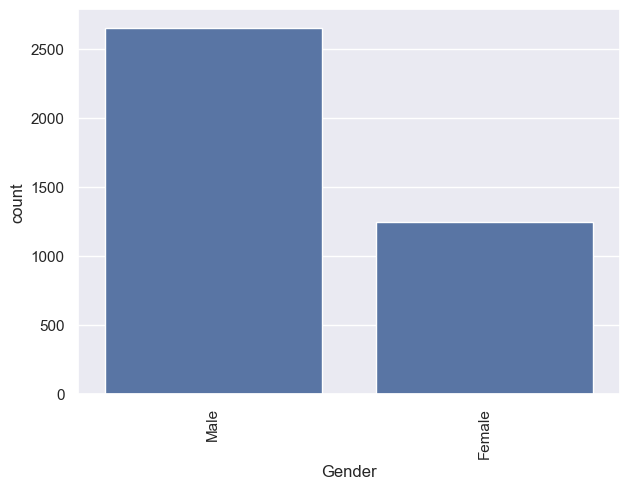

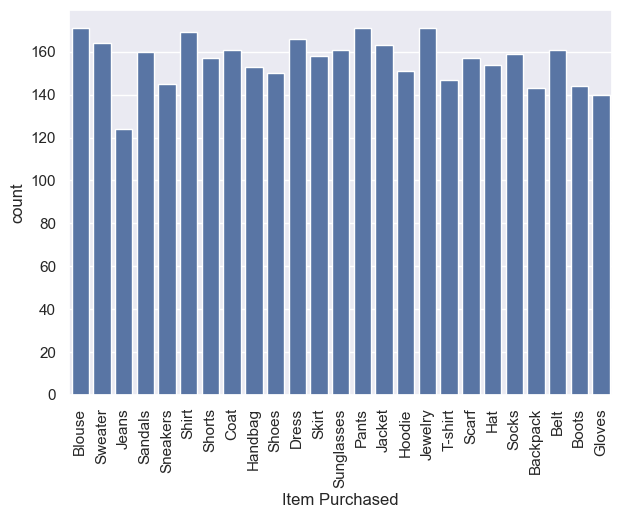

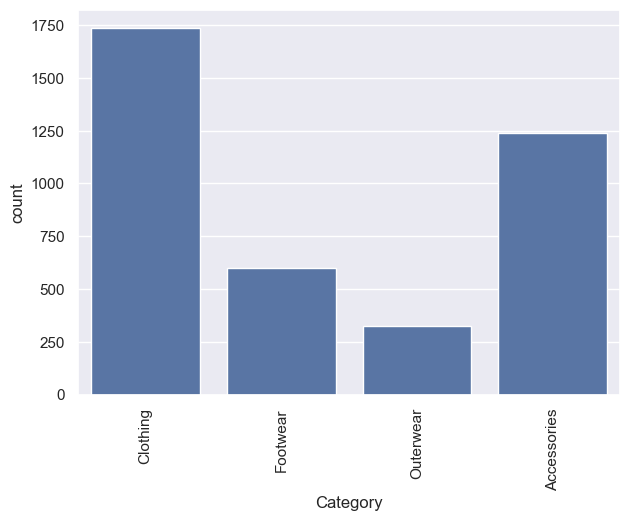

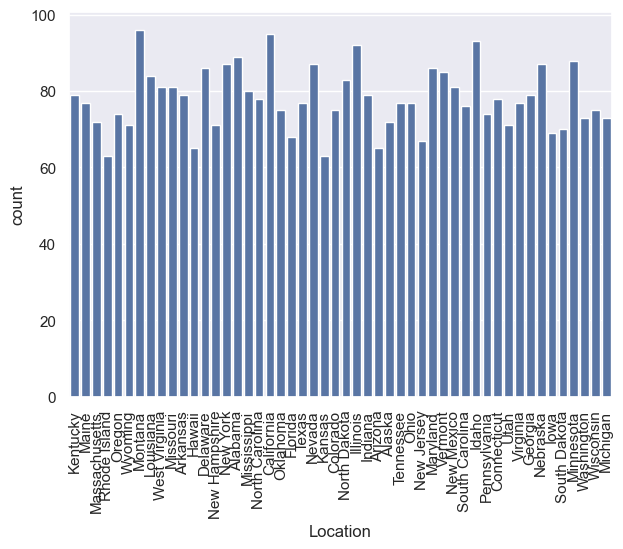

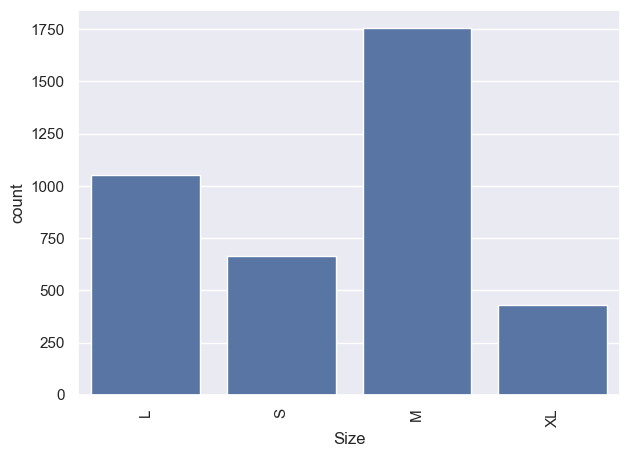

...

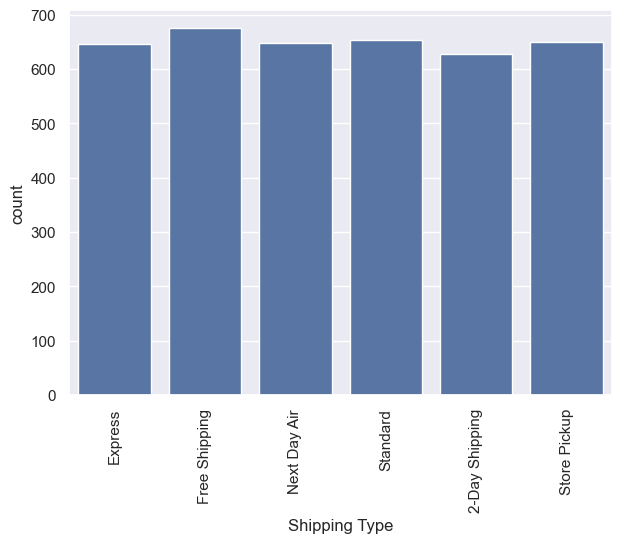

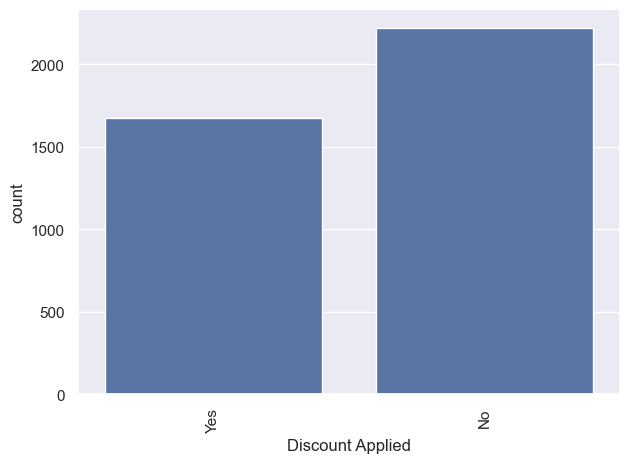

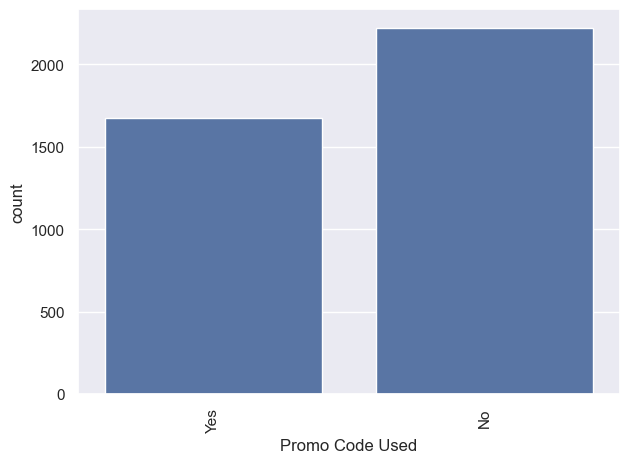

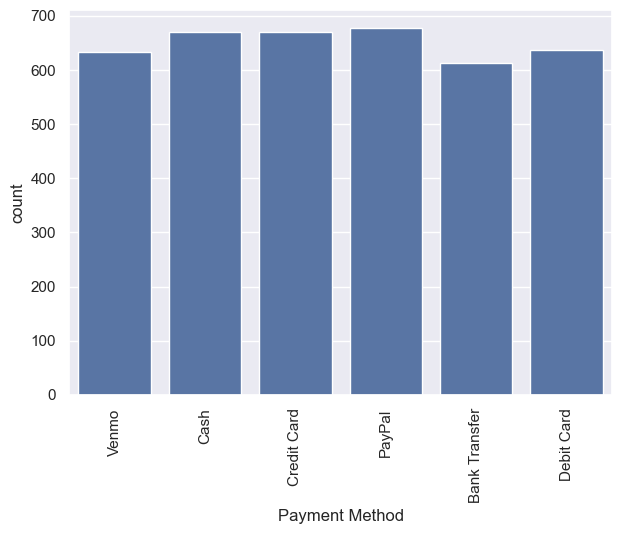

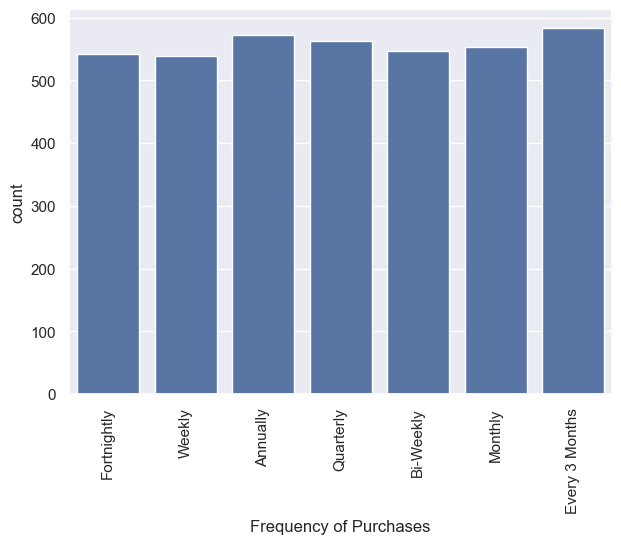

In [131]:
for column in cat_columns:
    plt.figure(figsize = (7, 5))
    sns.countplot(data = df, x = column)
    plt.xticks(rotation = 90)
    plt.show()

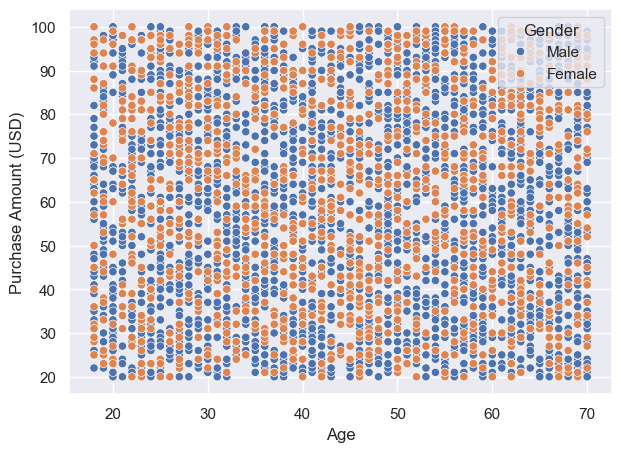

In [132]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Age', y = 'Purchase Amount (USD)', hue = 'Gender')
plt.show()

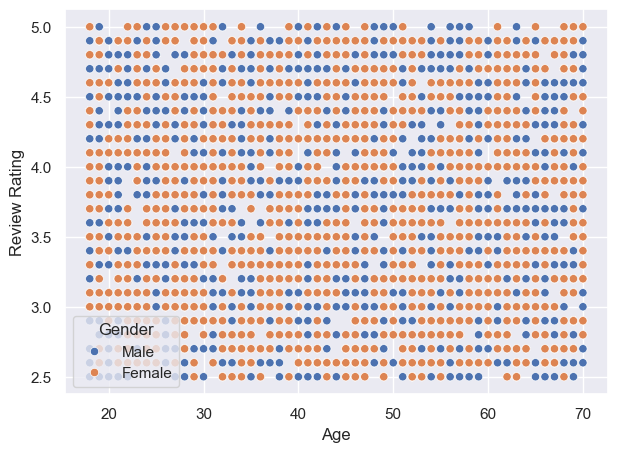

In [137]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Age', y = 'Review Rating', hue = 'Gender')
plt.show()

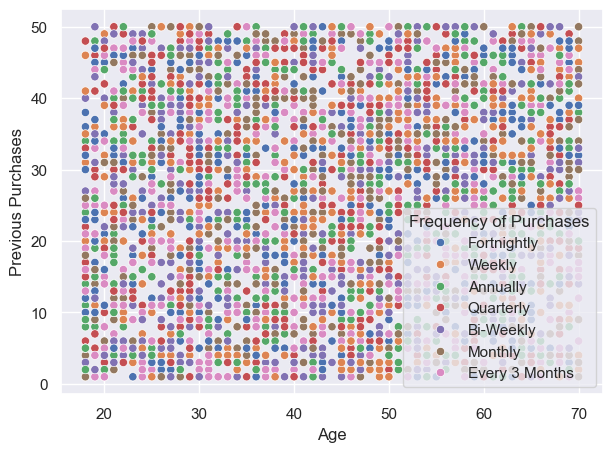

In [141]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Age', y = 'Previous Purchases', hue = 'Frequency of Purchases')
plt.show()

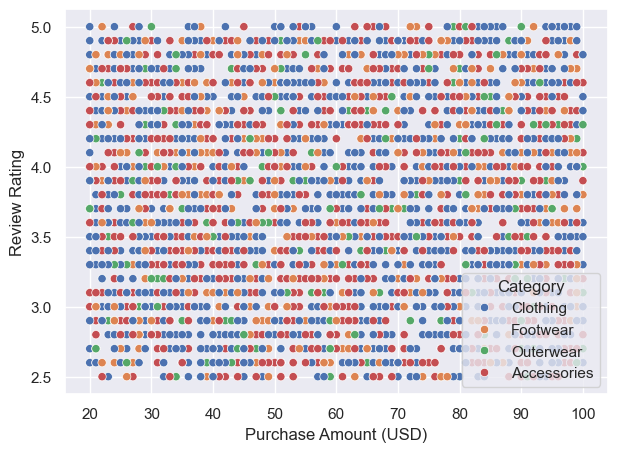

In [143]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Purchase Amount (USD)' , y = 'Review Rating', hue = 'Category')
plt.show()

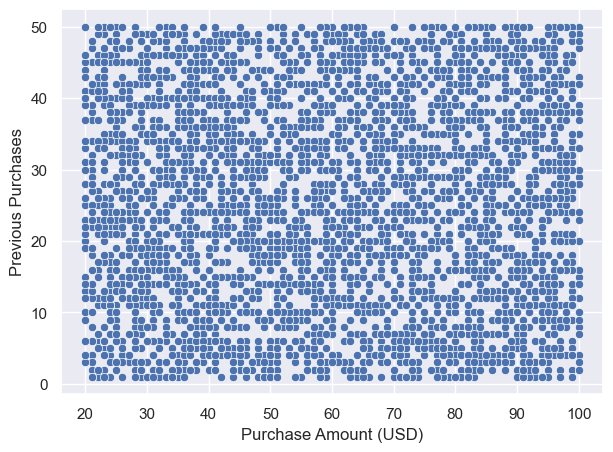

In [144]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Purchase Amount (USD)', y = 'Previous Purchases')
plt.show()

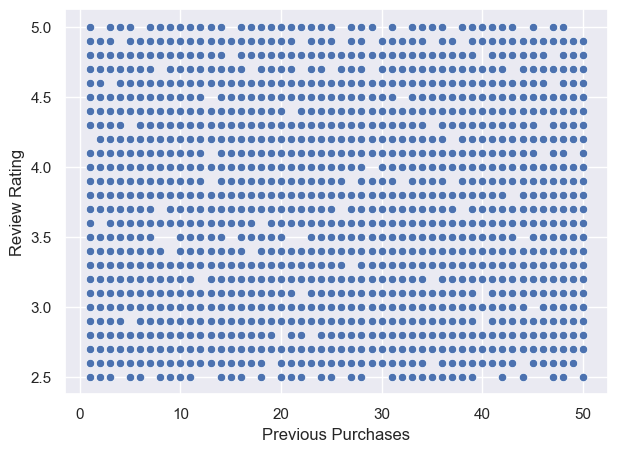

In [145]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Previous Purchases', y = 'Review Rating')
plt.show()

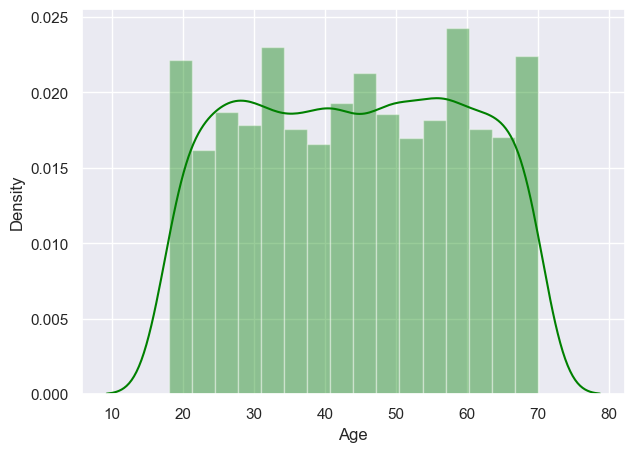

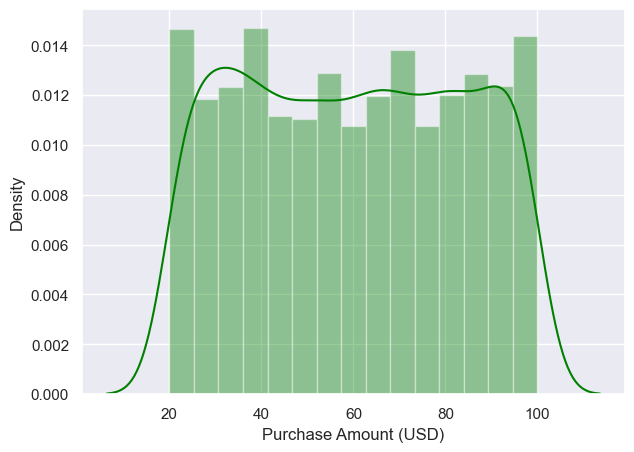

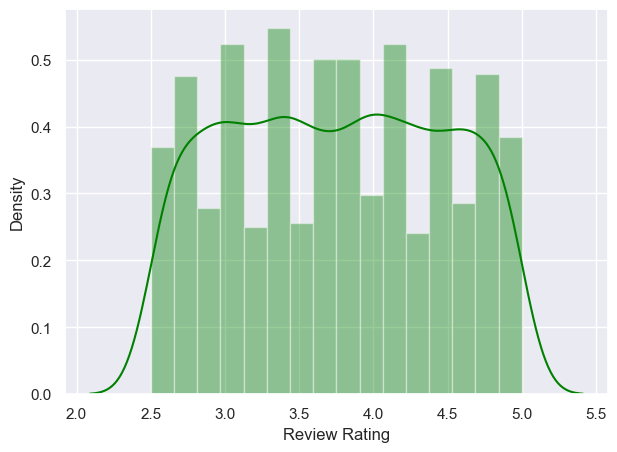

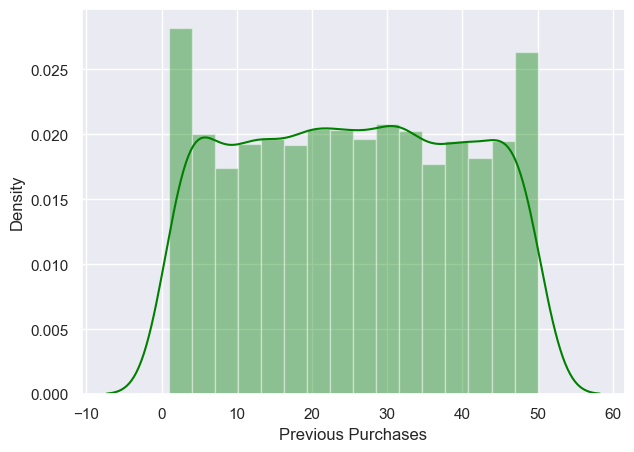

In [148]:
for column in num_columns:
    plt.figure(figsize = (7, 5))
    sns.distplot(df[column], color = 'green')
    plt.show()

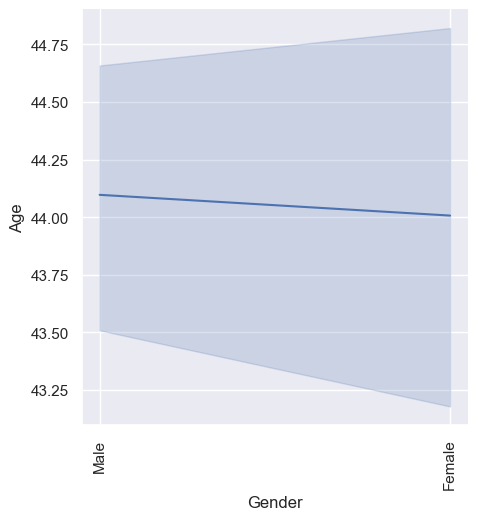

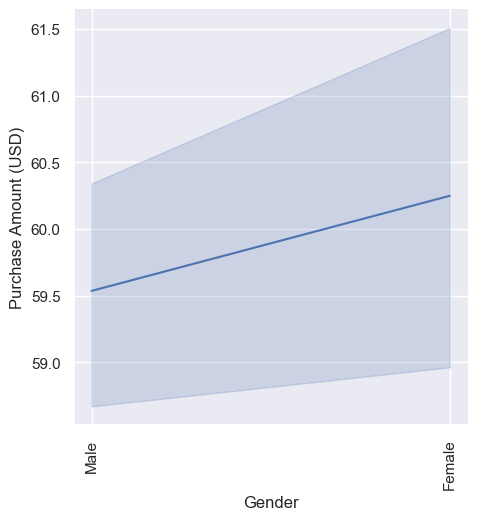

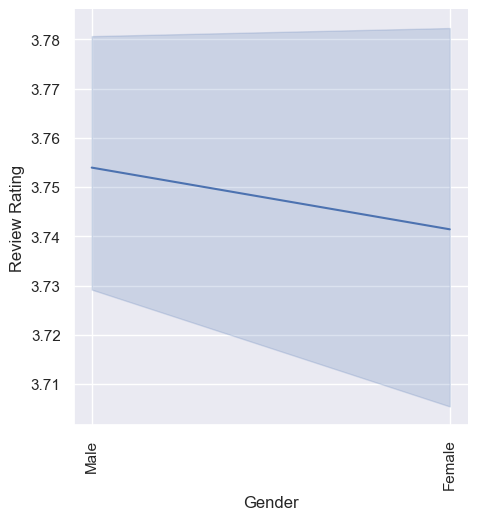

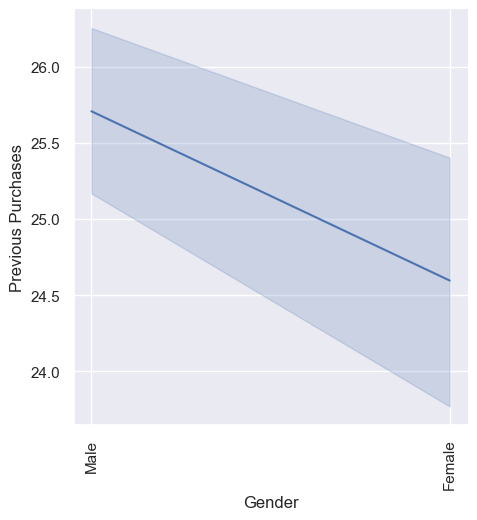

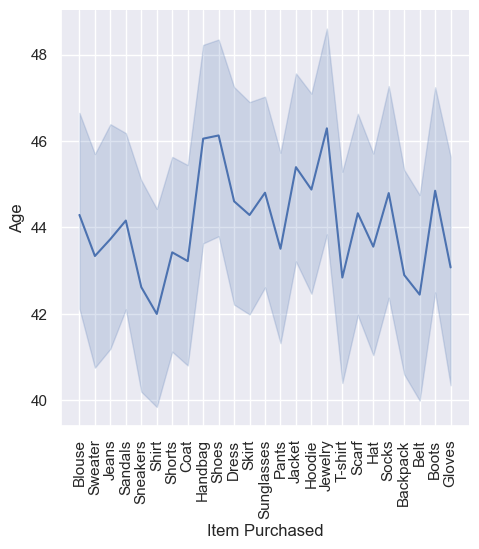

...

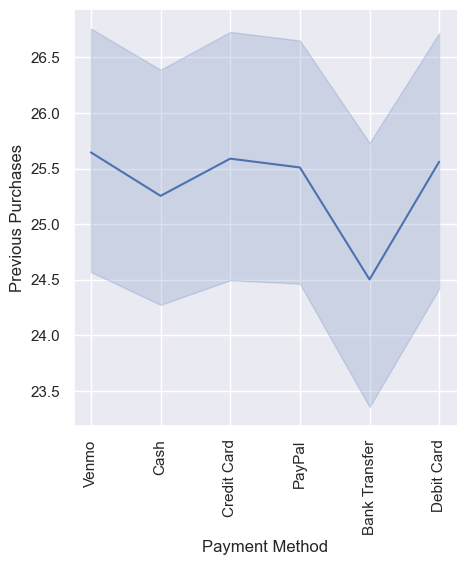

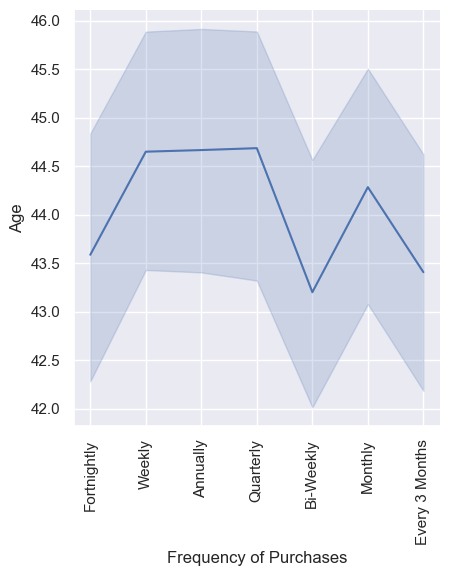

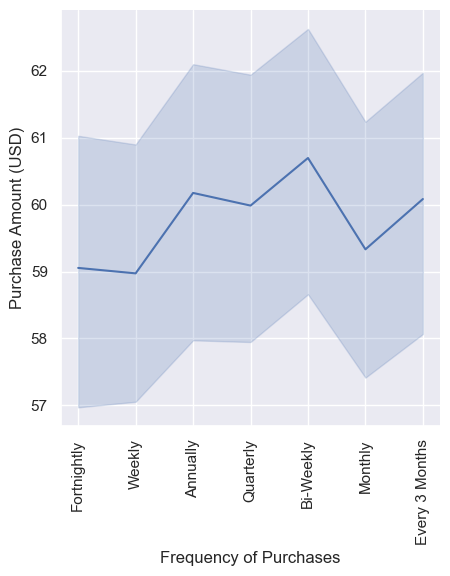

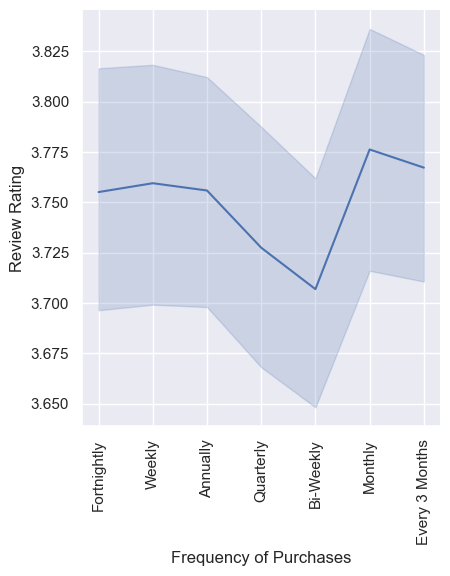

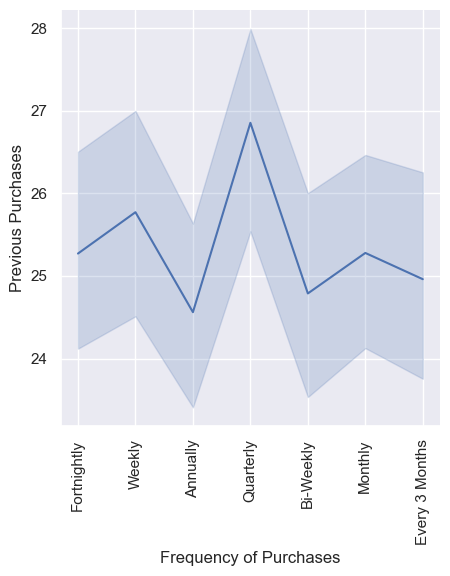

In [150]:
for i in cat_columns:
    for j in num_columns:
        sns.relplot(data = df, x = i, y = j, kind = 'line')
        plt.xticks(rotation = 90)

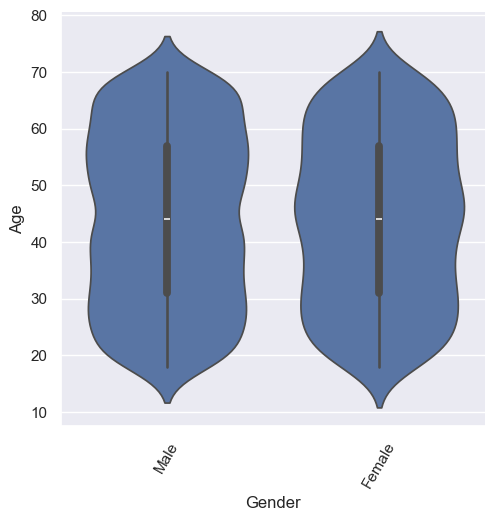

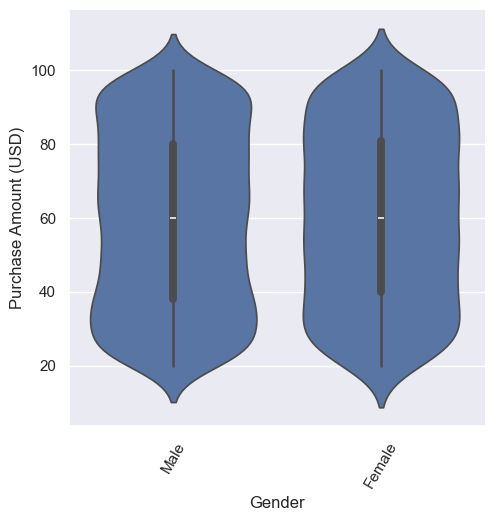

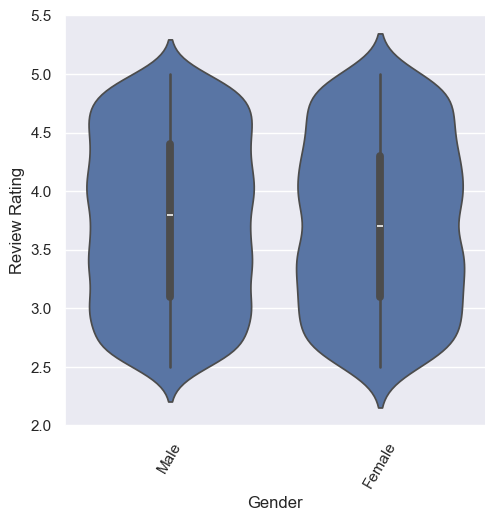

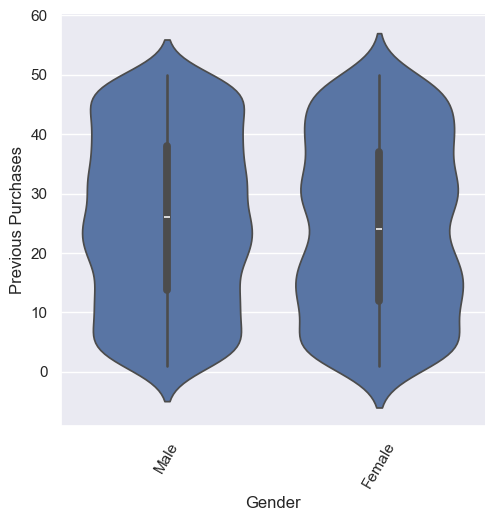

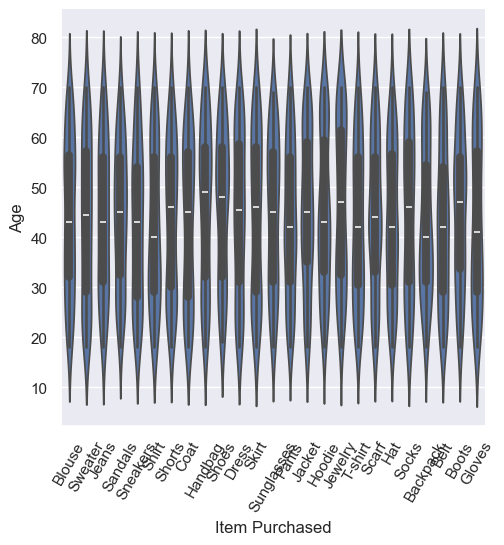

...

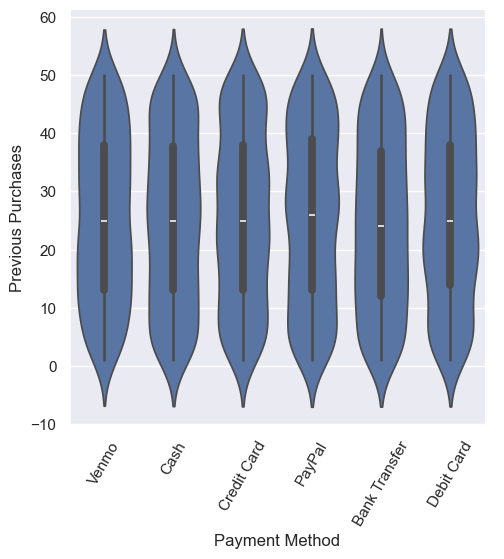

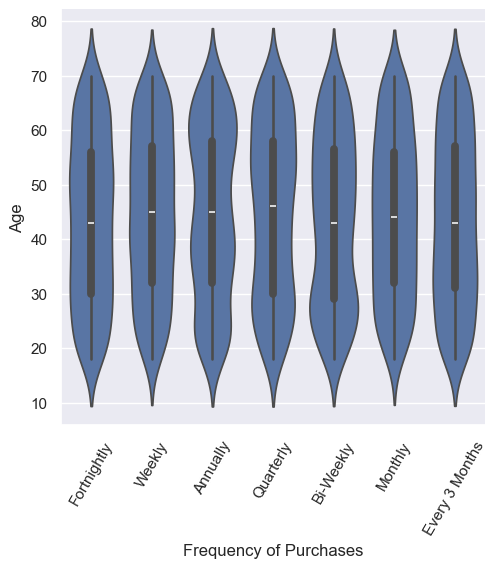

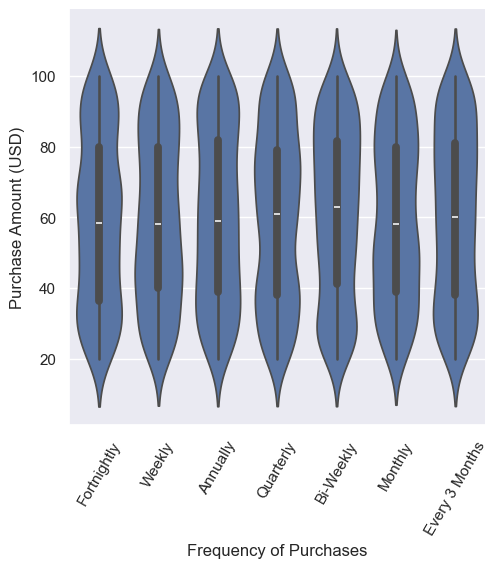

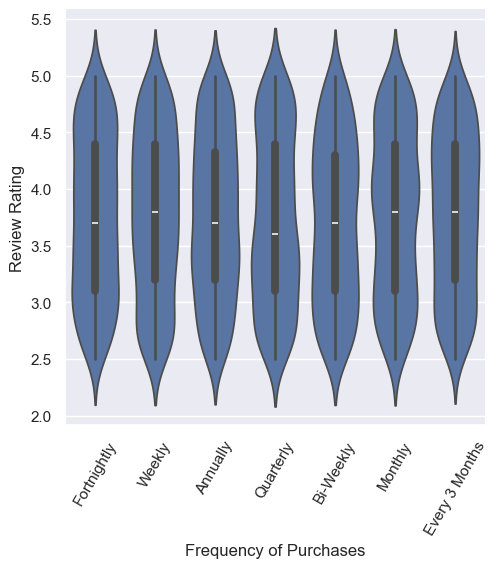

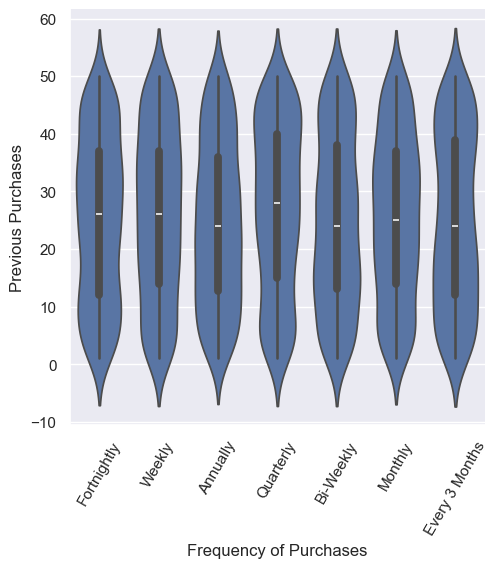

In [152]:
for i in cat_columns:
    for j in num_columns:
        sns.catplot(data = df, x = i, y = j, kind = 'violin')
        plt.xticks(rotation = 60)

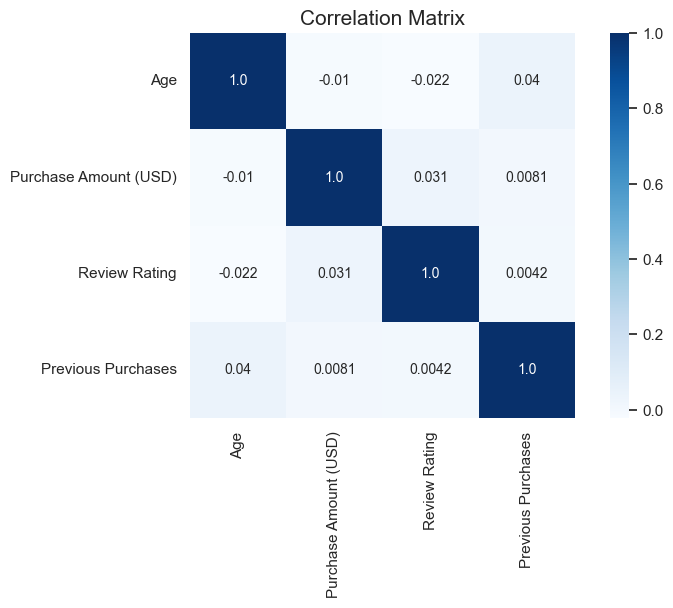

In [153]:
plt.figure(figsize = (9, 5))
sns.heatmap(df.corr(numeric_only = True), annot = True, square = True, cbar = True, annot_kws = {'size' : 10}, fmt = '.2',
            cmap = 'Blues')
plt.title('Correlation Matrix', fontsize = 15)
plt.show()

In [154]:
data = df.copy()

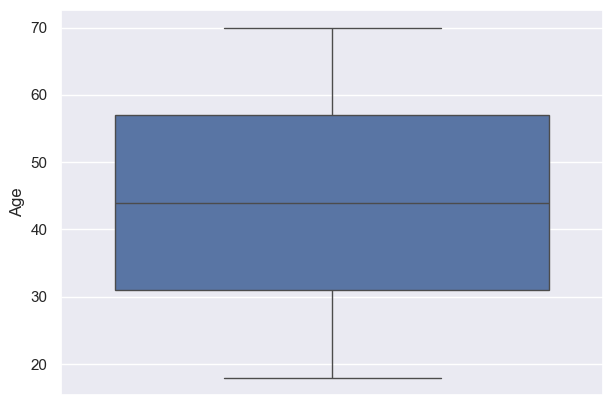

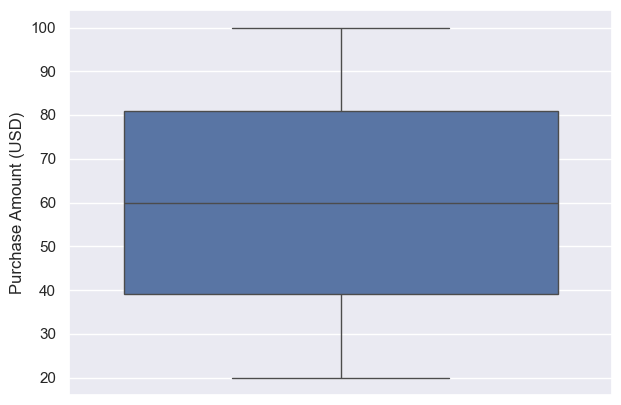

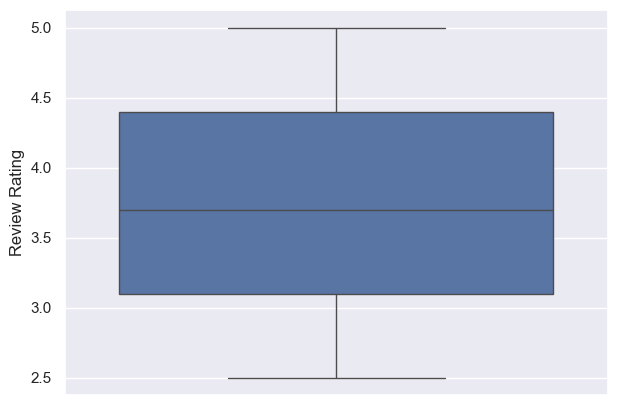

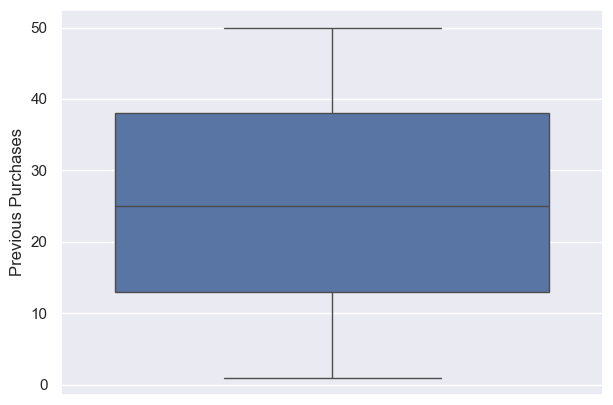

In [155]:
for column in num_columns:
    plt.figure(figsize = (7, 5))
    sns.boxplot(data = df, y = column)
    plt.show()

In [158]:
X1 = df[['Age', 'Purchase Amount (USD)']]

In [159]:
scaler = StandardScaler()

In [160]:
X1_scaled = scaler.fit_transform(X1)

In [161]:
X1_scaled

array([[ 0.71891344, -0.28562864],
       [-1.64862924,  0.17885219],
       [ 0.39008807,  0.55888195],
       ...,
       [ 0.12702777, -1.13013923],
       [-0.00450238,  0.72778407],
       [ 0.52161822,  0.89668619]])

In [169]:
inertia_s, sil = [], []
for i in range(2, 11):
    km = KMeans(n_clusters = i, init = 'k-means++')
    km.fit(X1_scaled)
    inertia_s.append(km.inertia_)
    sil.append(silhouette_score(X1_scaled, km.labels_))

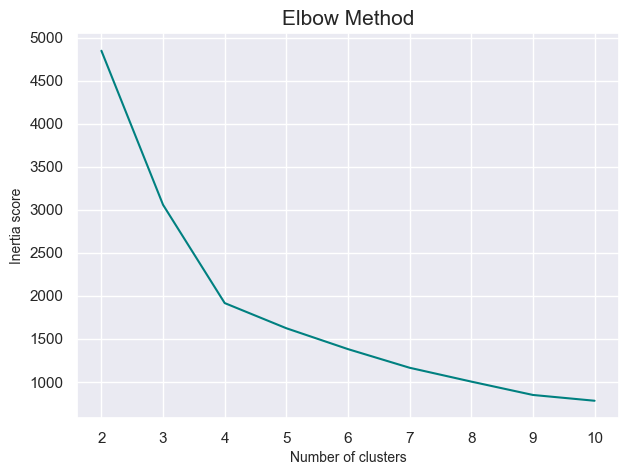

In [170]:
plt.figure(figsize = (7, 5))
plt.plot(range(2, 11), inertia_s, color = 'teal')
plt.title('Elbow Method', fontsize = 15)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Inertia score', fontsize = 10)
plt.show()

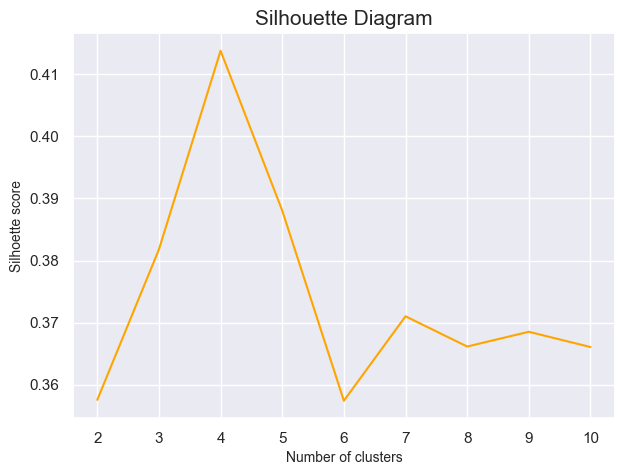

In [171]:
plt.figure(figsize = (7, 5))
plt.plot(range(2, 11), sil, color = 'orange')
plt.title('Silhouette Diagram', fontsize = 15)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Silhoette score', fontsize = 10)
plt.show()

In [173]:
kmeans_model = KMeans(n_clusters = 4, init = 'k-means++')
kmeans_model.fit(X1_scaled)
df['4clusters'] = kmeans_model.labels_

In [174]:
df.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,4clusters
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,2
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,3
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,1
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,3
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,2


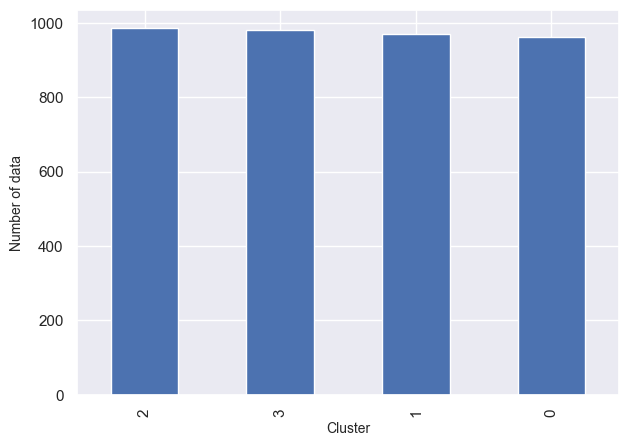

In [176]:
df['4clusters'].value_counts().plot(kind = 'bar', figsize = (7, 5))
plt.xlabel('Cluster', fontsize = 10)
plt.ylabel('Number of data', fontsize = 10)
plt.show()

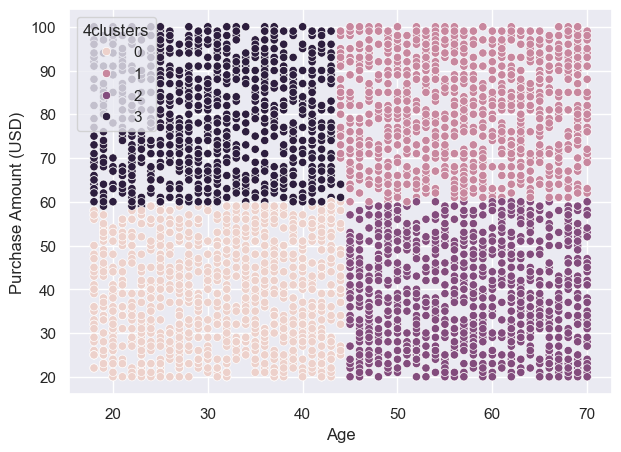

In [177]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Age', y = 'Purchase Amount (USD)', hue = '4clusters')
plt.show()

In [179]:
X2 = df[['Age', 'Review Rating']]

In [180]:
X2_scaled = scaler.fit_transform(X2)

In [184]:
scores, s = [], []
for i in range(2, 11):
    km2 = KMeans(n_clusters = i, init = 'k-means++')
    km2.fit(X2_scaled)
    scores.append(km2.inertia_)
    s.append(silhouette_score(X2_scaled, km2.labels_))

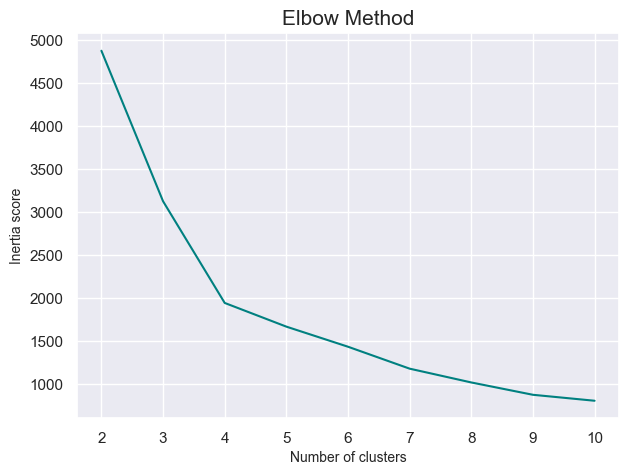

In [185]:
plt.figure(figsize = (7, 5))
plt.plot(range(2, 11), scores, color = 'teal')
plt.title('Elbow Method', fontsize = 15)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Inertia score', fontsize = 10)
plt.show()

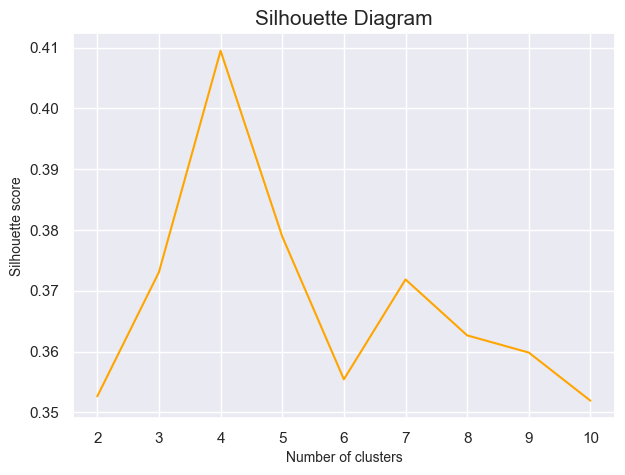

In [186]:
plt.figure(figsize = (7, 5))
plt.plot(range(2, 11), s, color = 'orange')
plt.title('Silhouette Diagram', fontsize = 15)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Silhouette score', fontsize = 10)
plt.show()

In [187]:
kmeans_model2 = KMeans(n_clusters = 4, init = 'k-means++')
kmeans_model2.fit(X2_scaled)
df['4clusters2'] = kmeans_model2.labels_

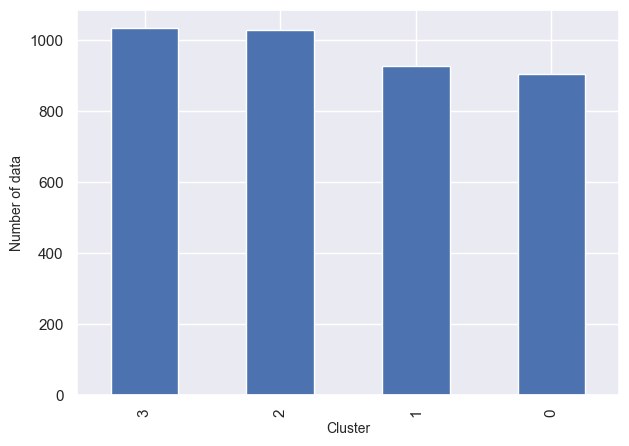

In [188]:
df['4clusters2'].value_counts().plot(kind = 'bar', figsize = (7, 5))
plt.xlabel('Cluster', fontsize = 10)
plt.ylabel('Number of data', fontsize = 10)
plt.show()

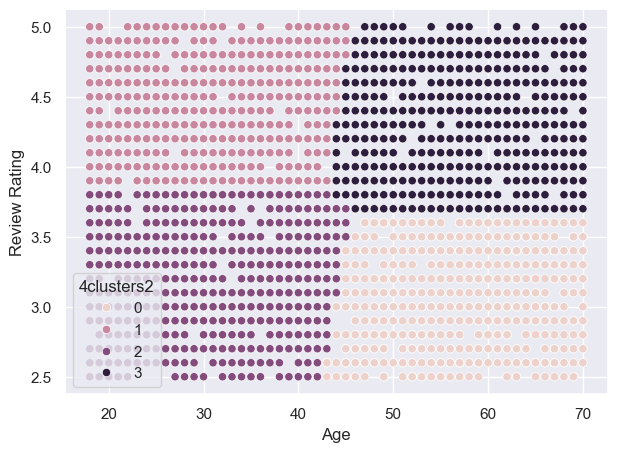

In [189]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Age', y = 'Review Rating', hue = '4clusters2')
plt.show()

In [190]:
df.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,4clusters,4clusters2
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,2,0
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,3,2
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,1,0
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,3,2
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,2,0


In [192]:
df.rename({'4clusters' : 'age/spend', '4clusters2' : 'age/rating'}, axis = 1, inplace = True)

In [193]:
df.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,age/spend,age/rating
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,2,0
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,3,2
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,1,0
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,3,2
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,2,0


In [195]:
df['age/spend'] = df['age/spend'].replace({0 : 'younglow', 1 : 'oldhigh', 2 : 'oldlow', 3 : 'younghigh'})

In [196]:
df.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,age/spend,age/rating
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,oldlow,0
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,younghigh,2
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,oldhigh,0
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,younghigh,2
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,oldlow,0


In [197]:
df_c = df[['Gender', 'age/spend', 'Age']]
pd.pivot_table(df_c, index = 'age/spend', columns = 'Gender', aggfunc = 'count')

Age     
Gender    Female Male
age/spend            
oldhigh      318  651
oldlow       316  670
younghigh    311  671
younglow     303  660

In [198]:
df_c = df[['Category', 'age/spend', 'Age']]
pd.pivot_table(df_c, index = 'Category', columns = 'age/spend', aggfunc = 'count')

Age                          
age/spend   oldhigh oldlow younghigh younglow
Category                                     
Accessories     306    305       316      313
Clothing        440    417       443      437
Footwear        153    164       152      130
Outerwear        70    100        71       83

In [199]:
df_c = df[['Location', 'age/spend', 'Age']]
pd.pivot_table(df_c, index = 'Location', columns = 'age/spend', aggfunc = 'count')

Age                          
age/spend      oldhigh oldlow younghigh younglow
Location                                        
Alabama             21     24        21       23
Alaska              21     11        26       14
Arizona             23     10        20       12
Arkansas            19     19        20       21
California          20     26        24       25
Colorado            14     23        15       23
Connecticut         17     29        12       20
Delaware            15     24        20       27
Florida             10     16        17       25
Georgia             20     19        21       19
Hawaii              16     17        14       18
Idaho               22     26        25       20
Illinois            27     20        24       21
Indiana             25     23        16       15
Iowa                15     13        19       22
Kansas              11     18        16       18
Kentucky            14     21        21       23
Louisiana           26     26        11       21
Maine               15     19        22       21
Maryland            17     34        17       18
Massachusetts       22     17        20       13
Michigan            18     14        24       17
Minnesota           19     26        16       27
Mississippi         17     18        26       19
Missouri            20     21        21       19
Montana             29     17        21       29
Nebraska            28     17        14       28
Nevada              23     18        26       20
New Hampshire       12     22        22       15
New Jersey          13     20        13       21
New Mexico          26     14        19       22
New York            23     23        22       19
North Carolina      22     22        21       13
North Dakota        17     23        27       16
Ohio                22     20        20       15
Oklahoma            15     21        23       16
Oregon              15     21        17       21
Pennsylvania        21     15        27       11
Rhode Island        21     21        13        8
South Carolina      23     24        12       17
South Dakota        21     16        19       14
Tennessee           21     18        18       20
Texas               24     10        19       24
Utah                20     14        19       18
Vermont             16     24        19       26
Virginia            18     16        22       21
Washington          17     18        23       15
West Virginia       26     15        21       19
Wisconsin           16     26        17       16
Wyoming             16     17        20       18

In [201]:
df_c = df[['age/spend', 'Season', 'Age']]
pd.pivot_table(df_c, index = 'Season', columns = 'age/spend', aggfunc = 'count')

Age                          
age/spend oldhigh oldlow younghigh younglow
Season                                     
Fall          257    238       252      228
Spring        243    272       243      241
Summer        233    245       221      256
Winter        236    231       266      238

In [202]:
X3 = df[['Purchase Amount (USD)', 'Review Rating']]

In [203]:
X3_scaled = scaler.fit_transform(X3)

In [204]:
scores3, sil3 = [], []
for i in range (2, 11):
    km3 = KMeans(n_clusters = i, init = 'k-means++')
    km3.fit(X3_scaled)
    scores3.append(km3.inertia_)
    sil3.append(silhouette_score(X3_scaled, km3.labels_))

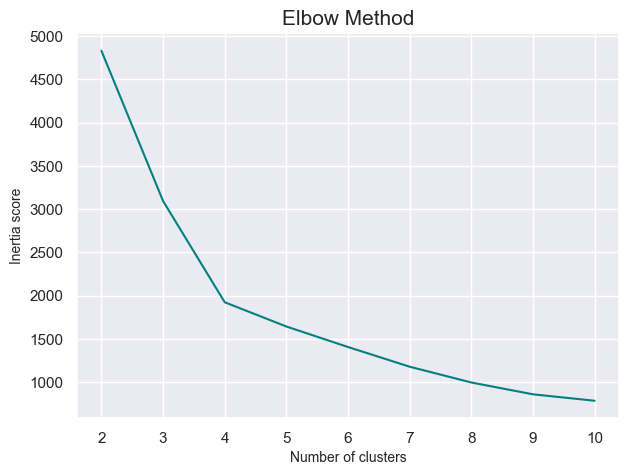

In [205]:
plt.figure(figsize = (7, 5))
plt.plot(range(2, 11), scores3, color = 'teal')
plt.title('Elbow Method', fontsize = 15)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Inertia score', fontsize = 10)
plt.show()

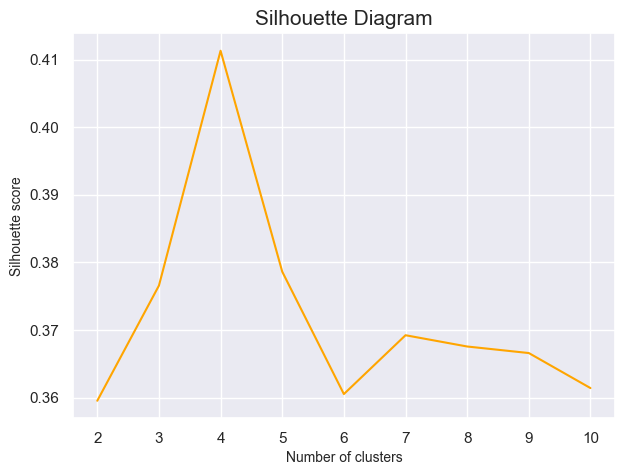

In [206]:
plt.figure(figsize = (7, 5))
plt.plot(range(2, 11), sil3, color = 'orange')
plt.title('Silhouette Diagram', fontsize = 15)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Silhouette score', fontsize = 10)
plt.show()

In [207]:
kmeans_model3 = KMeans(n_clusters = 4, init = 'k-means++')
kmeans_model3.fit(X3_scaled)
df['purchase amount (USD) / rating'] = kmeans_model3.labels_

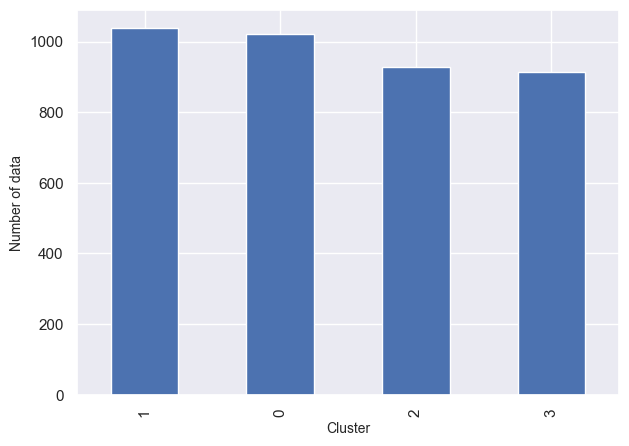

In [209]:
df['purchase amount (USD) / rating'].value_counts().plot(kind = 'bar', figsize = (7, 5))
plt.xlabel('Cluster', fontsize = 10)
plt.ylabel('Number of data', fontsize = 10)
plt.show()

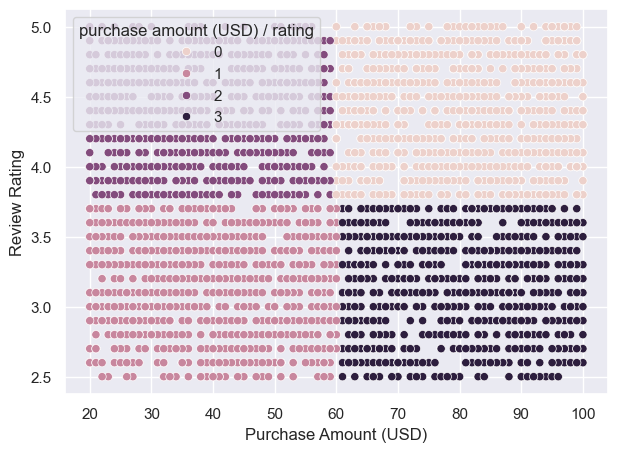

In [210]:
plt.figure(figsize = (7, 5))
sns.scatterplot(data = df, x = 'Purchase Amount (USD)', y = 'Review Rating', hue = 'purchase amount (USD) / rating')
plt.show()

In [212]:
df['purchase amount (USD) / rating'] = df['purchase amount (USD) / rating'].replace({0 : 'hpayhrate', 1 : 'lppaylrate',
                                                                                     2 : 'lpayhrate', 3 : 'hpaylrate'})

In [213]:
df.head()

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,age/spend,age/rating,purchase amount (USD) / rating
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly,oldlow,0,lppaylrate
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly,younghigh,2,hpaylrate
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly,oldhigh,0,hpaylrate
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly,younghigh,2,hpaylrate
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually,oldlow,0,lppaylrate


In [214]:
df_c = df[['purchase amount (USD) / rating', 'Gender', 'Age']]
pd.pivot_table(df_c, index = 'purchase amount (USD) / rating', columns = 'Gender', aggfunc = 'count')

Age     
Gender                         Female Male
purchase amount (USD) / rating            
hpayhrate                         318  704
hpaylrate                         303  610
lpayhrate                         304  623
lppaylrate                        323  715

In [216]:
pd.pivot_table(df_c, index = 'purchase amount (USD) / rating', columns = 'Gender', values = 'Age', aggfunc = 'mean')

Gender,Female,Male
purchase amount (USD) / rating,,
hpayhrate,44.289308,43.811080
hpaylrate,43.597360,44.021311
lpayhrate,43.421053,43.634029
lppaylrate,44.665635,44.847552


In [217]:
df_c = df[['purchase amount (USD) / rating', 'Category', 'Age']]
pd.pivot_table(df_c, index = 'Category', columns = 'purchase amount (USD) / rating', aggfunc = 'count')

Age                               
purchase amount (USD) / rating hpayhrate hpaylrate lpayhrate lppaylrate
Category                                                               
Accessories                          332       283       297        328
Clothing                             442       438       390        467
Footwear                             167       132       156        144
Outerwear                             81        60        84         99

In [218]:
df_c = df[['purchase amount (USD) / rating', 'Location', 'Age']]
pd.pivot_table(df_c, index = 'Location', columns = 'purchase amount (USD) / rating', aggfunc = 'count')

Age                               
purchase amount (USD) / rating hpayhrate hpaylrate lpayhrate lppaylrate
Location                                                               
Alabama                               24        18        24         23
Alaska                                23        24        16          9
Arizona                               22        22         9         12
Arkansas                              20        18        20         21
California                            23        21        26         25
Colorado                              18        11        20         26
Connecticut                           18        11        20         29
Delaware                              17        18        25         26
Florida                               15        12        18         23
Georgia                               17        24        18         20
Hawaii                                 9        21        19         16
Idaho                                 23        24        27         19
Illinois                              23        28        15         26
Indiana                               28        12        13         26
Iowa                                  21        13        19         16
Kansas                                15        12        17         19
Kentucky                              16        17        22         24
Louisiana                             20        16        23         25
Maine                                 17        20        27         13
Maryland                              24        10        19         33
Massachusetts                         21        21        12         18
Michigan                              22        19        18         14
Minnesota                             19        17        24         28
Mississippi                           24        18        19         19
Missouri                              15        26        21         19
Montana                               33        17        21         25
Nebraska                              22        19        19         27
Nevada                                25        24        13         25
New Hampshire                         16        17        13         25
New Jersey                            13        13        21         20
New Mexico                            18        26        21         16
New York                              22        23        20         22
North Carolina                        26        18        17         17
North Dakota                          21        23        20         19
Ohio                                  24        17        15         21
Oklahoma                              17        20        17         21
Oregon                                13        18        25         18
Pennsylvania                          25        23        16         10
Rhode Island                          17        17        13         16
South Carolina                        21        15        18         22
South Dakota                          17        19        15         19
Tennessee                             23        16        18         20
Texas                                 25        18        18         16
Utah                                  19        19        14         19
Vermont                               20        14        22         29
Virginia                              23        16        15         23
Washington                            25        15        16         17
West Virginia                         24        23         9         25
Wisconsin                             21        11        24         19
Wyoming                               18        19        16         18

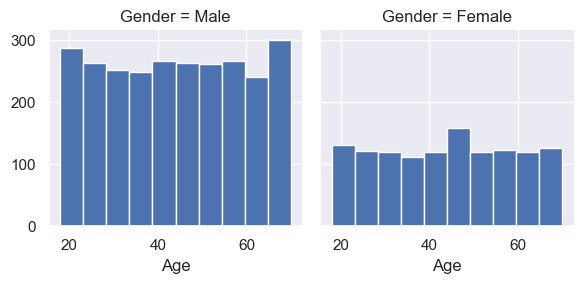

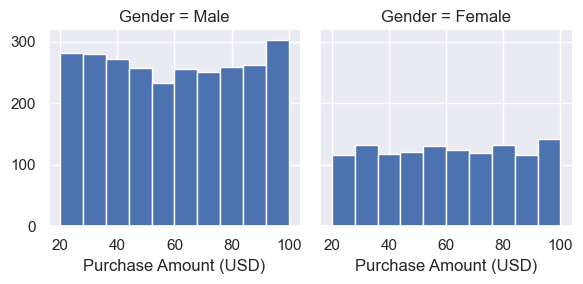

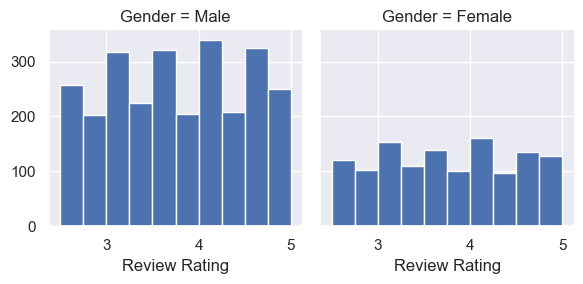

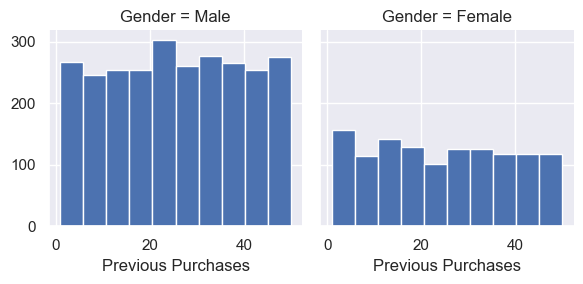

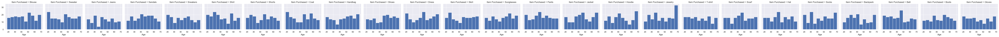

...

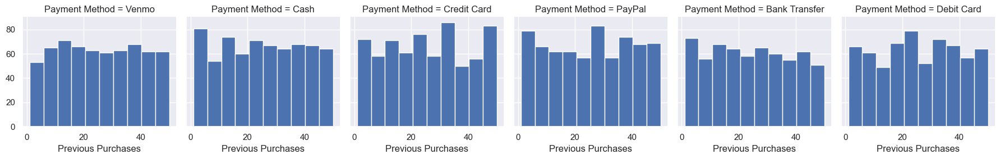

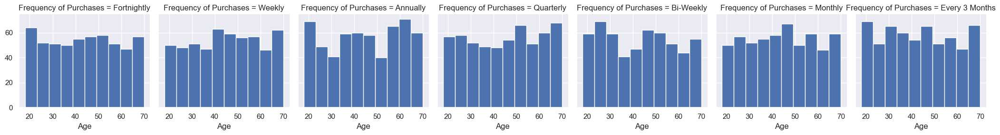

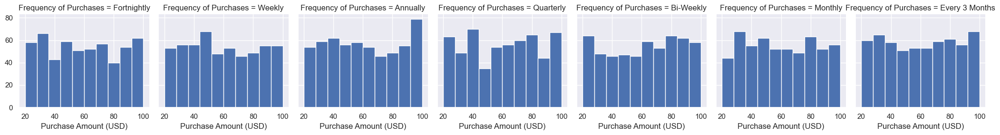

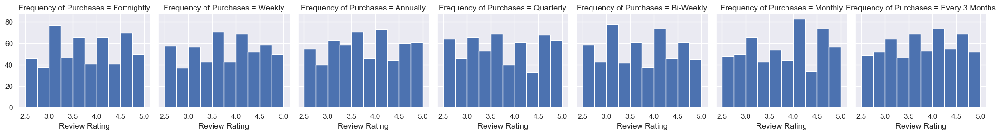

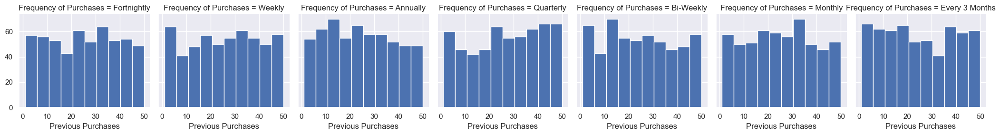

In [219]:
for i in cat_columns:
    for j in num_columns:
        b = sns.FacetGrid(data = df, col = i)
        b.map(plt.hist, j)
        plt.show()

Through the statistical information obtained from the data, the following information is obtained:

1. The average age of customers is 44 years. The youngest customer is 18 years old and the oldest customer is 70 years old. 25% of customers are less than 31 years old, 50% of customers are less than 44 years old, and 75% of customers are less than 57 years old.
2. The average amount paid to buy a product by a customer is nearly 60. The lowest amount paid to buy a product is 20 and the highest amount paid to buy a product is 100. 25% of customers made a purchase less than 39, 50% of customers made a purchase less than 60, and 75% of customers made a purchase less than 81.
3. The average score given by customers as their level of satisfaction with their purchase is equal to 3.74. The lowest score is 2.5 and the highest score is 5. 25% of customers gave a score of less than 3.1, 50% of customers gave a score of less than 3.7 and 75% of customers gave a score of less than 4.4 as the level of satisfaction with their purchase.
4. On average, customers have completed 25 in-store transactions before making their current purchase. The lowest amount of transaction before purchase was equal to 1 and the highest amount of transaction before purchase was equal to 50 transactions. 25% of customers made less than 13 transactions before their current purchase, 50% of customers made less than 25 transactions before their current purchase, and 75% of customers made less than 38 transactions in the store before their current purchase.
5. On average, the highest amount paid for a product was related to T-shirt and Dress products.
6. On average, the lowest amount paid for a product is related to the Jacket product.
7. On average, customers who purchased a Jewelry product had the highest transaction volume prior to their purchase.
8. On average, customers who purchased Jeans had the least number of transactions prior to their purchase.
9. On average, the highest price of the products was related to the products that were in the category of Clothing and Footwear.
10. On average, the lowest price of the products was related to the products that were in the Outerwear category.
11. The lowest average age of customers belongs to the state of Iowa and the highest average age of customers belongs to the states of Indiana and Louisiana.
12. On average, customers from the state of Alaska paid the most for their purchases, and customers from the state of Kansas paid the least for their purchases.
13. On average, customers belonging to the state of Texas have the highest level of satisfaction and customers belonging to the state of West Virginia have the lowest level of satisfaction with their purchases.
14. On average, customers in the state of Hawaii had the most transactions before their current purchase, and customers in the states of Maine and Oklahoma had the least amount of transactions before their current purchase.
15. On average, L size products have the lowest price and L size products have the highest price.
16. On average, the products that are in Green color have the highest price and the products that are in Turquoise color have the lowest price.
17. On average, customers paid more for their purchases in the fall season and paid the least for their purchases in the summer season.
18. On average, customers whose shipping type is Next Day Air and Standard paid less for the purchased product, and customers whose shipping type is 2-Day shipping paid the most for The product has been purchased and paid for.
19. On average, customers who used the Venmo payment method paid the least amount of purchases and customers who used the Debit Card payment method purchased the most amount of purchases from the store.
20. On average, customers who buy from the store once a year, buy the least amount from the store, and customers who buy from the store once every season, have the largest amount of purchase from the store.
21. The most product that women have bought is Blouse and the least product that they have bought is Jeans. The most purchased product by men was Pants, and the least purchased product by men was Boots, Handbag and Jeans.
22. There is a big difference between the amount of jewelry bought by women and men. On average, women have purchased jewelry products for almost 9 dollars more than men.
23. On average, women were the most satisfied with the Handbag product and the least satisfied with the Shirt product. Men were the most satisfied with the Gloves product and the least satisfied with the Hoodie product.
24. On average, both men and women have purchased the most items from the Clothing group and the least purchased items from the Outerwear group.
25. On average, for men, the highest cost paid for a product was for the Footwear product group and the lowest paid cost was for the Outerwear product group. For women, the highest cost paid for a product was for the Accessories product group and the lowest paid cost was for the Outerwear product group.
26. The lowest average age of female buyers from the store was from the state of Maine, and the highest average age of female buyers was from the states of Louisiana and Missouri. The lowest average age of male shoppers from the store belongs to the state of Hawaii and the highest average age of male shoppers from the store belongs to the state of Indiana.
27. On average, women from the state of Kansas had the least amount of purchases from the store, and women from the state of Alaska had the most amount of purchase from the store. Men in the state of Connecticut had the least amount of purchases from the store, and men in the states of Pennsylvania and West Virginia had the most amount of purchases from the store.
28. On average, women in the state of Oklahoma had the lowest level of satisfaction, and women in the states of Mississippi and Texas had the highest level of satisfaction. Men from the states of Florida, Illinois, Georgia and New Hampshire have the lowest level of satisfaction and men from the states of Maine and Wisconsin have the highest level of satisfaction.
29. The lowest number of female shoppers from the store belonged to the state of Hawaii, and the highest number of female shoppers from the store belonged to the state of Montana. The lowest number of male buyers from the store belonged to the state of Kansas and the highest number of male buyers from the store belonged to the state of California.
30. The lowest amount of women's purchase was from products with Turquoise and Beige colors and the highest amount of women's purchase was from products with Yellow color. The lowest amount of men's purchase was from products with Brown, Magenta and Pink colors, and the highest amount of men's purchase was from products with Teal color.
31. On average, women paid the least for products with Indigo color and paid the most for products with Charcoal color. Men have paid the least for products with Magenta and Turquoise colors and have paid the most for Green.
32. On average, women were the least satisfied with the products whose color was Beige and they were the most satisfied with the products whose color was Gray and Maroon. Men were the least satisfied with the products whose color was Bige, Blue and Green, and they were the most satisfied with the products whose color was Black, Gray, Orange and Yellow.
33. On average, women and men have bought a larger amount from the store in the fall season. Women in the spring season and men in the summer season had the least purchases from the store.
34. None of the female customers have purchased a subscription from the store, and nearly 40% of the male customers have a subscription to the store.
35. None of the female customers have used a discount code in their purchases, and almost 63% of male customers have used a discount code in their purchases.
36. The pattern of buying every two weeks is less observed in female customers, and the pattern of shopping once a week in the store is also less observed in male customers.
37. On average, women who shop at the store every three months, buy a larger amount from the store, and women who shop at the store every week, buy the least amount from the store. Men who shop at the store every week buy more at the store.
38. In the Accessories group, the most purchases were made from Jewelry products and the least purchases were made from Handbag and Hat products. In the Clothing group, the most purchases were from Blouse and Pants and the least from Jeans. In the Footwear group, the most purchases were from Sandal products and the least purchases were from Boots products.
39. In the fall season, the least purchases were made from Skirt products and the most purchases were made from Dress, Shorts and Sneakers products. In the spring season, the least purchases were made from Coat and Jewelry products, and the most purchases were made from T-shirt products. In the summer season, the least purchase was made from shirt product and the most purchase was made from Scarf. In the winter season, the least purchase of the Coat product and the most purchase of the Backpack product have been made.
40. In the autumn season, the lowest price was paid for buying Skirt and the highest price was paid for buying Dress, Shorts and Sneakers. In the spring season, the lowest price was paid for the purchase of Coat and Jewelry, and the highest price was paid for the purchase of T-shirt. In the summer season, the lowest price was paid for buying a shirt and the highest price was paid for buying a scarf. In the winter season, the lowest price was paid for the purchase of Coat and the highest price was paid for the purchase of Boots.
41. The lowest purchase of a product without using a discount code was the Jeans product, and the highest purchase of a product without a discount code was the Blouse product. The least purchase of a product with a discount code was Socks, and the most purchase of a product with a discount code was Pants.
42. In the accessories group, the most purchases were made from products with blue color and the least purchased from products with pink color. In the Clothing group, Teal products are the most purchased and Blue products are the least purchased. In the Footwear group, the most purchases were made from products with olive color and the least purchased from products with charcoal color. In the Outerwear group, products with blue color are the most purchased and products with maroon, orange and peach colors are the least purchased.
43. In the Accessories group, products with Black color were the most satisfied and products with Indigo color were the least satisfied. In the Clothing group, products with Black, Magenta, Orange and Yellow colors were the most satisfied and products with Blue color were the least satisfied. In the footwear group, products with red color were the least satisfied, and products with gray color were the most satisfied. In the Outerwear group, hats with charcoal color were the most satisfied and products with beige color were the least satisfied.
44. In the Accessories group, the highest amount of purchase is every season and the lowest amount of purchase is every two weeks. In the Clothing group, the highest amount of purchase is once every three months and the lowest amount of purchase is once every two weeks. In Footwear group, the highest amount of purchase is every two weeks and the lowest amount of purchase is every month. In the Outerwear group, the highest amount of shopping is every two weeks and the lowest amount of shopping is every week.
45. Customers who buy from the Accessories group every week, buy the largest amount from this group, and customers who buy from the Accessories group every two weeks or every month, buy the least amount from this group. Customers who buy from the clothing group every week buy the least amount from this group. Customers who buy from the Outerwear group every week, buy the least amount from this group, and customers who buy from this group twice a week, buy the largest amount from this group.
46. In the autumn season, the least purchases were made from the products that had the color White, and the most purchases were made from the products that had the color Yellow. In the spring season, the least purchases were made from products that had red color and the most purchases were made from products that had olive color. In the summer season, the least purchase was made of the products whose color was Peach, and the most purchase was made of the products whose color was Teal. In the winter season, the least purchases were made from the products whose color was Gray and the most purchases were made from the products whose color was Green.
47. Customers who shop at the store every year, often make their purchases in the fall season and less often in the winter season. Customers who shop twice a week are more likely to shop in the spring and are less likely to shop in the fall.
48. In the fall, most of the customers are annual customers. In the spring season, most customers shop at the store twice a week. In the summer season, most of the customers who shop at the store once in three months make their purchases. In the winter season, there are often customers who shop at the store every week.
49. Customers who buy at the store annually pay the highest amount for the Accessories group and the lowest amount for the Outerwear group. Customers who shop at the store twice a week pay the highest amount for the Outerwear group and the lowest amount for the Clothing group. Customers who shop at the store every three months pay the highest amount for the Clothing and Footwear groups and the lowest amount for the Outerwear group. Customers who shop at the store every month pay the highest amount for the Clothing group and the lowest amount for the Outerwear group. Customers who shop at the store every season pay the most for the Clothing and Outerwear groups and the least for the Outerwear group. Customers who shop at the store every week pay the highest amount for the Accessories group and the lowest amount for the Outerwear group.
50. Male customers of the store are almost twice as many as female customers.
51. The most products purchased from the store are Blouse, Shirt, Pants, and Jewelry, and the least purchased product from the store is Jeans.
52. The most products were purchased from the Clothing group and the least from the Outerwear group.
53. The states of Montana, California, Illinois and Idaho had the highest number of store buyers, and the states of Rhode Island, Hawaii and Kansas had the lowest number of store buyers.
54. The most purchased size was M size and the least purchased size was XL size.
55. Products with Silver, Olive and Yellow colors have been purchased more, and products with Gold and Brown colors have been purchased less.
56. In the spring season, the store had the highest sales and in the summer season, the store had the lowest sales.
57. More than 2.5 times of customers do not subscribe to the store.
58. Most of the customers have not used the discount code for their purchases.
59. Customers of the store have often paid their purchases by PayPal, Credit Card and cash, and they have used the Bank Transfer method less.
60. Store customers often buy from the store annually or quarterly.
61. The average age of customers who buy Handbag, Shoes and jewelry products is higher than the average age of other customers who buy other products. The average age of customers who buy Shirt products is lower than other customers who buy other products.
62. The state of Montana has a higher number of customers who are older and made a larger purchase, and the state of Kansas has lower numbers of customers who are older and made a larger purchase.
63. The state of Maryland has the highest number of customers who are old and have purchased a small amount, and the states of Arizona and Texas have the lowest number of customers who are old and have purchased a small amount.
64. The states of North Dakota and Pennsylvania have the highest number of customers who are young and spend a large amount of money, and the state of Louisiana has the lowest number of customers who are young and spend a large amount of money.
65. The state of Nebraska has the highest number of customers who are young and make small purchases, and the state of Rhode Island has the lowest number of customers who are young and make small purchases.
66. Montana has more satisfied customers than any other state. In the state of Hawaii, the number of customers who made a large purchase at the store and had a large amount of waste is less than in other states.
67. In Illinois, the number of customers who made a large purchase at a store and had little satisfaction is higher than in any other state. In the state of Maryland, the number of customers who made a large purchase at a store and were not satisfied is lower than in other states.
68. In Maine, the number of customers who have made a small purchase at a store and are highly satisfied is higher than in any other state. In the state of Arizona, the number of customers who made a small purchase at a store and were highly satisfied is lower than in other states.
69. In the state of Maryland, the number of customers who made a small purchase at the store and had a low satisfaction is higher than in any other state. In the state of Alaska, the number of customers who made a small purchase at the store and were also low satisfaction is lower than in other states.